<a href="https://colab.research.google.com/github/rtegao/M5Forecasting/blob/master/FOODS_3_495_WI_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing Libraries

In [0]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras import optimizers, regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from sklearn.preprocessing import MinMaxScaler

# Importing Dataset

In [0]:
dataset = pd.read_csv('/content/drive/My Drive/Specialization/Projects/Recurrent Neural Networks/M5 - Data/sales_train_validation.csv')

# Functions

In [0]:
def normalizing_data(df_train,df_val,df_test):
  try:
    data_list = [df_train.copy(),df_val.copy(),df_test.copy()]
    min_list = df_train.min(axis=0)
    max_list = df_train.max(axis=0)
    for j in range(len(data_list)):
      for i in range(df_train.shape[1]):
        data_list[j].iloc[:,i] = (data_list[j].iloc[:,i]-min_list[i])/abs((min_list[i]-max_list[i]))
      data_list[j]=data_list[j].values
  except:
    df_train = df_train.values.reshape(-1,1)
    df_val = df_val.values.reshape(-1,1)
    df_test = df_test.values.reshape(-1,1)

    data_list = [df_train.copy(),df_val.copy(),df_test.copy()]
    min_list = df_train.min(axis=0)
    max_list = df_train.max(axis=0)
    for j in range(3):
      for i in range(df_train.shape[1]):
        data_list[j][:,i] = (data_list[j][:,i]-min_list[i])/abs((min_list[i]-max_list[i]))
        # data_list[j] = (data_list[j]-min_list)/abs((min_list-max_list))

  df_train_norm = data_list[0].copy()
  df_val_norm = data_list[1].copy()
  df_test_norm = data_list[2].copy()

  print(df_train_norm.max(axis=0))
  print(df_train_norm.min(axis=0))
  print('\n')

  print(df_val_norm.max(axis=0))
  print(df_val_norm.min(axis=0))
  print('\n')

  print(df_test_norm.max(axis=0))
  print(df_test_norm.min(axis=0))

  print('-------------------------')

  print(df_train_norm.shape)
  print(df_val_norm.shape)
  print(df_test_norm.shape)
  return df_train_norm,df_val_norm,df_test_norm

In [0]:
def Regressor(future_steps,time_steps,n_features,df_train,df_val,df_test):
  # future_steps: how many days in the furure to predict 
  # time_steps: number of samples the LSTM model will use for predict 28 days in the future
  # n_features: number of features (LSTM input) 

  #################### TRAIN #################################################
  # Defining the number of samples for the train data
  n_samples = df_train.shape[0]
  x_train = []
  y_train = []

  # shaping data to have the number of time_steps in the x_train ans the 28 future values in the y_train 
  for i in range(time_steps,n_samples - time_steps): 
    x_train.append(df_train[i - time_steps : i, :]) 
    y_train.append(df_train[i : i+future_steps,-1]) 

  x_train,y_train = np.array(x_train),np.array(y_train) # transforming in array
  # LSTM need 3D tensor as input 
  x_train = np.reshape(x_train,(x_train.shape[0],x_train.shape[1],n_features))  

  ##################### VALIDATION ###############################################

  # to predict the first 28 values of the validation data, LSTM need time_steps values. 
  # to make this possible I'm using the last 60 values that came before the validation data.
  df_val = np.concatenate((df_train[-time_steps:],df_val))

  n_samples = df_val.shape[0]
  x_val = []
  y_val = []

  for i in range(time_steps,n_samples - time_steps):
    x_val.append(df_val[i - time_steps : i, :]) 
    y_val.append(df_val[i : i+future_steps,-1]) 

  x_val,y_val = np.array(x_val),np.array(y_val)
  x_val = np.reshape(x_val,(x_val.shape[0],x_val.shape[1],n_features))

  ####################### TEST ################################################
  # the same methodologie implemented in training and validation data are here in the test data

  df_test = np.concatenate((df_val[-time_steps:],df_test))
  n_samples = df_test.shape[0]
  x_test = []
  y_test = []

  for i in range(time_steps,n_samples - time_steps):
    x_test.append(df_test[i - time_steps : i, :]) 
    y_test.append(df_test[i : i+future_steps,-1]) 

  x_test,y_test = np.array(x_test),np.array(y_test)
  x_test = np.reshape(x_test,(x_test.shape[0],x_test.shape[1],n_features))

  x_train = x_train.astype(np.float32)
  y_train = y_train.astype(np.float32)

  x_val = x_val.astype(np.float32)
  y_val = y_val.astype(np.float32)

  x_test = x_test.astype(np.float32)
  y_test = y_test.astype(np.float32)
  
  return x_train,x_test,x_val,y_train,y_val,y_test

# Filtering Product

In [0]:
df_food =  dataset.iloc[dataset[dataset['id'] == 'FOODS_3_495_WI_3_validation'].loc[:,'d_1':].index[0],6:]

# Spliting Data

In [6]:
train_limit = int(round((df_food.shape[0])*0.7,0))
val_limit = int(round((df_food.shape[0])*0.85,0))

df_train = df_food[:train_limit]
df_val = df_food[train_limit:val_limit]
df_test = df_food[val_limit:]

print(df_train.shape)
print(df_val.shape)
print(df_test.shape)

(1339,)
(287,)
(287,)


# Normalizing data

In [7]:
df_train_norm,df_val_norm,df_test_norm = normalizing_data(df_train,df_val,df_test)

[1.0]
[0.0]


[0.8]
[0.0]


[0.6666666666666666]
[0.0]
-------------------------
(1339, 1)
(287, 1)
(287, 1)


# Data Preprocessing

In [0]:
time_steps = 60
future_steps = 28
n_features = df_train_norm.shape[1]
x_train,x_test,x_val,y_train,y_val,y_test = Regressor(future_steps = future_steps,time_steps = time_steps,n_features = n_features,df_train = df_train_norm,df_val = df_val_norm,df_test = df_test_norm)

# LSTM

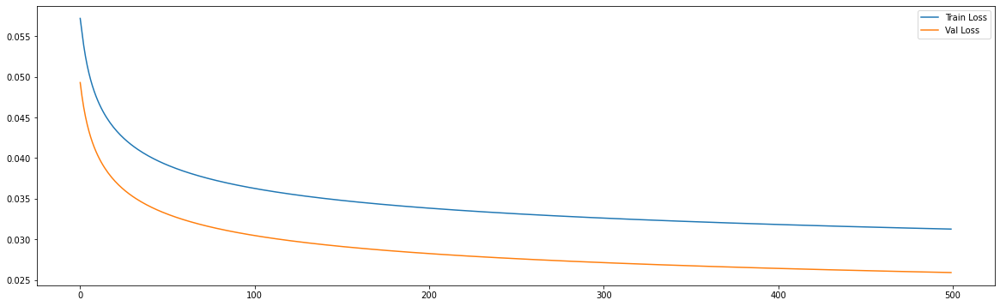

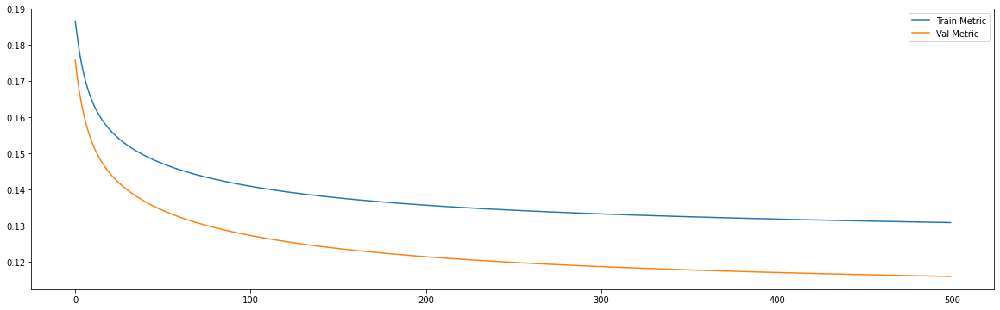



39/39 [==============================] - 0s 6ms/step - loss: 0.0313 - mae: 0.1309
loss and metric train data [0.031252045184373856, 0.13091285526752472]
8/8 [==============================] - 0s 5ms/step - loss: 0.0259 - mae: 0.1160
loss and metric val data [0.025902604684233665, 0.11603665351867676]
8/8 [==============================] - 0s 6ms/step - loss: 0.0254 - mae: 0.1214
loss and metric test data [0.025382155552506447, 0.12140325456857681]


In [0]:
regressor = Sequential()
regressor.add(LSTM(units=50, return_sequences=False, input_shape=(time_steps, n_features))) # return_sequences=False next layer is not LSTM
regressor.add(Dense(units=future_steps))

#Compiling the LSTM
mom = optimizers.SGD(lr=0.001, decay=1e-02, momentum=0.9,nesterov=True)
# adam = optimizers.Adam(lr = 0.001, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
# sgd = optimizers.SGD(lr=0.001, decay=1e-02, momentum=0.9,nesterov=True)
regressor.compile(optimizer = mom, loss = 'mse', metrics=['mae'])

#Fitting to traning set
history = regressor.fit(x_train, y_train, validation_data=(x_val,y_val), 
                        epochs = 500, batch_size=60, verbose = 0, shuffle= False)

plt.figure(figsize=(20,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Val Loss'])

plt.figure(figsize=(20,6))
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.legend(['Train Metric', 'Val Metric'])
plt.show()

print('\n')
print('loss and metric train data',regressor.evaluate(x_train,y_train))
print('loss and metric val data',regressor.evaluate(x_val,y_val))
print('loss and metric test data',regressor.evaluate(x_test,y_test))

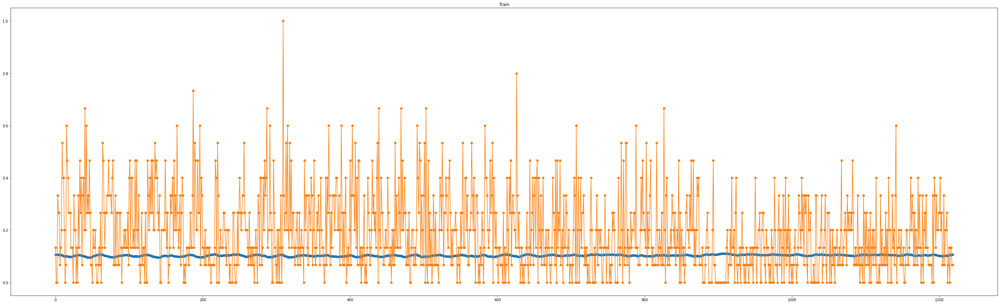

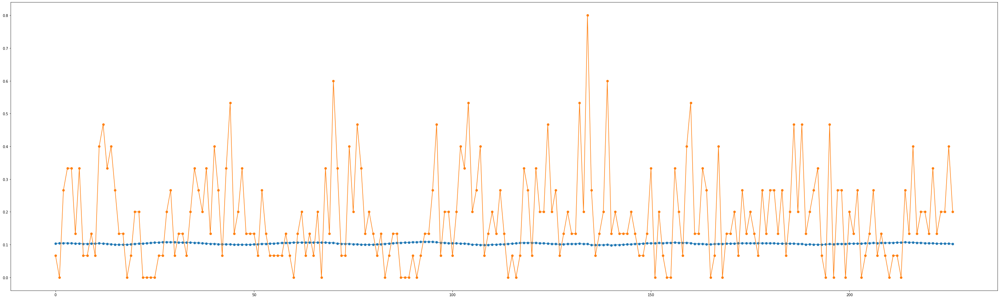

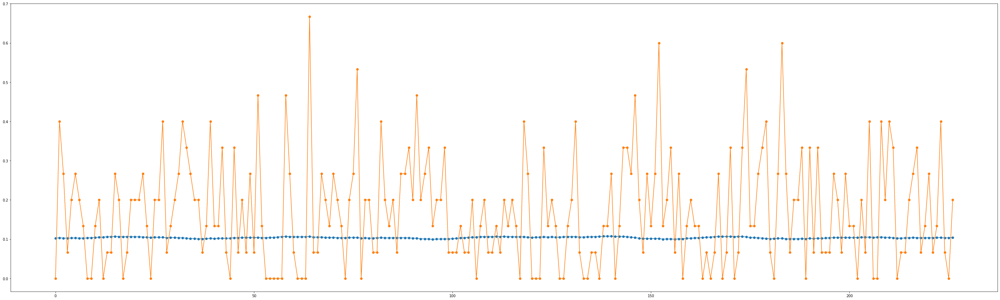

In [0]:
y_train_predict = regressor.predict(x_train)
y_val_predict = regressor.predict(x_val)
y_test_predict = regressor.predict(x_test)

plt.figure(figsize=(50,15))
plt.plot(y_train_predict[:,0],marker='o')
plt.plot(y_train[:,0],marker='o')
plt.title('Train')
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_val_predict[:,0],marker='o')
plt.plot(y_val[:,0],marker='o')

plt.figure(figsize=(50,15))
plt.plot(y_test_predict[:,0],marker='o')
plt.plot(y_test[:,0],marker='o')

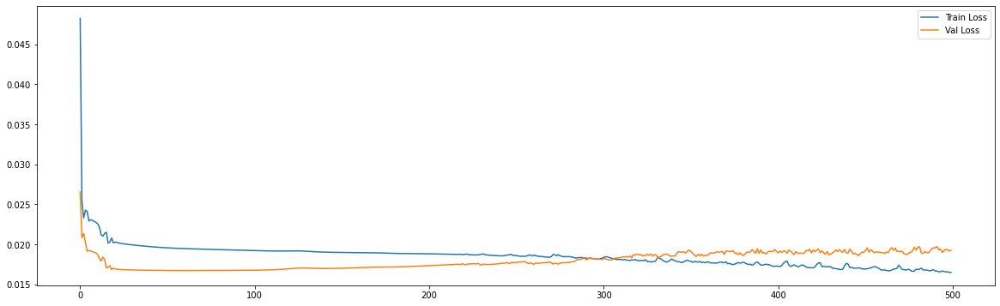

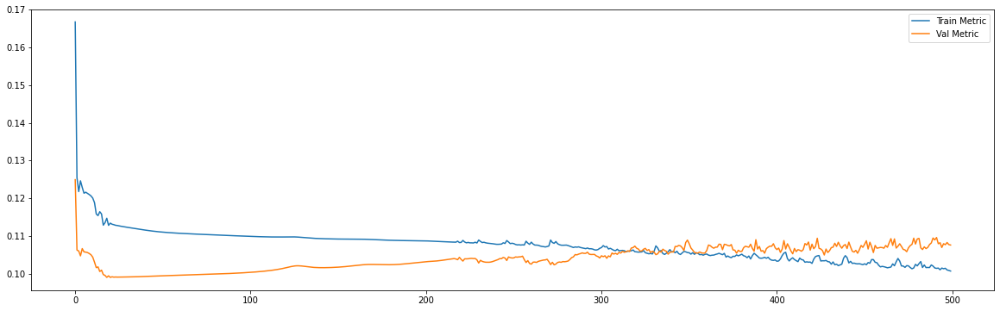



39/39 [==============================] - 0s 6ms/step - loss: 0.0165 - mae: 0.1005
loss and metric train data [0.016507036983966827, 0.10048583894968033]
8/8 [==============================] - 0s 5ms/step - loss: 0.0192 - mae: 0.1076
loss and metric val data [0.019235219806432724, 0.10763678699731827]
8/8 [==============================] - 0s 5ms/step - loss: 0.0211 - mae: 0.1158
loss and metric test data [0.02109864540398121, 0.11577991396188736]


In [0]:
regressor = Sequential()
regressor.add(LSTM(units=50, return_sequences=False, input_shape=(time_steps, n_features))) # return_sequences=False next layer is not LSTM
regressor.add(Dense(units=future_steps))

#Compiling the LSTM
# mom = optimizers.SGD(lr=0.001, decay=1e-02, momentum=0.9,nesterov=True)
adam = optimizers.Adam(lr = 0.001, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
# sgd = optimizers.SGD(lr=0.001, decay=1e-02, momentum=0.9,nesterov=True)
regressor.compile(optimizer = adam, loss = 'mse', metrics=['mae'])

#Fitting to traning set
history = regressor.fit(x_train, y_train, validation_data=(x_val,y_val), 
                        epochs = 500, batch_size=60, verbose = 0, shuffle= False)

plt.figure(figsize=(20,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Val Loss'])

plt.figure(figsize=(20,6))
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.legend(['Train Metric', 'Val Metric'])
plt.show()

print('\n')
print('loss and metric train data',regressor.evaluate(x_train,y_train))
print('loss and metric val data',regressor.evaluate(x_val,y_val))
print('loss and metric test data',regressor.evaluate(x_test,y_test))

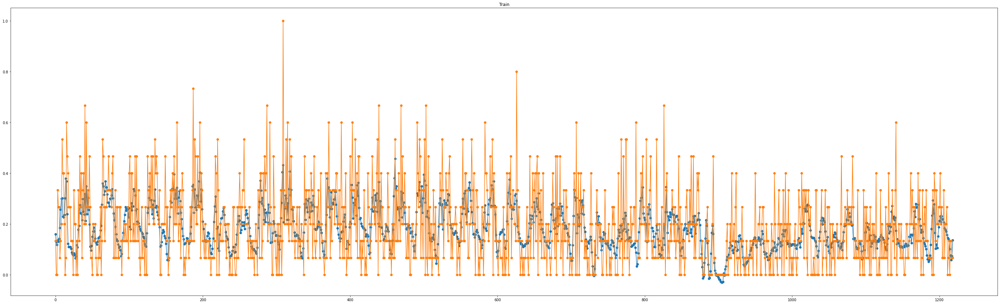

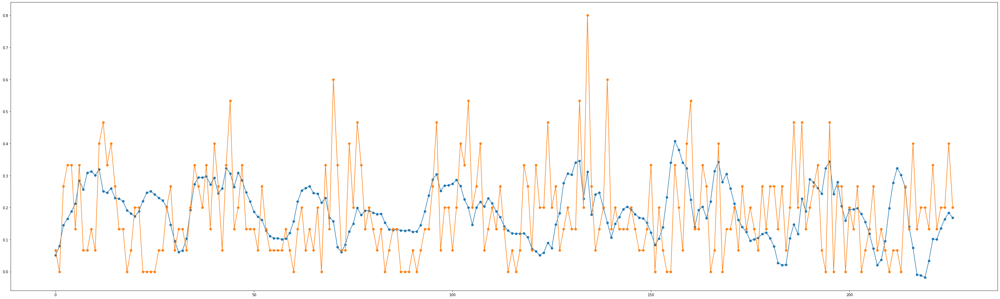

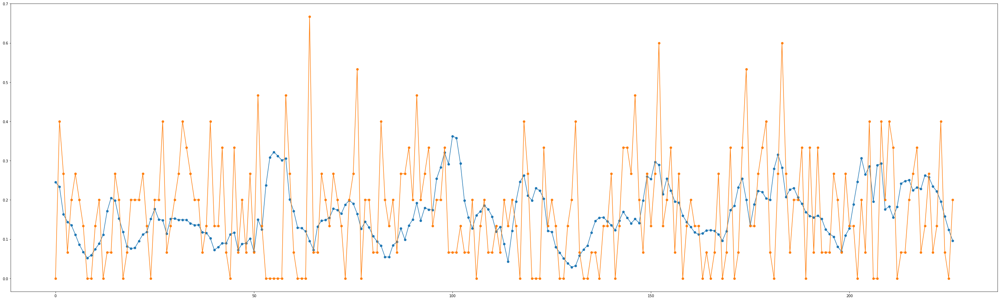

In [0]:
y_train_predict = regressor.predict(x_train)
y_val_predict = regressor.predict(x_val)
y_test_predict = regressor.predict(x_test)

plt.figure(figsize=(50,15))
plt.plot(y_train_predict[:,0],marker='o')
plt.plot(y_train[:,0],marker='o')
plt.title('Train')
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_val_predict[:,0],marker='o')
plt.plot(y_val[:,0],marker='o')

plt.figure(figsize=(50,15))
plt.plot(y_test_predict[:,0],marker='o')
plt.plot(y_test[:,0],marker='o')

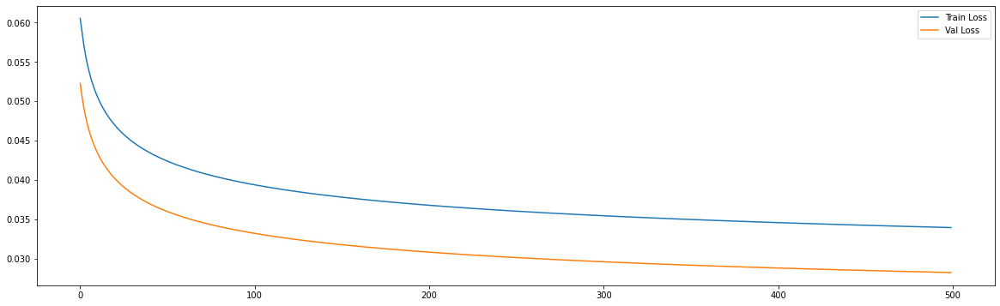

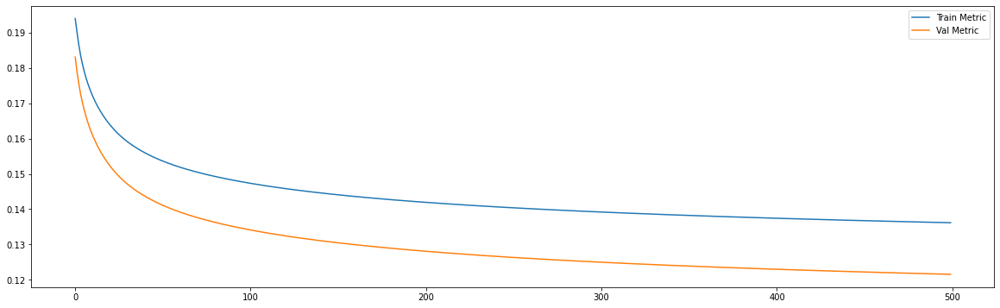



39/39 [==============================] - 0s 5ms/step - loss: 0.0339 - mae: 0.1362
loss and metric train data [0.0339290089905262, 0.13615922629833221]
8/8 [==============================] - 0s 5ms/step - loss: 0.0282 - mae: 0.1216
loss and metric val data [0.028218727558851242, 0.12155406922101974]
8/8 [==============================] - 0s 5ms/step - loss: 0.0274 - mae: 0.1255
loss and metric test data [0.027407217770814896, 0.12545815110206604]


In [0]:
regressor = Sequential()
regressor.add(LSTM(units=50, return_sequences=False, input_shape=(time_steps, n_features))) # return_sequences=False next layer is not LSTM
regressor.add(Dense(units=future_steps))

#Compiling the LSTM
# mom = optimizers.SGD(lr=0.001, decay=1e-02, momentum=0.9,nesterov=True)
# adam = optimizers.Adam(lr = 0.001, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
sgd = optimizers.SGD(lr=0.001, decay=1e-02, momentum=0.9,nesterov=True)
regressor.compile(optimizer = sgd, loss = 'mse', metrics=['mae'])

#Fitting to traning set
history = regressor.fit(x_train, y_train, validation_data=(x_val,y_val), 
                        epochs = 500, batch_size=60, verbose = 0, shuffle= False)

plt.figure(figsize=(20,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Val Loss'])

plt.figure(figsize=(20,6))
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.legend(['Train Metric', 'Val Metric'])
plt.show()

print('\n')
print('loss and metric train data',regressor.evaluate(x_train,y_train))
print('loss and metric val data',regressor.evaluate(x_val,y_val))
print('loss and metric test data',regressor.evaluate(x_test,y_test))

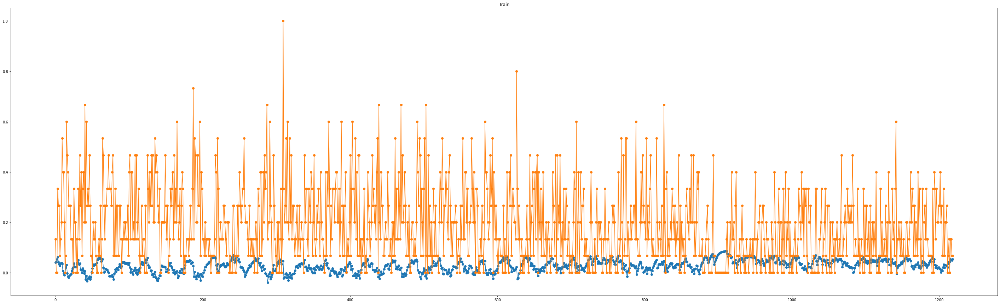

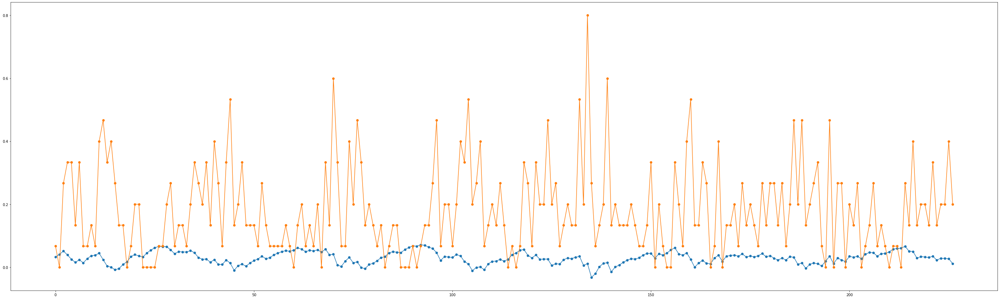

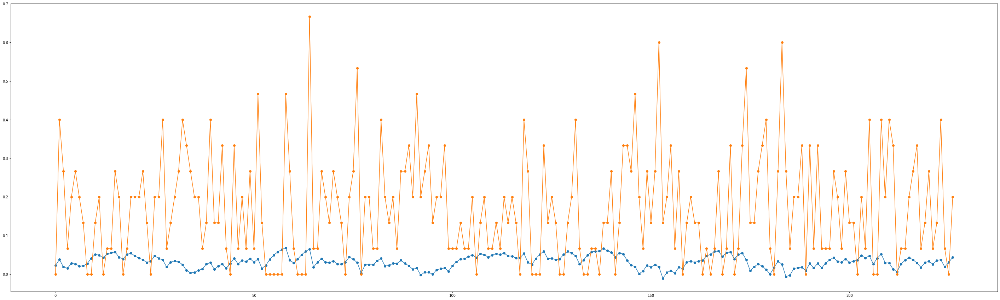

In [0]:
y_train_predict = regressor.predict(x_train)
y_val_predict = regressor.predict(x_val)
y_test_predict = regressor.predict(x_test)

plt.figure(figsize=(50,15))
plt.plot(y_train_predict[:,0],marker='o')
plt.plot(y_train[:,0],marker='o')
plt.title('Train')
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_val_predict[:,0],marker='o')
plt.plot(y_val[:,0],marker='o')

plt.figure(figsize=(50,15))
plt.plot(y_test_predict[:,0],marker='o')
plt.plot(y_test[:,0],marker='o')

============================model:0===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0164 - mae: 0.0998
loss and metric train data [0.016417112201452255, 0.09977246075868607]
8/8 [==============================] - 0s 5ms/step - loss: 0.0192 - mae: 0.1078
loss and metric val data [0.019201159477233887, 0.10776719450950623]
8/8 [==============================] - 0s 5ms/step - loss: 0.0208 - mae: 0.1155
loss and metric test data [0.020843345671892166, 0.11548218876123428]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':32, 'learning_rate':0.001, 'hidden_layers':1




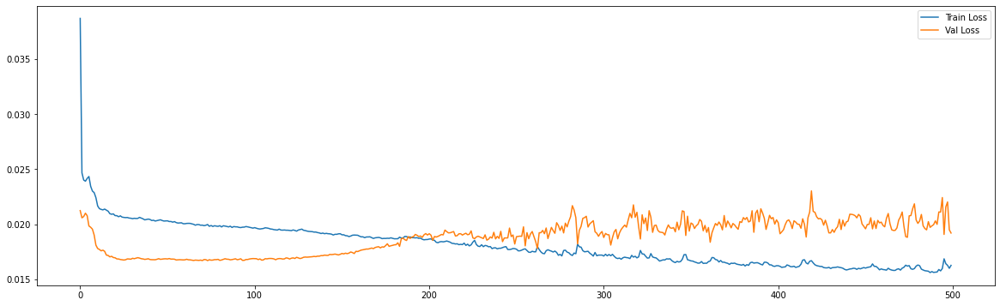

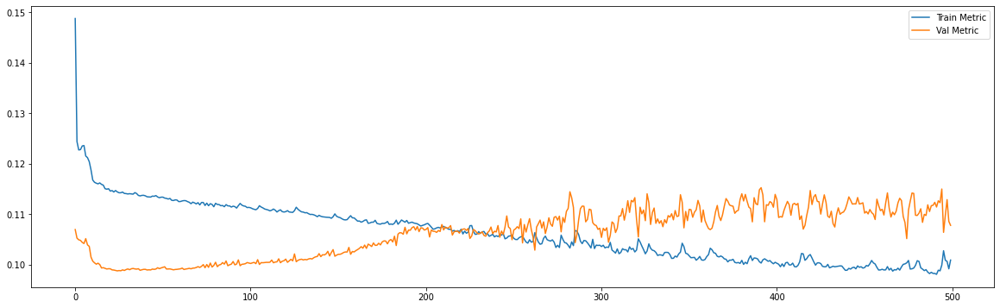

============================model:1===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0161 - mae: 0.0981
loss and metric train data [0.016146589070558548, 0.09808818250894547]
8/8 [==============================] - 0s 9ms/step - loss: 0.0200 - mae: 0.1093
loss and metric val data [0.020009521394968033, 0.10934162884950638]
8/8 [==============================] - 0s 9ms/step - loss: 0.0221 - mae: 0.1181
loss and metric test data [0.02211393415927887, 0.1181296706199646]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':32, 'hidden_layers':2




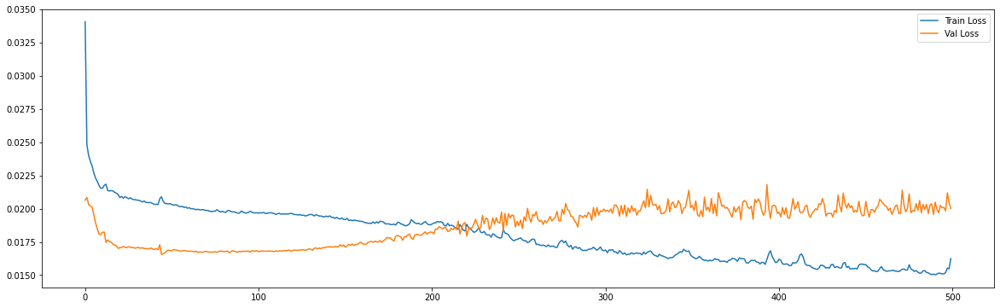

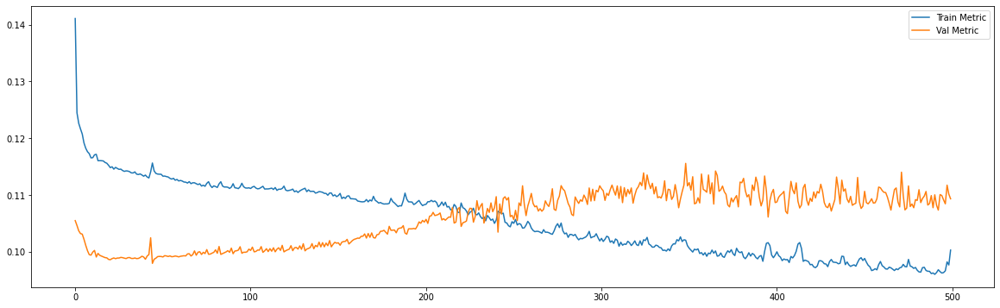

============================model:2===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0167 - mae: 0.1021
loss and metric train data [0.01666194200515747, 0.10210224986076355]
8/8 [==============================] - 0s 5ms/step - loss: 0.0194 - mae: 0.1103
loss and metric val data [0.019381625577807426, 0.11030655354261398]
8/8 [==============================] - 0s 5ms/step - loss: 0.0214 - mae: 0.1164
loss and metric test data [0.021363601088523865, 0.11637862771749496]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




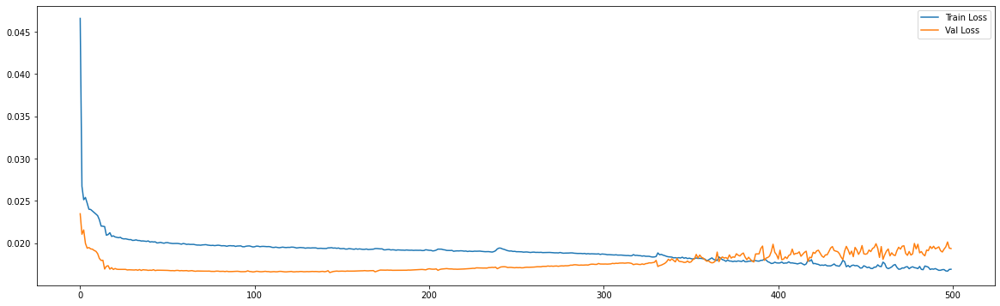

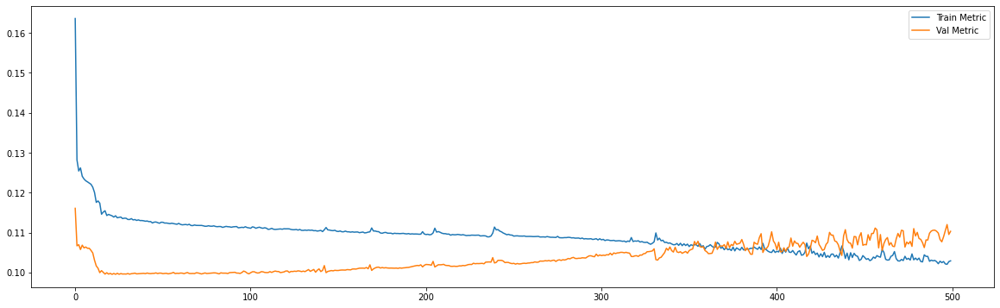

============================model:3===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0154 - mae: 0.0977
loss and metric train data [0.015388380736112595, 0.09770090878009796]
8/8 [==============================] - 0s 9ms/step - loss: 0.0204 - mae: 0.1105
loss and metric val data [0.02036312222480774, 0.11046137660741806]
8/8 [==============================] - 0s 9ms/step - loss: 0.0217 - mae: 0.1173
loss and metric test data [0.021662531420588493, 0.11732622981071472]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




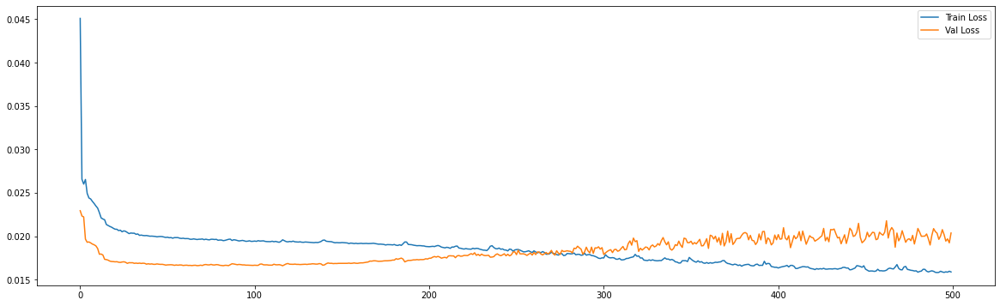

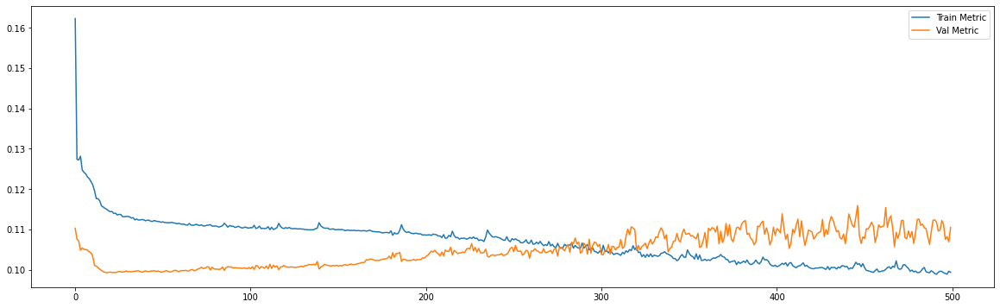

============================model:4===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0172 - mae: 0.1028
loss and metric train data [0.017165446653962135, 0.10279741883277893]
8/8 [==============================] - 0s 5ms/step - loss: 0.0182 - mae: 0.1060
loss and metric val data [0.018214352428913116, 0.10602450370788574]
8/8 [==============================] - 0s 5ms/step - loss: 0.0209 - mae: 0.1140
loss and metric test data [0.020874151960015297, 0.11397888511419296]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':84, 'learning_rate':0.001, 'hidden_layers':1




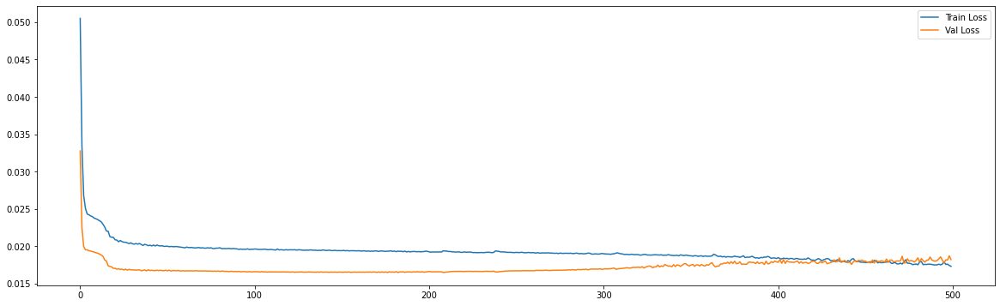

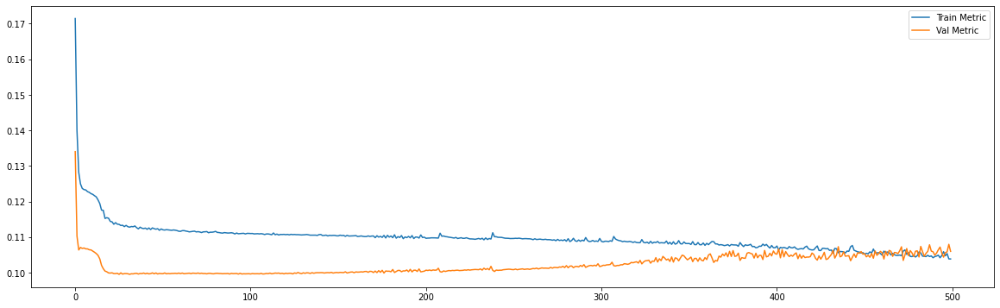

============================model:5===========================
39/39 [==============================] - 0s 11ms/step - loss: 0.0162 - mae: 0.1005
loss and metric train data [0.016244666650891304, 0.10047825425863266]
8/8 [==============================] - 0s 9ms/step - loss: 0.0194 - mae: 0.1090
loss and metric val data [0.01938316784799099, 0.10899872332811356]
8/8 [==============================] - 0s 9ms/step - loss: 0.0232 - mae: 0.1211
loss and metric test data [0.023175446316599846, 0.1211160197854042]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':84, 'hidden_layers':2




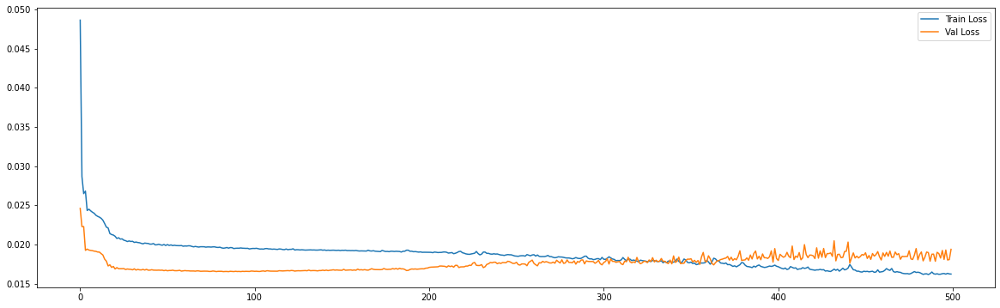

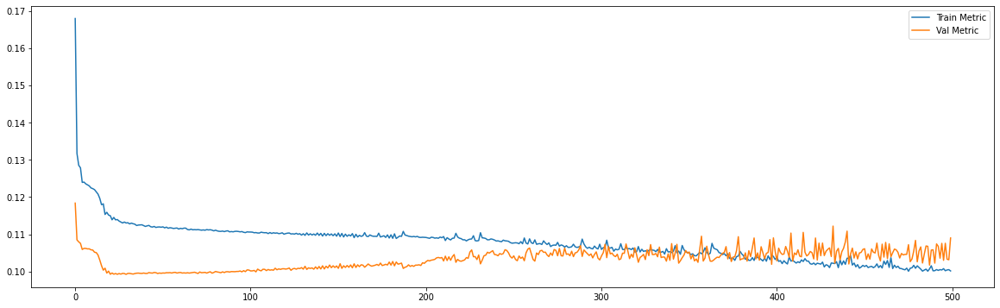

============================model:6===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0182 - mae: 0.1062
loss and metric train data [0.018206991255283356, 0.10619731992483139]
8/8 [==============================] - 0s 5ms/step - loss: 0.0178 - mae: 0.1050
loss and metric val data [0.01780417561531067, 0.10498309135437012]
8/8 [==============================] - 0s 5ms/step - loss: 0.0208 - mae: 0.1153
loss and metric test data [0.020782047882676125, 0.1152922585606575]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':100, 'learning_rate':0.001, 'hidden_layers':1




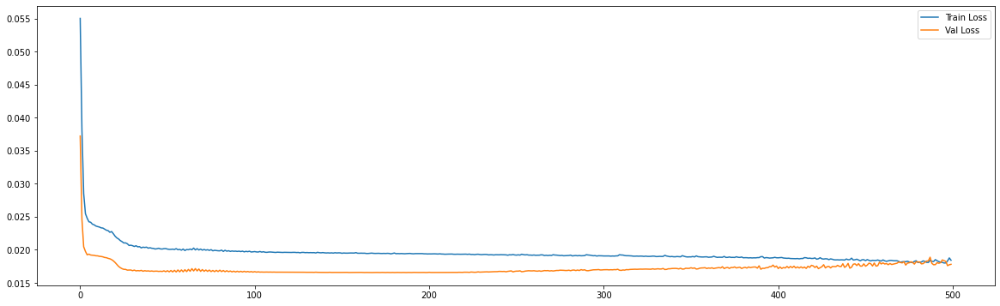

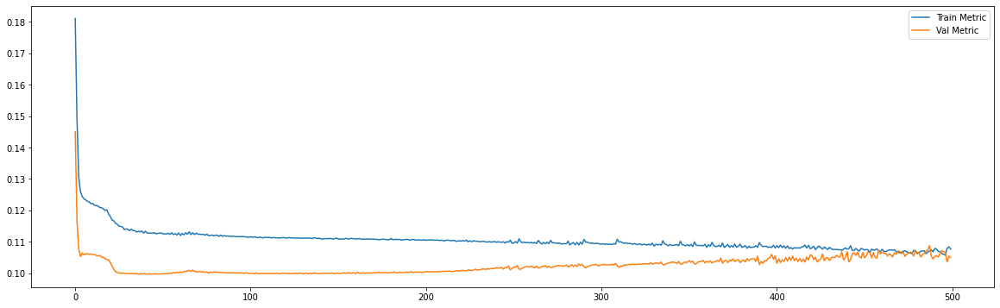

============================model:7===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0164 - mae: 0.1015
loss and metric train data [0.016408035531640053, 0.10151025652885437]
8/8 [==============================] - 0s 9ms/step - loss: 0.0188 - mae: 0.1066
loss and metric val data [0.018828189000487328, 0.10661625117063522]
8/8 [==============================] - 0s 9ms/step - loss: 0.0210 - mae: 0.1156
loss and metric test data [0.02098560333251953, 0.11555153131484985]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':100, 'hidden_layers':2




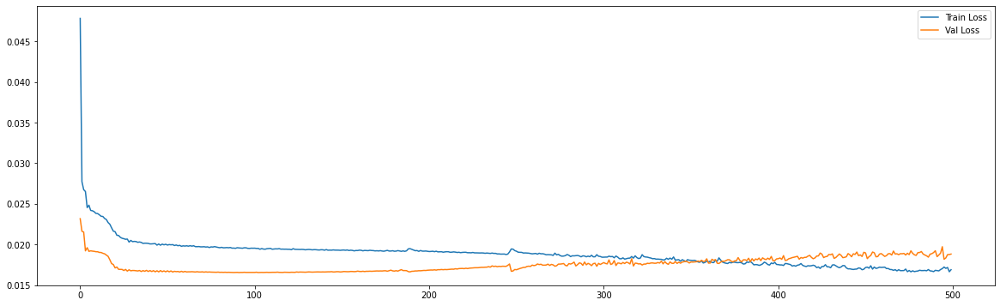

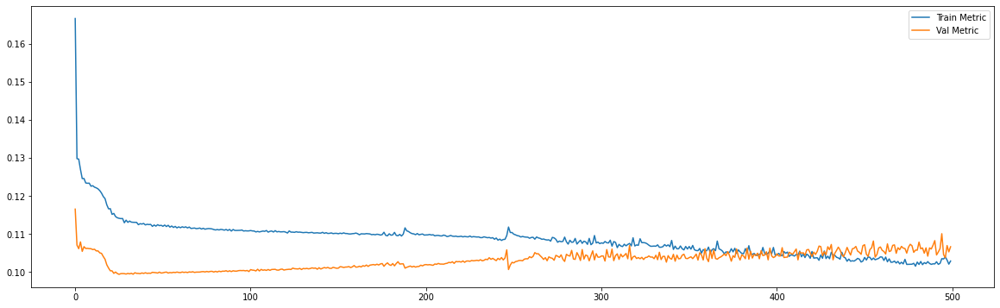

============================model:8===========================
37/37 [==============================] - 0s 8ms/step - loss: 0.0171 - mae: 0.1005
loss and metric train data [0.01707126758992672, 0.10052954405546188]
7/7 [==============================] - 0s 7ms/step - loss: 0.0212 - mae: 0.1115
loss and metric val data [0.021199475973844528, 0.11152851581573486]
7/7 [==============================] - 0s 7ms/step - loss: 0.0213 - mae: 0.1169
loss and metric test data [0.021328119561076164, 0.11687076836824417]


'neurons': 50, 'dropout': 0.2, 'time_steps': 84, 'batch_size':32, 'learning_rate':0.001, 'hidden_layers':1




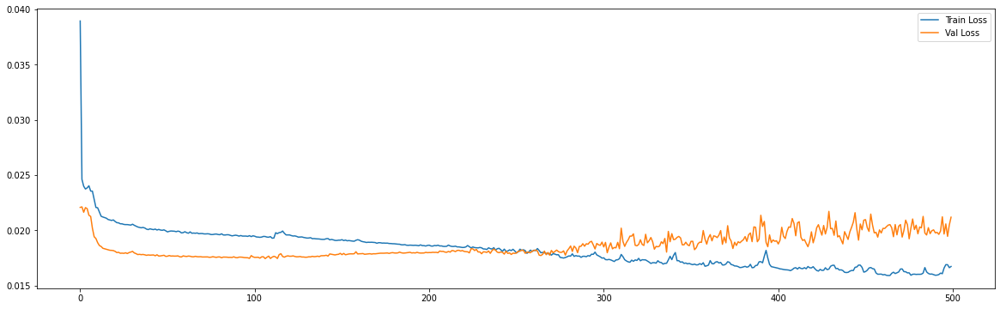

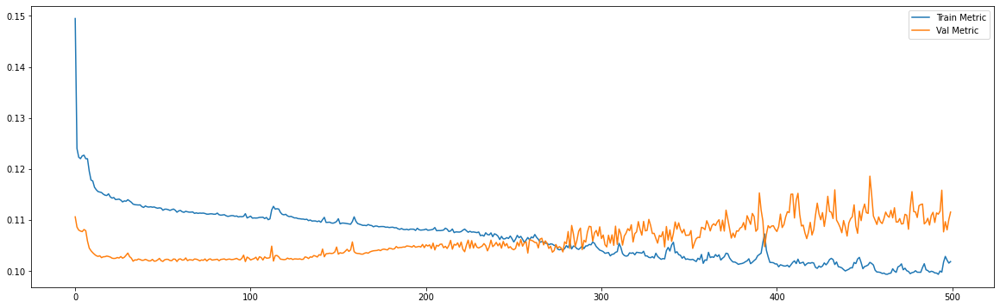

============================model:9===========================
37/37 [==============================] - 0s 13ms/step - loss: 0.0142 - mae: 0.0933
loss and metric train data [0.014180995523929596, 0.09328902512788773]
7/7 [==============================] - 0s 12ms/step - loss: 0.0223 - mae: 0.1162
loss and metric val data [0.022293053567409515, 0.11624210327863693]
7/7 [==============================] - 0s 12ms/step - loss: 0.0260 - mae: 0.1273
loss and metric test data [0.026014819741249084, 0.12729328870773315]


'neurons': 50, 'dropout': 0.2, 'time_steps': 84, 'batch_size':32, 'hidden_layers':2




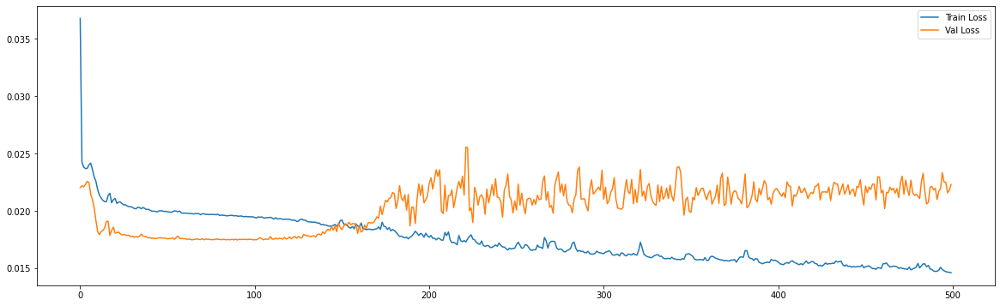

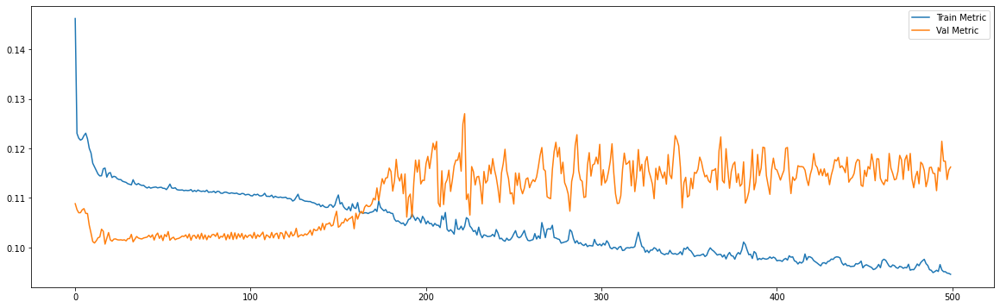

============================model:10===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0164 - mae: 0.1004
loss and metric train data [0.016401970759034157, 0.10041976720094681]
7/7 [==============================] - 0s 7ms/step - loss: 0.0202 - mae: 0.1101
loss and metric val data [0.020162438973784447, 0.11011597514152527]
7/7 [==============================] - 0s 8ms/step - loss: 0.0227 - mae: 0.1198
loss and metric test data [0.022677700966596603, 0.11978049576282501]


'neurons': 50, 'dropout': 0.2, 'time_steps': 84, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




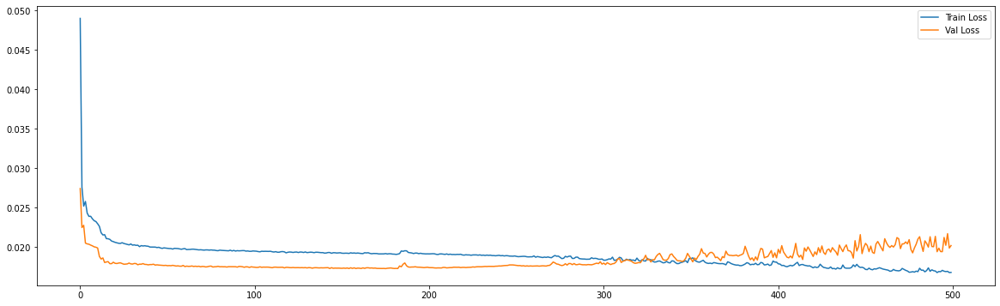

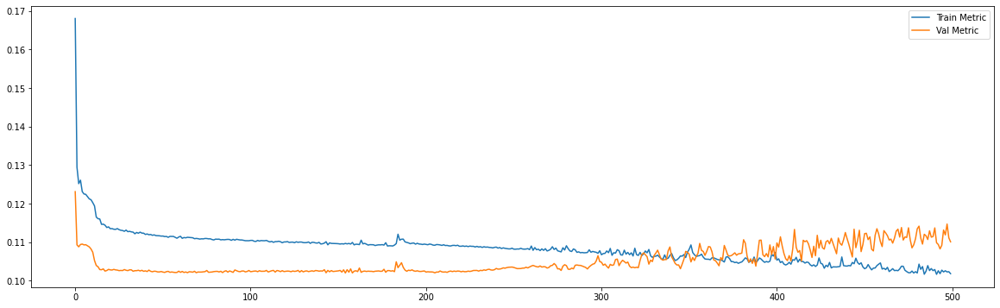

============================model:11===========================
37/37 [==============================] - 1s 14ms/step - loss: 0.0155 - mae: 0.0975
loss and metric train data [0.015490102581679821, 0.09749496728181839]
7/7 [==============================] - 0s 12ms/step - loss: 0.0202 - mae: 0.1107
loss and metric val data [0.020169176161289215, 0.1107129231095314]
7/7 [==============================] - 0s 12ms/step - loss: 0.0234 - mae: 0.1213
loss and metric test data [0.023425761610269547, 0.12129799276590347]


'neurons': 50, 'dropout': 0.2, 'time_steps': 84, 'batch_size':60, 'hidden_layers':2




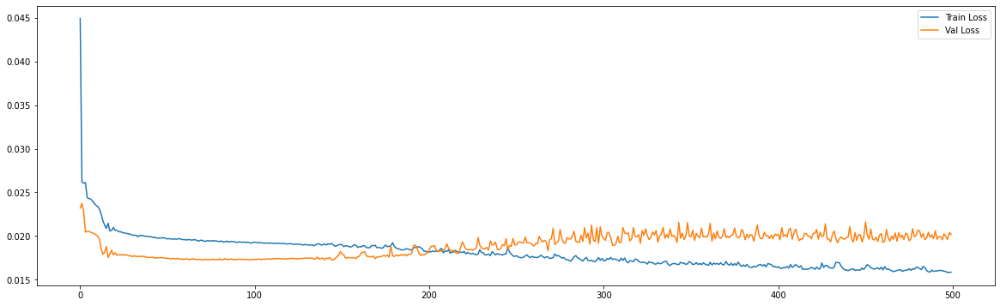

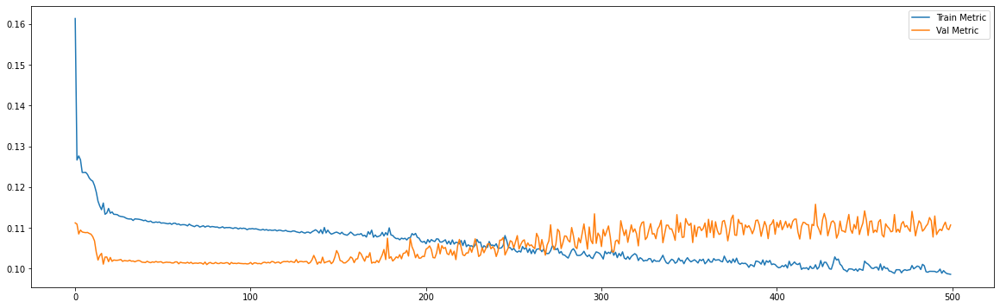

============================model:12===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0179 - mae: 0.1055
loss and metric train data [0.017913036048412323, 0.10550504922866821]
7/7 [==============================] - 0s 6ms/step - loss: 0.0182 - mae: 0.1048
loss and metric val data [0.01815309375524521, 0.10484324395656586]
7/7 [==============================] - 0s 6ms/step - loss: 0.0203 - mae: 0.1128
loss and metric test data [0.020280422642827034, 0.11284474283456802]


'neurons': 50, 'dropout': 0.2, 'time_steps': 84, 'batch_size':84, 'learning_rate':0.001, 'hidden_layers':1




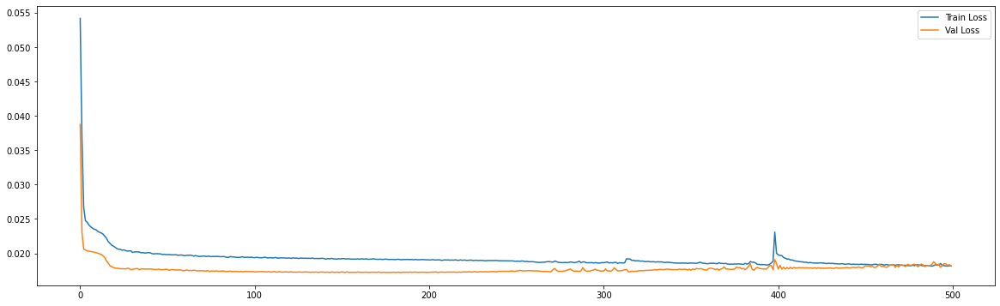

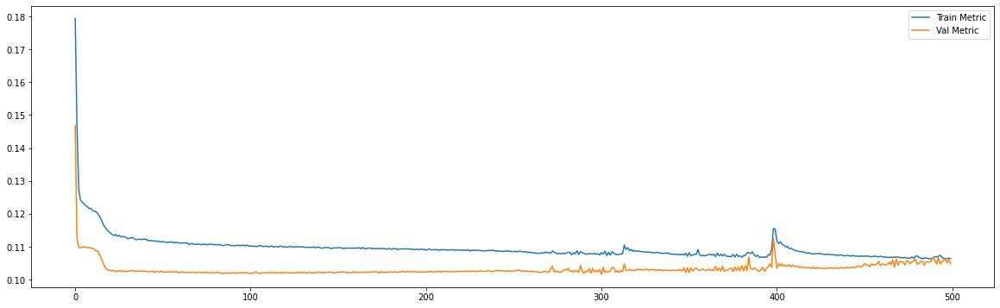

============================model:13===========================
37/37 [==============================] - 0s 13ms/step - loss: 0.0168 - mae: 0.1015
loss and metric train data [0.016783712431788445, 0.10147716850042343]
7/7 [==============================] - 0s 12ms/step - loss: 0.0196 - mae: 0.1087
loss and metric val data [0.019580550491809845, 0.10871049016714096]
7/7 [==============================] - 0s 12ms/step - loss: 0.0240 - mae: 0.1208
loss and metric test data [0.02400265447795391, 0.120838962495327]


'neurons': 50, 'dropout': 0.2, 'time_steps': 84, 'batch_size':84, 'hidden_layers':2




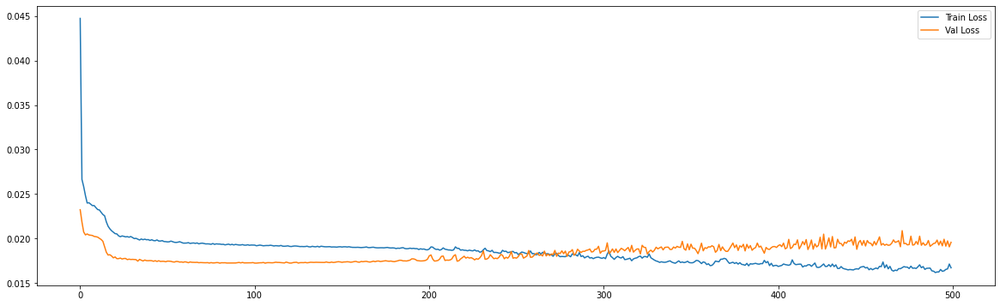

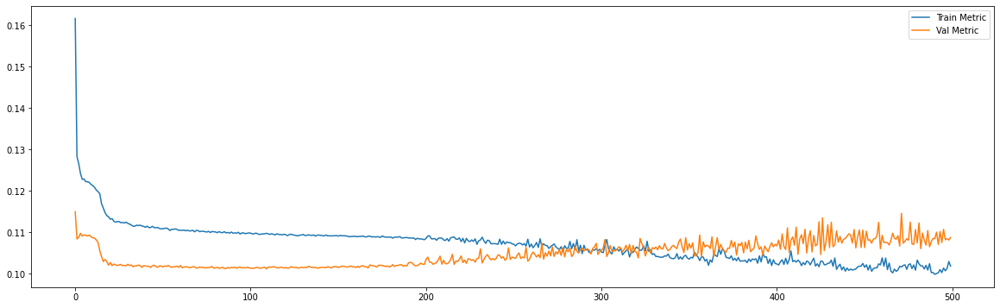

============================model:14===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0183 - mae: 0.1065
loss and metric train data [0.01827092096209526, 0.10654208809137344]
7/7 [==============================] - 0s 6ms/step - loss: 0.0176 - mae: 0.1023
loss and metric val data [0.017608528956770897, 0.10232334583997726]
7/7 [==============================] - 0s 7ms/step - loss: 0.0204 - mae: 0.1128
loss and metric test data [0.020394256338477135, 0.11284222453832626]


'neurons': 50, 'dropout': 0.2, 'time_steps': 84, 'batch_size':100, 'learning_rate':0.001, 'hidden_layers':1




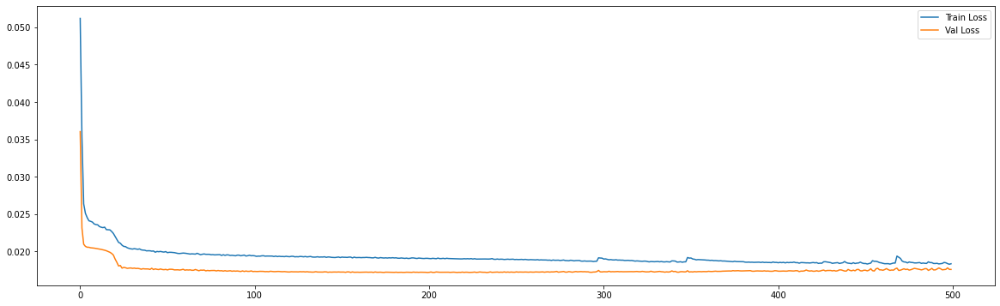

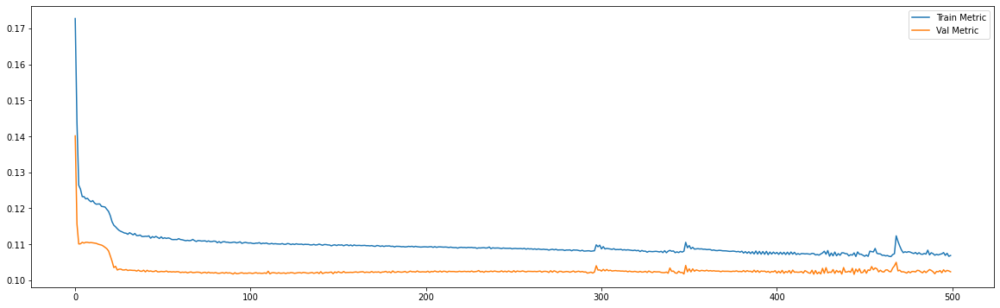

============================model:15===========================
37/37 [==============================] - 1s 14ms/step - loss: 0.0180 - mae: 0.1067
loss and metric train data [0.01802532747387886, 0.10673936456441879]
7/7 [==============================] - 0s 12ms/step - loss: 0.0204 - mae: 0.1132
loss and metric val data [0.020367998629808426, 0.11324108392000198]
7/7 [==============================] - 0s 12ms/step - loss: 0.0235 - mae: 0.1216
loss and metric test data [0.02351551502943039, 0.12164745479822159]


'neurons': 50, 'dropout': 0.2, 'time_steps': 84, 'batch_size':100, 'hidden_layers':2




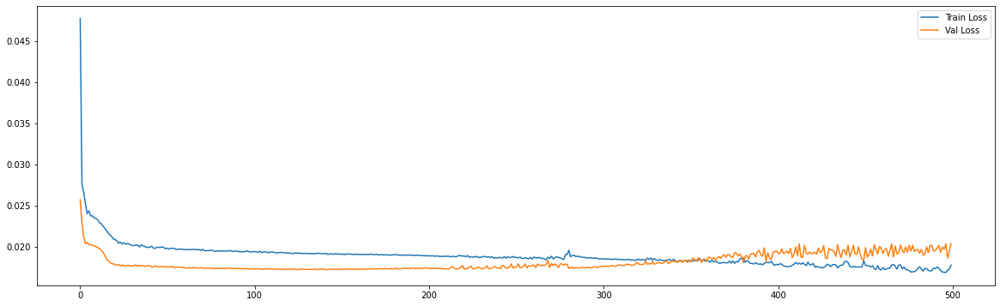

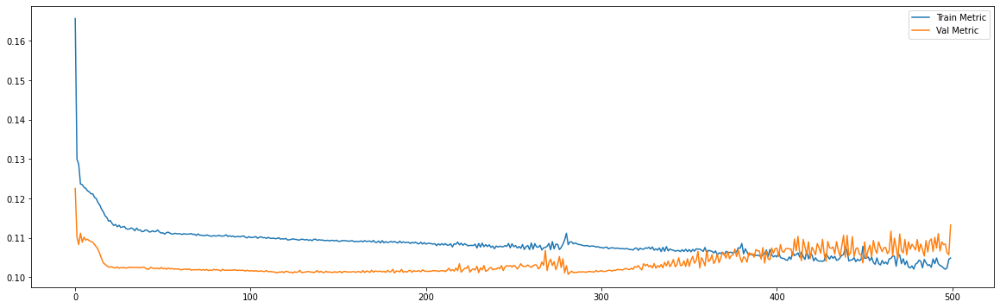

============================model:16===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0165 - mae: 0.1012
loss and metric train data [0.016475778073072433, 0.10124673694372177]
6/6 [==============================] - 0s 7ms/step - loss: 0.0206 - mae: 0.1092
loss and metric val data [0.020563842728734016, 0.10921961814165115]
6/6 [==============================] - 0s 7ms/step - loss: 0.0199 - mae: 0.1119
loss and metric test data [0.019922273233532906, 0.11185524612665176]


'neurons': 50, 'dropout': 0.2, 'time_steps': 100, 'batch_size':32, 'learning_rate':0.001, 'hidden_layers':1




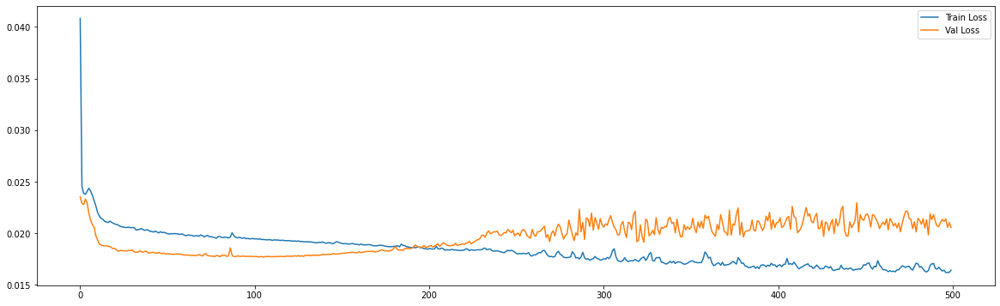

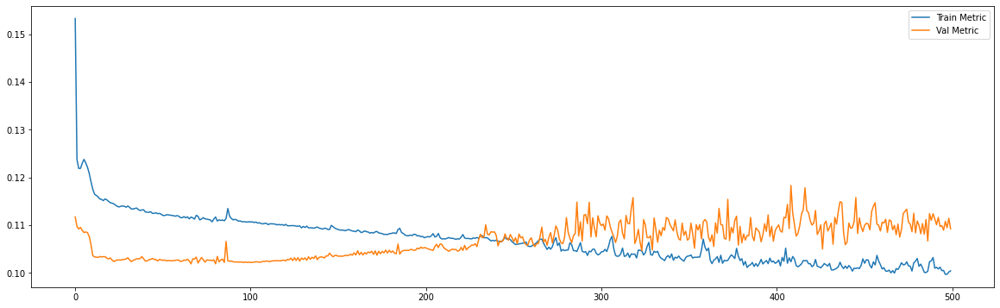

============================model:17===========================
36/36 [==============================] - 1s 16ms/step - loss: 0.0156 - mae: 0.0979
loss and metric train data [0.015593214891850948, 0.09791112691164017]
6/6 [==============================] - 0s 13ms/step - loss: 0.0209 - mae: 0.1138
loss and metric val data [0.020869065076112747, 0.11375148594379425]
6/6 [==============================] - 0s 13ms/step - loss: 0.0232 - mae: 0.1198
loss and metric test data [0.02317659556865692, 0.11981867998838425]


'neurons': 50, 'dropout': 0.2, 'time_steps': 100, 'batch_size':32, 'hidden_layers':2




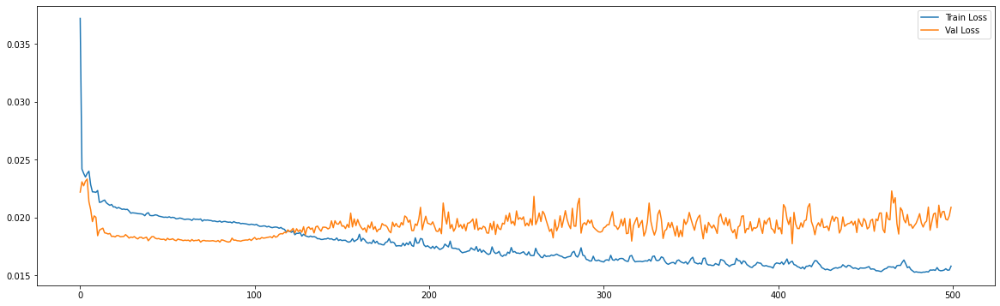

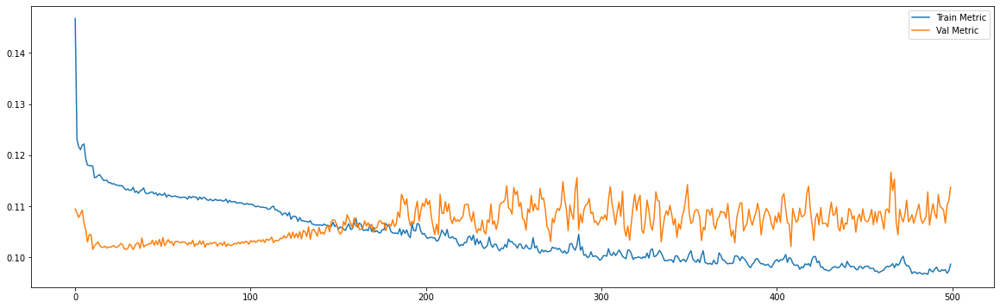

============================model:18===========================
36/36 [==============================] - 0s 9ms/step - loss: 0.0167 - mae: 0.1013
loss and metric train data [0.016653219237923622, 0.10125121474266052]
6/6 [==============================] - 0s 7ms/step - loss: 0.0189 - mae: 0.1069
loss and metric val data [0.018853625282645226, 0.1069050207734108]
6/6 [==============================] - 0s 7ms/step - loss: 0.0212 - mae: 0.1134
loss and metric test data [0.02122819609940052, 0.11337699741125107]


'neurons': 50, 'dropout': 0.2, 'time_steps': 100, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




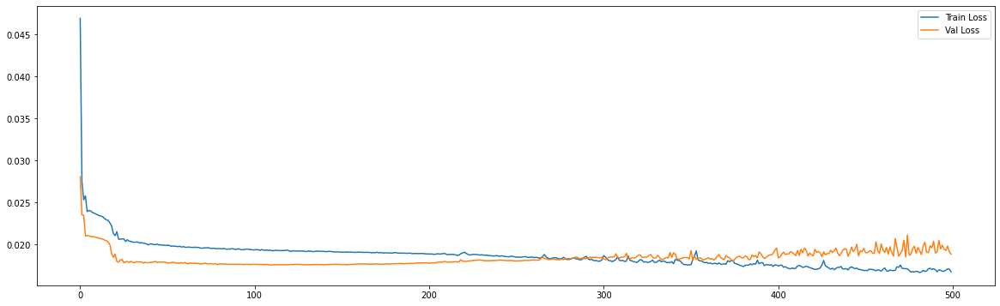

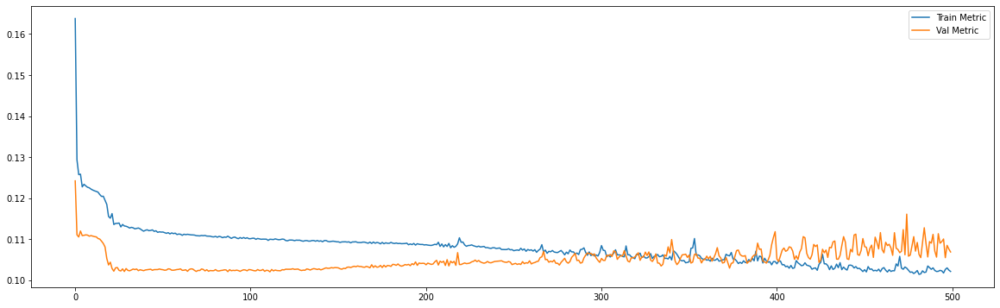

============================model:19===========================
36/36 [==============================] - 1s 16ms/step - loss: 0.0159 - mae: 0.0982
loss and metric train data [0.015894334763288498, 0.0981971025466919]
6/6 [==============================] - 0s 14ms/step - loss: 0.0192 - mae: 0.1076
loss and metric val data [0.019220635294914246, 0.10756149142980576]
6/6 [==============================] - 0s 13ms/step - loss: 0.0231 - mae: 0.1214
loss and metric test data [0.023134369403123856, 0.12135867029428482]


'neurons': 50, 'dropout': 0.2, 'time_steps': 100, 'batch_size':60, 'hidden_layers':2




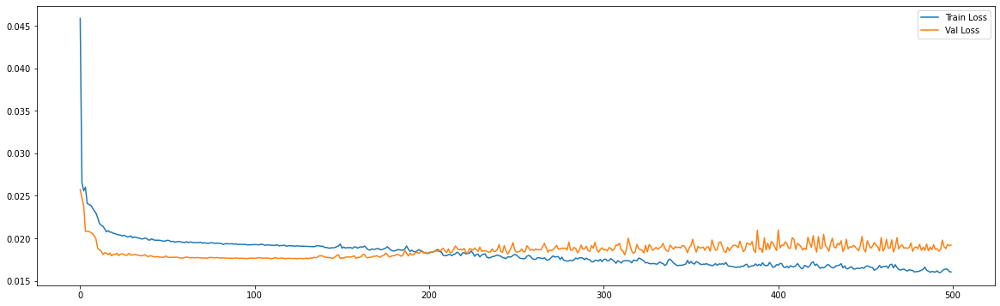

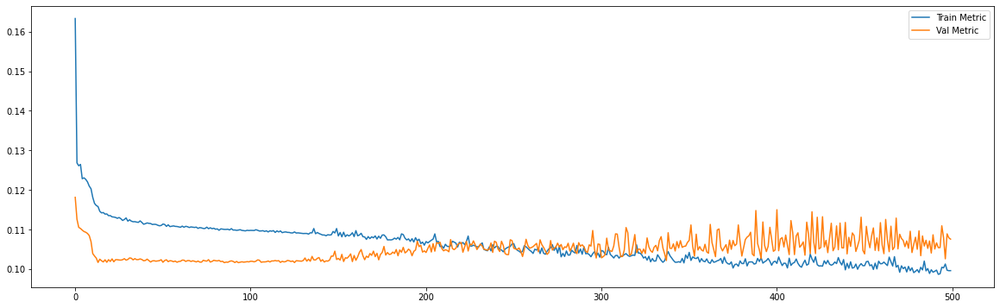

============================model:20===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0177 - mae: 0.1039
loss and metric train data [0.017702193930745125, 0.1039268746972084]
6/6 [==============================] - 0s 7ms/step - loss: 0.0190 - mae: 0.1061
loss and metric val data [0.018976137042045593, 0.1061185970902443]
6/6 [==============================] - 0s 8ms/step - loss: 0.0201 - mae: 0.1105
loss and metric test data [0.020099295303225517, 0.11050263047218323]


'neurons': 50, 'dropout': 0.2, 'time_steps': 100, 'batch_size':84, 'learning_rate':0.001, 'hidden_layers':1




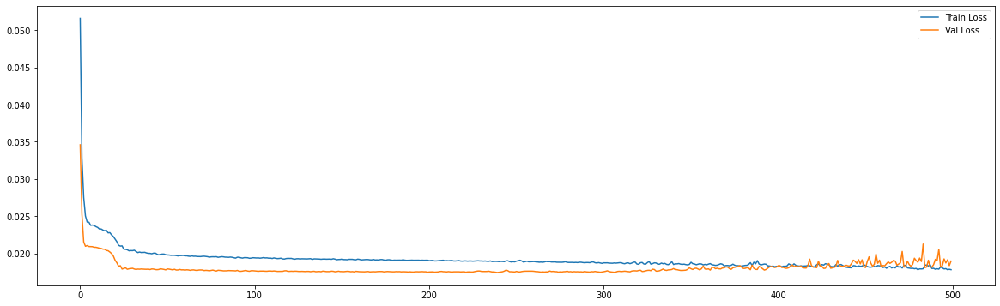

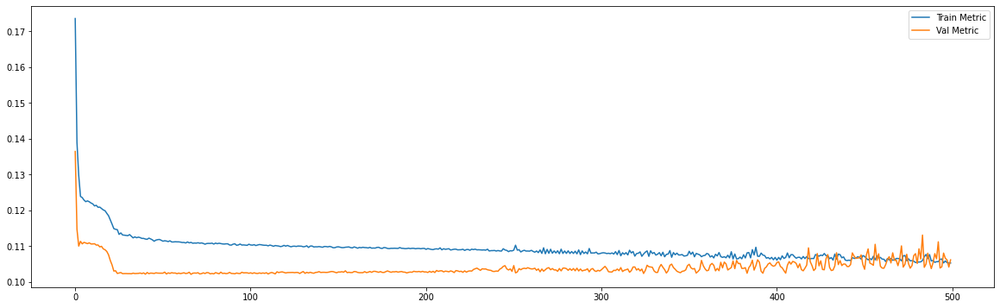

============================model:21===========================
36/36 [==============================] - 1s 16ms/step - loss: 0.0168 - mae: 0.1006
loss and metric train data [0.016806116327643394, 0.10056035965681076]
6/6 [==============================] - 0s 13ms/step - loss: 0.0208 - mae: 0.1095
loss and metric val data [0.020751208066940308, 0.10946013778448105]
6/6 [==============================] - 0s 14ms/step - loss: 0.0218 - mae: 0.1156
loss and metric test data [0.02184010110795498, 0.1155862957239151]


'neurons': 50, 'dropout': 0.2, 'time_steps': 100, 'batch_size':84, 'hidden_layers':2




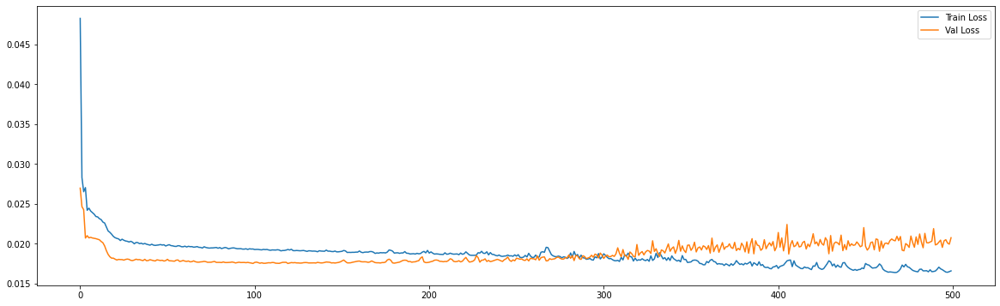

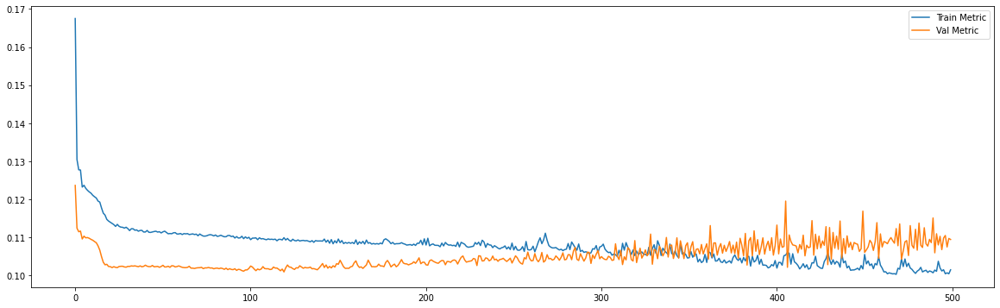

============================model:22===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0180 - mae: 0.1053
loss and metric train data [0.018035465851426125, 0.1052786186337471]
6/6 [==============================] - 0s 7ms/step - loss: 0.0193 - mae: 0.1088
loss and metric val data [0.019285451620817184, 0.10884018987417221]
6/6 [==============================] - 0s 7ms/step - loss: 0.0206 - mae: 0.1127
loss and metric test data [0.020638326182961464, 0.11268769949674606]


'neurons': 50, 'dropout': 0.2, 'time_steps': 100, 'batch_size':100, 'learning_rate':0.001, 'hidden_layers':1




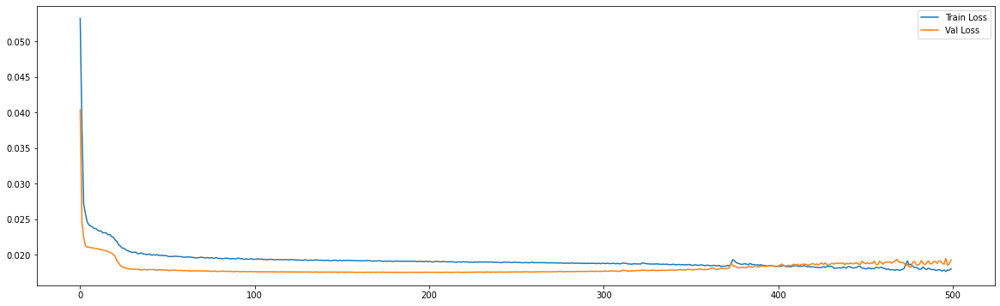

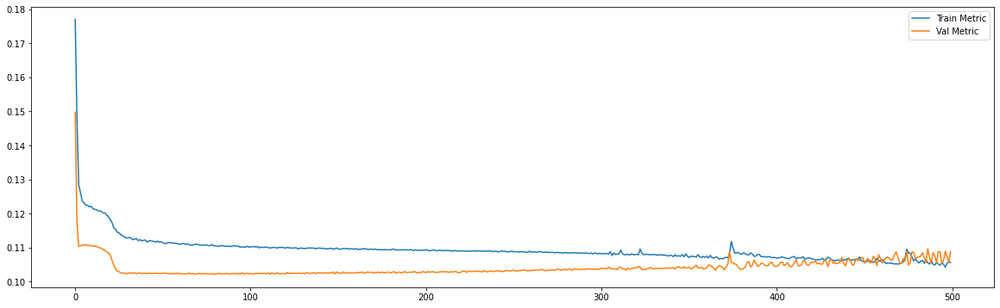

============================model:23===========================
36/36 [==============================] - 1s 16ms/step - loss: 0.0164 - mae: 0.1010
loss and metric train data [0.01640685275197029, 0.10103119909763336]
6/6 [==============================] - 0s 13ms/step - loss: 0.0188 - mae: 0.1067
loss and metric val data [0.018818680197000504, 0.10672459006309509]
6/6 [==============================] - 0s 13ms/step - loss: 0.0226 - mae: 0.1184
loss and metric test data [0.022597424685955048, 0.11843419075012207]


'neurons': 50, 'dropout': 0.2, 'time_steps': 100, 'batch_size':100, 'hidden_layers':2




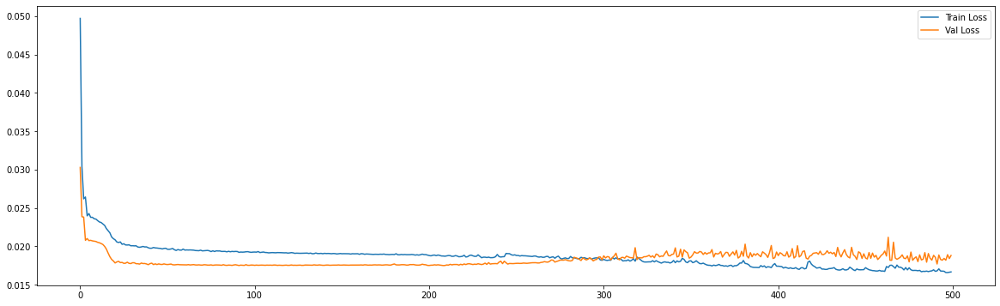

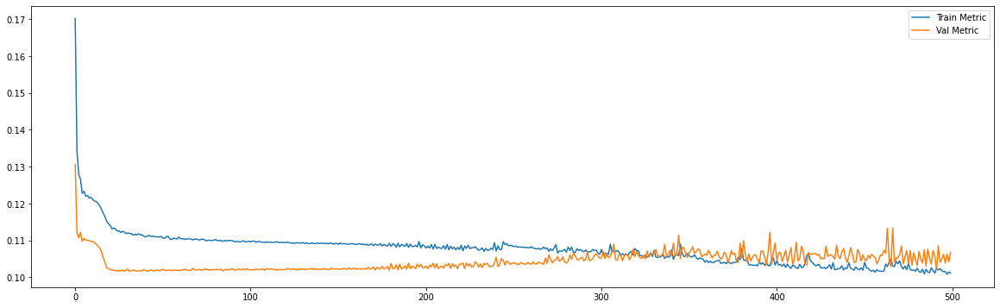

============================model:24===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0161 - mae: 0.1005
loss and metric train data [0.016097886487841606, 0.1004529744386673]
8/8 [==============================] - 0s 5ms/step - loss: 0.0194 - mae: 0.1103
loss and metric val data [0.01943103037774563, 0.11030541360378265]
8/8 [==============================] - 0s 6ms/step - loss: 0.0202 - mae: 0.1142
loss and metric test data [0.02022751048207283, 0.1142149567604065]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':32, 'learning_rate':0.001, 'hidden_layers':1




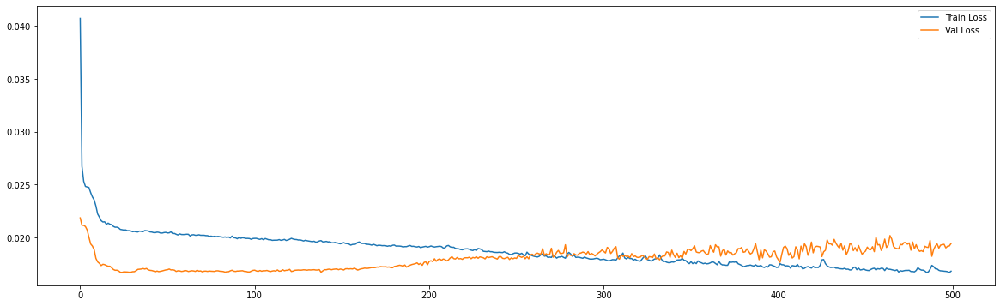

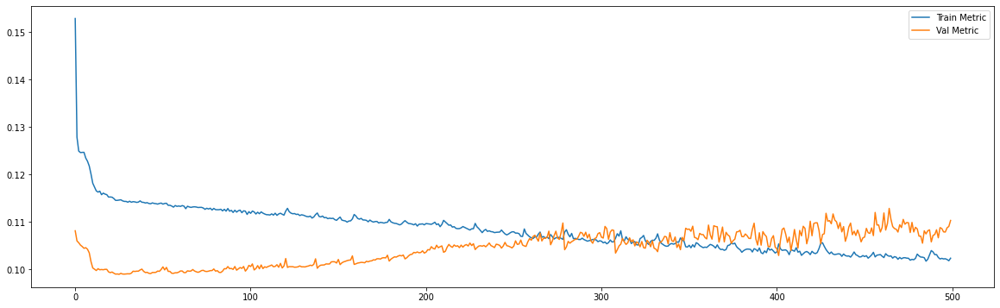

============================model:25===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0154 - mae: 0.0973
loss and metric train data [0.015384062193334103, 0.09726365655660629]
8/8 [==============================] - 0s 9ms/step - loss: 0.0200 - mae: 0.1111
loss and metric val data [0.02000715211033821, 0.11113389581441879]
8/8 [==============================] - 0s 9ms/step - loss: 0.0224 - mae: 0.1192
loss and metric test data [0.022392354905605316, 0.1191704198718071]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':32, 'hidden_layers':2




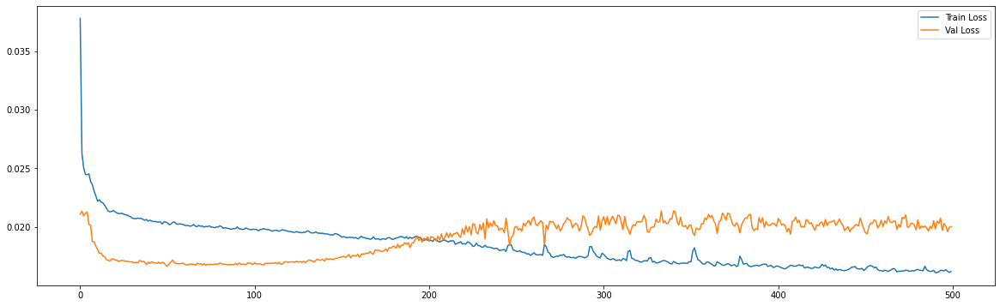

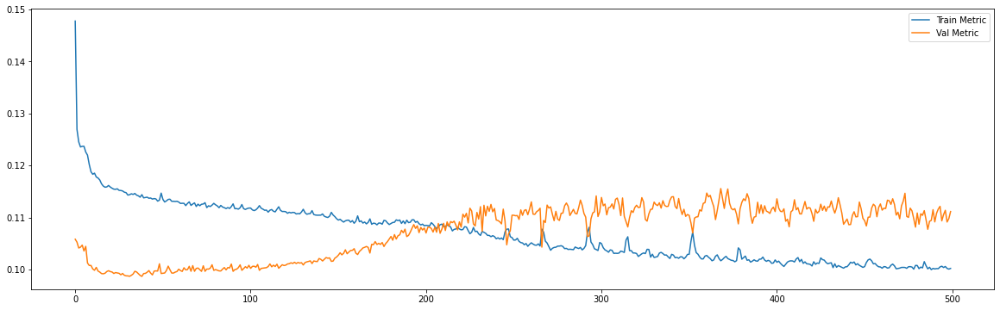

============================model:26===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0182 - mae: 0.1056
loss and metric train data [0.01820942386984825, 0.10563603043556213]
8/8 [==============================] - 0s 6ms/step - loss: 0.0177 - mae: 0.1034
loss and metric val data [0.017655864357948303, 0.10338028520345688]
8/8 [==============================] - 0s 5ms/step - loss: 0.0201 - mae: 0.1128
loss and metric test data [0.02007281593978405, 0.11275865137577057]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




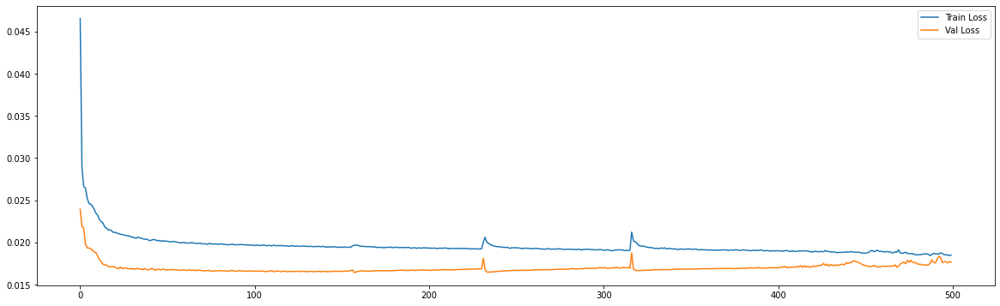

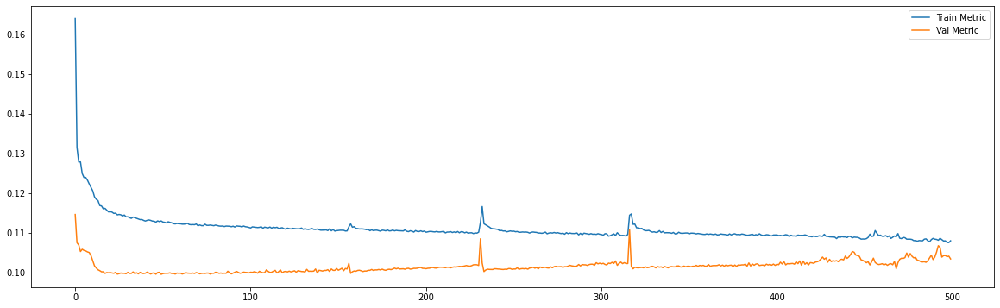

============================model:27===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0164 - mae: 0.1016
loss and metric train data [0.0164437647908926, 0.10159366577863693]
8/8 [==============================] - 0s 9ms/step - loss: 0.0182 - mae: 0.1047
loss and metric val data [0.018176795914769173, 0.10468458384275436]
8/8 [==============================] - 0s 9ms/step - loss: 0.0211 - mae: 0.1149
loss and metric test data [0.02109655551612377, 0.11486755311489105]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




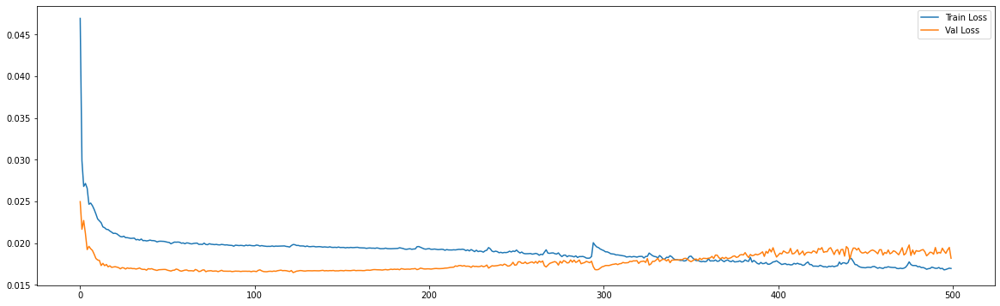

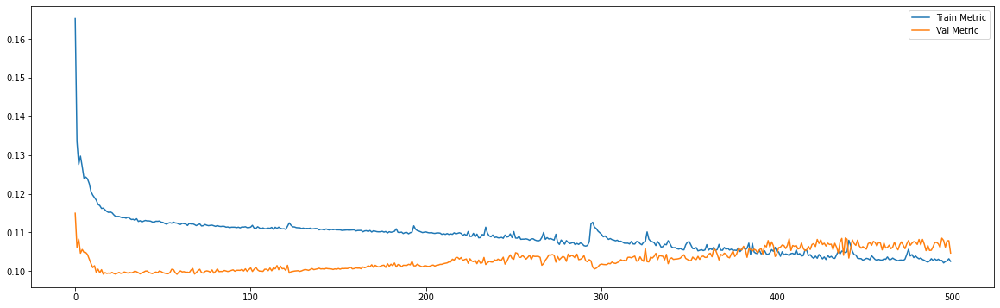

============================model:28===========================
39/39 [==============================] - 0s 9ms/step - loss: 0.0179 - mae: 0.1053
loss and metric train data [0.017897116020321846, 0.10530053079128265]
8/8 [==============================] - 0s 9ms/step - loss: 0.0179 - mae: 0.1057
loss and metric val data [0.017884375527501106, 0.10571490228176117]
8/8 [==============================] - 0s 9ms/step - loss: 0.0208 - mae: 0.1151
loss and metric test data [0.02083354815840721, 0.11505996435880661]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':84, 'learning_rate':0.001, 'hidden_layers':1




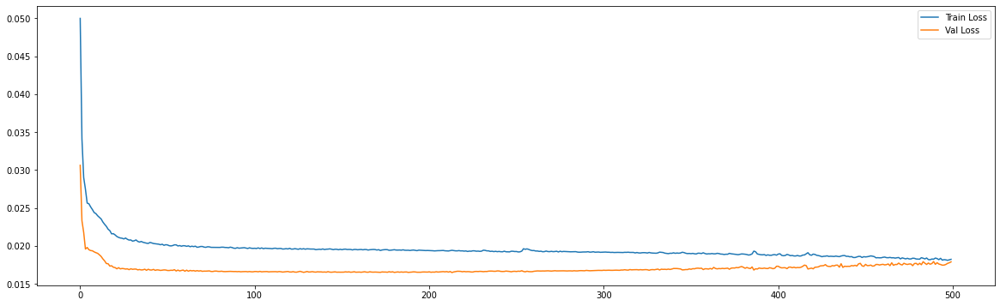

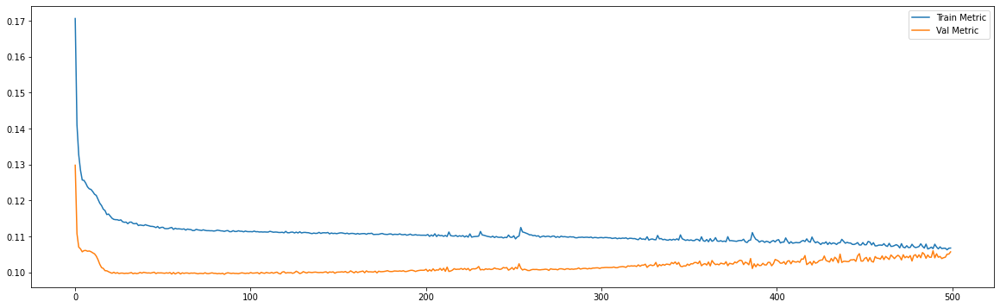

============================model:29===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0167 - mae: 0.1016
loss and metric train data [0.016674116253852844, 0.1015968918800354]
8/8 [==============================] - 0s 9ms/step - loss: 0.0189 - mae: 0.1077
loss and metric val data [0.018887752667069435, 0.10769959539175034]
8/8 [==============================] - 0s 9ms/step - loss: 0.0213 - mae: 0.1157
loss and metric test data [0.021286066621541977, 0.11573778092861176]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':84, 'hidden_layers':2




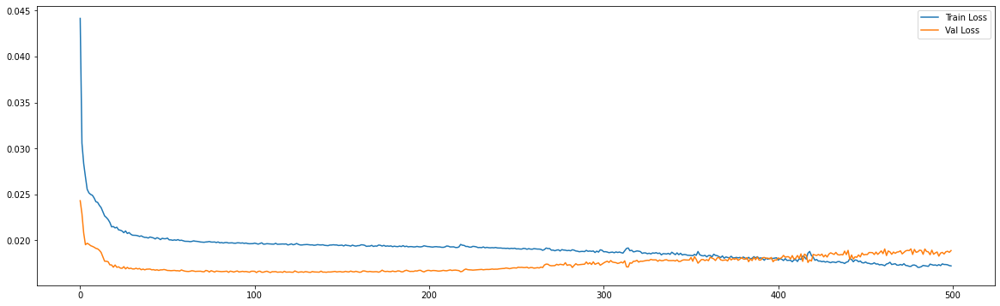

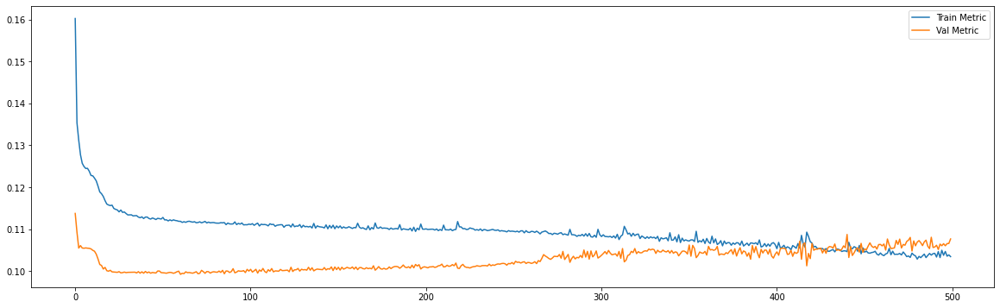

============================model:30===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0185 - mae: 0.1073
loss and metric train data [0.01852177456021309, 0.107325978577137]
8/8 [==============================] - 0s 6ms/step - loss: 0.0174 - mae: 0.1037
loss and metric val data [0.017392175272107124, 0.10373007506132126]
8/8 [==============================] - 0s 5ms/step - loss: 0.0202 - mae: 0.1128
loss and metric test data [0.02019096165895462, 0.11283649504184723]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':100, 'learning_rate':0.001, 'hidden_layers':1




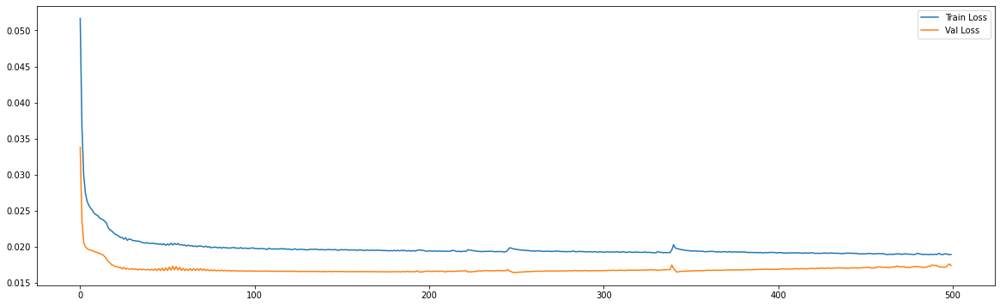

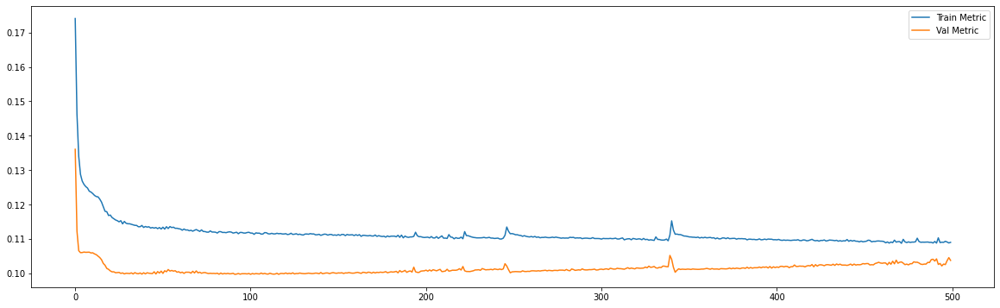

============================model:31===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0174 - mae: 0.1036
loss and metric train data [0.017396317794919014, 0.10358068346977234]
8/8 [==============================] - 0s 9ms/step - loss: 0.0182 - mae: 0.1051
loss and metric val data [0.018181947991251945, 0.10510528087615967]
8/8 [==============================] - 0s 10ms/step - loss: 0.0207 - mae: 0.1142
loss and metric test data [0.020662307739257812, 0.11424743384122849]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':100, 'hidden_layers':2




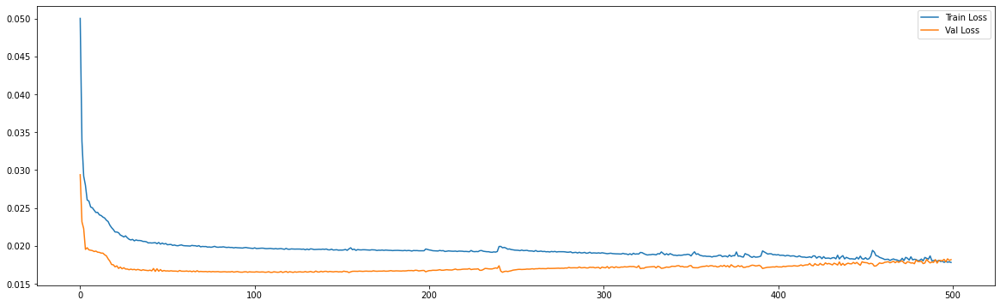

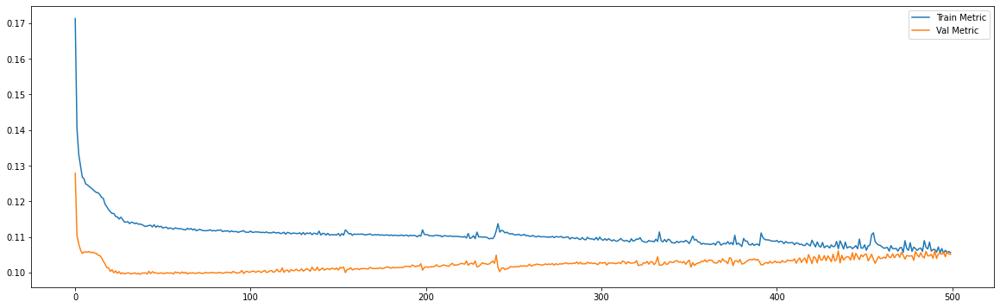

============================model:32===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0159 - mae: 0.0991
loss and metric train data [0.015925511717796326, 0.09914061427116394]
7/7 [==============================] - 0s 6ms/step - loss: 0.0211 - mae: 0.1167
loss and metric val data [0.021100277081131935, 0.1166832372546196]
7/7 [==============================] - 0s 6ms/step - loss: 0.0227 - mae: 0.1203
loss and metric test data [0.02271638996899128, 0.12025897204875946]


'neurons': 50, 'dropout': 0.4, 'time_steps': 84, 'batch_size':32, 'learning_rate':0.001, 'hidden_layers':1




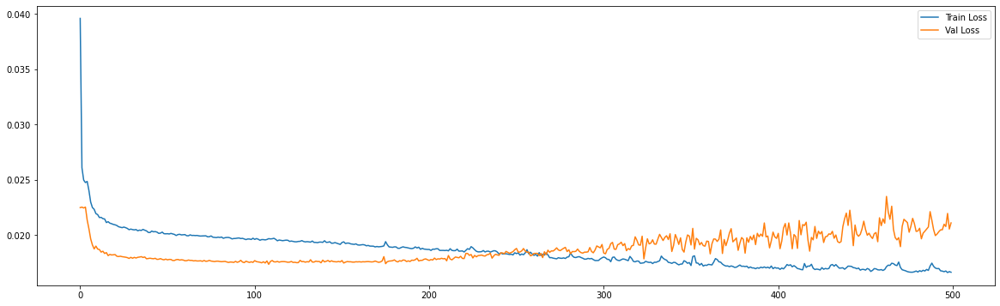

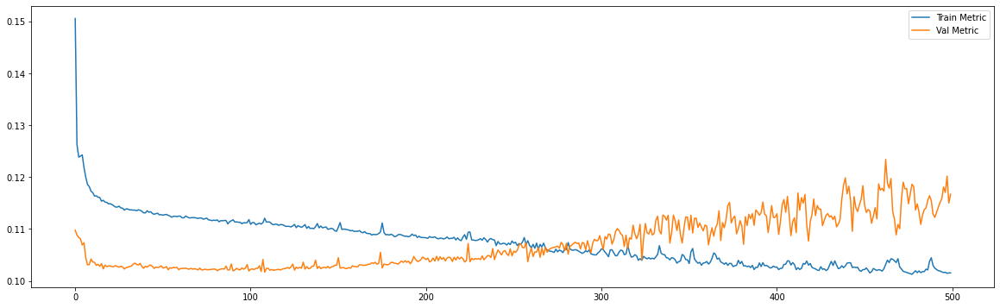

============================model:33===========================
37/37 [==============================] - 0s 13ms/step - loss: 0.0156 - mae: 0.0989
loss and metric train data [0.015619238838553429, 0.09889519959688187]
7/7 [==============================] - 0s 11ms/step - loss: 0.0207 - mae: 0.1130
loss and metric val data [0.020716922357678413, 0.11302745342254639]
7/7 [==============================] - 0s 11ms/step - loss: 0.0225 - mae: 0.1198
loss and metric test data [0.022533651441335678, 0.11977571249008179]


'neurons': 50, 'dropout': 0.4, 'time_steps': 84, 'batch_size':32, 'hidden_layers':2




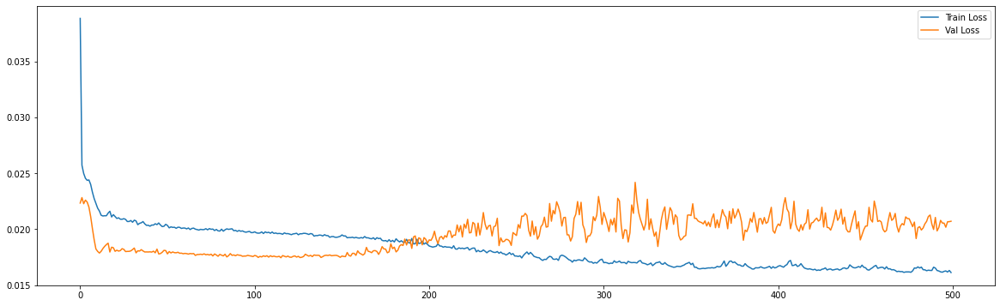

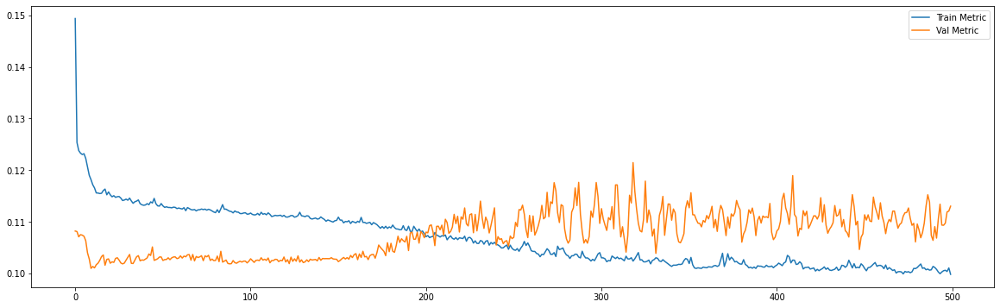

============================model:34===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0171 - mae: 0.1028
loss and metric train data [0.017050594091415405, 0.10277979075908661]
7/7 [==============================] - 0s 7ms/step - loss: 0.0182 - mae: 0.1049
loss and metric val data [0.01822800189256668, 0.10491641610860825]
7/7 [==============================] - 0s 6ms/step - loss: 0.0221 - mae: 0.1176
loss and metric test data [0.022094041109085083, 0.11755762994289398]


'neurons': 50, 'dropout': 0.4, 'time_steps': 84, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




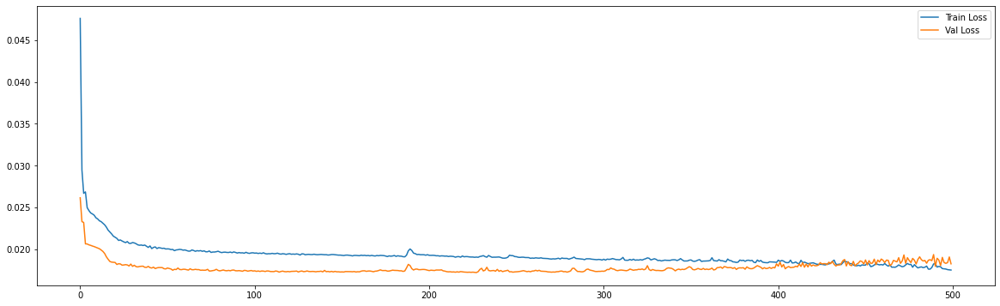

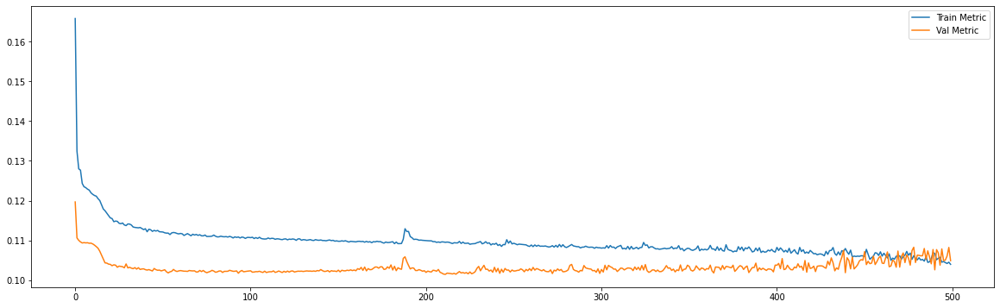

============================model:35===========================
37/37 [==============================] - 1s 14ms/step - loss: 0.0162 - mae: 0.1001
loss and metric train data [0.01616998016834259, 0.10008834302425385]
7/7 [==============================] - 0s 12ms/step - loss: 0.0203 - mae: 0.1115
loss and metric val data [0.02034725248813629, 0.11146880686283112]
7/7 [==============================] - 0s 12ms/step - loss: 0.0226 - mae: 0.1182
loss and metric test data [0.022610826417803764, 0.11823050677776337]


'neurons': 50, 'dropout': 0.4, 'time_steps': 84, 'batch_size':60, 'hidden_layers':2




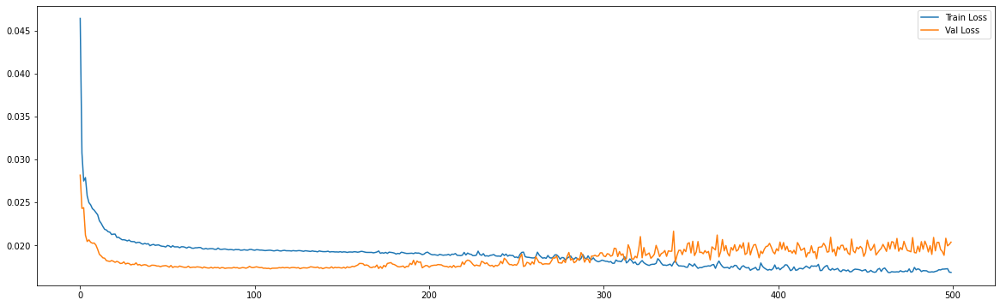

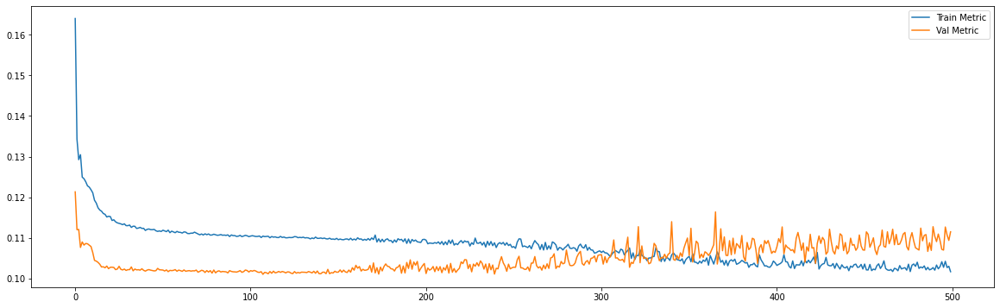

============================model:36===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0180 - mae: 0.1063
loss and metric train data [0.01804422214627266, 0.1062871441245079]
7/7 [==============================] - 0s 6ms/step - loss: 0.0184 - mae: 0.1063
loss and metric val data [0.018448809161782265, 0.10629607737064362]
7/7 [==============================] - 0s 7ms/step - loss: 0.0204 - mae: 0.1137
loss and metric test data [0.020412802696228027, 0.11372662335634232]


'neurons': 50, 'dropout': 0.4, 'time_steps': 84, 'batch_size':84, 'learning_rate':0.001, 'hidden_layers':1




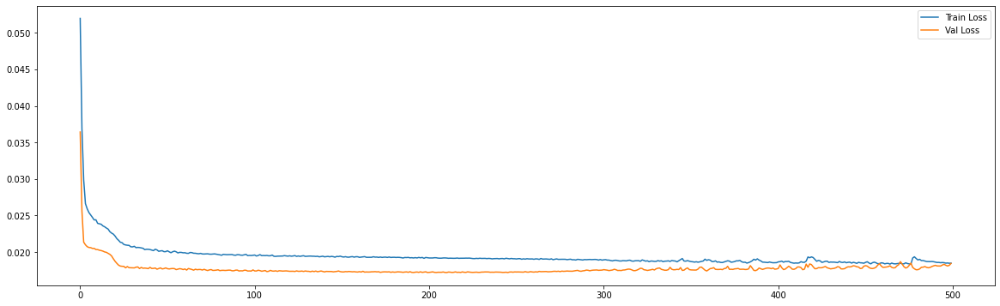

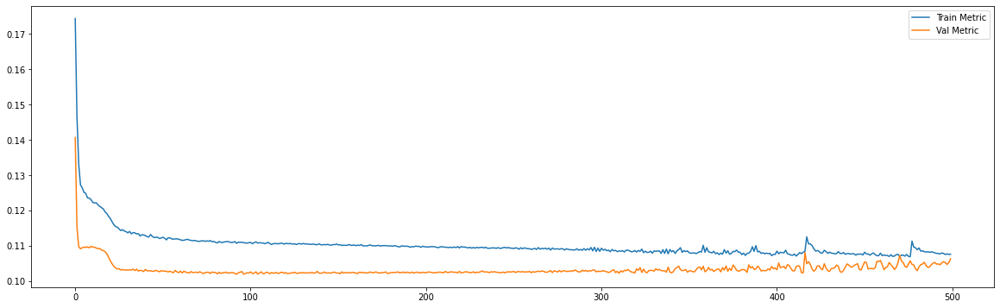

============================model:37===========================
37/37 [==============================] - 1s 14ms/step - loss: 0.0170 - mae: 0.1018
loss and metric train data [0.016985857859253883, 0.10176711529493332]
7/7 [==============================] - 0s 12ms/step - loss: 0.0192 - mae: 0.1057
loss and metric val data [0.01915917918086052, 0.10572917014360428]
7/7 [==============================] - 0s 11ms/step - loss: 0.0215 - mae: 0.1160
loss and metric test data [0.021529637277126312, 0.1159517839550972]


'neurons': 50, 'dropout': 0.4, 'time_steps': 84, 'batch_size':84, 'hidden_layers':2




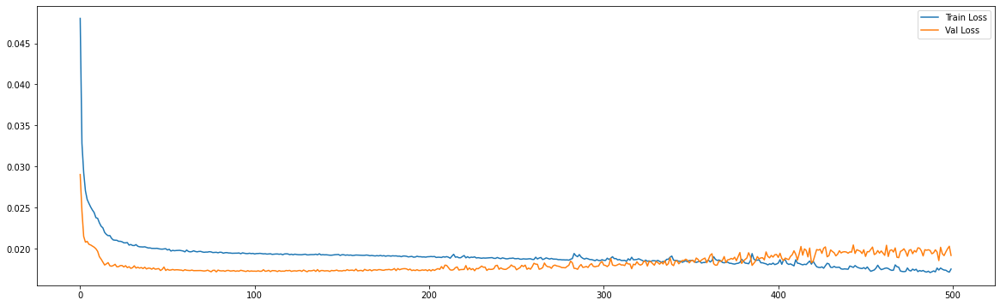

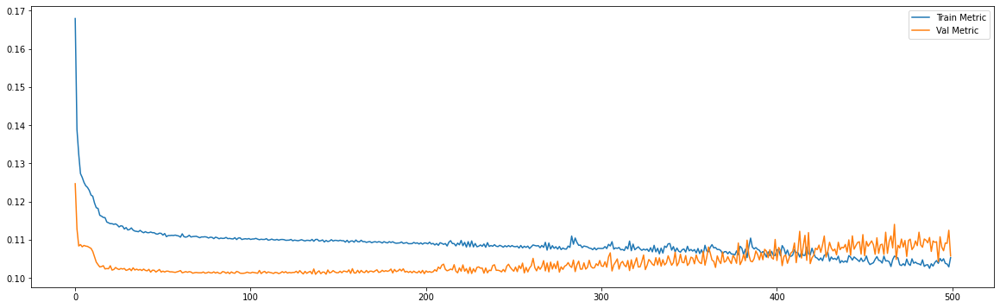

============================model:38===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0182 - mae: 0.1058
loss and metric train data [0.01819903962314129, 0.10580352693796158]
7/7 [==============================] - 0s 6ms/step - loss: 0.0175 - mae: 0.1021
loss and metric val data [0.01748359017074108, 0.10205654799938202]
7/7 [==============================] - 0s 7ms/step - loss: 0.0205 - mae: 0.1136
loss and metric test data [0.020517518743872643, 0.11358732730150223]


'neurons': 50, 'dropout': 0.4, 'time_steps': 84, 'batch_size':100, 'learning_rate':0.001, 'hidden_layers':1




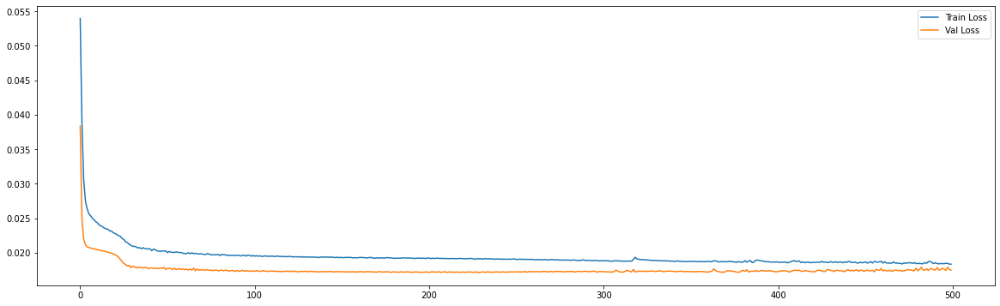

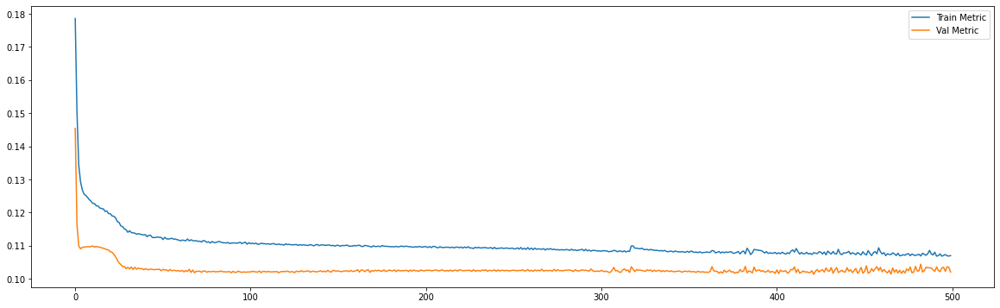

============================model:39===========================
37/37 [==============================] - 1s 14ms/step - loss: 0.0168 - mae: 0.1023
loss and metric train data [0.01680925115942955, 0.1023021712899208]
7/7 [==============================] - 0s 12ms/step - loss: 0.0193 - mae: 0.1095
loss and metric val data [0.019347626715898514, 0.10947152972221375]
7/7 [==============================] - 0s 12ms/step - loss: 0.0223 - mae: 0.1178
loss and metric test data [0.022253962233662605, 0.11778078228235245]


'neurons': 50, 'dropout': 0.4, 'time_steps': 84, 'batch_size':100, 'hidden_layers':2




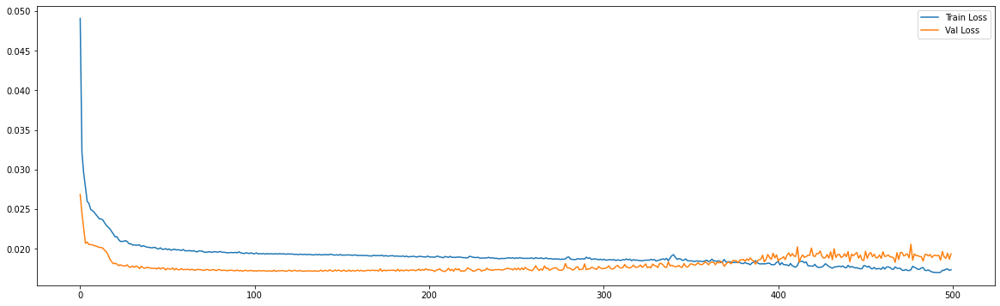

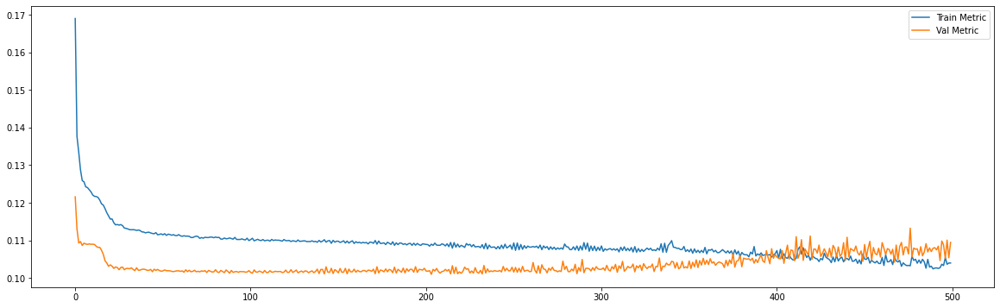

============================model:40===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0168 - mae: 0.1026
loss and metric train data [0.016752805560827255, 0.10256900638341904]
6/6 [==============================] - 0s 7ms/step - loss: 0.0200 - mae: 0.1109
loss and metric val data [0.019986990839242935, 0.11093097180128098]
6/6 [==============================] - 0s 7ms/step - loss: 0.0230 - mae: 0.1179
loss and metric test data [0.02297268807888031, 0.11790738999843597]


'neurons': 50, 'dropout': 0.4, 'time_steps': 100, 'batch_size':32, 'learning_rate':0.001, 'hidden_layers':1




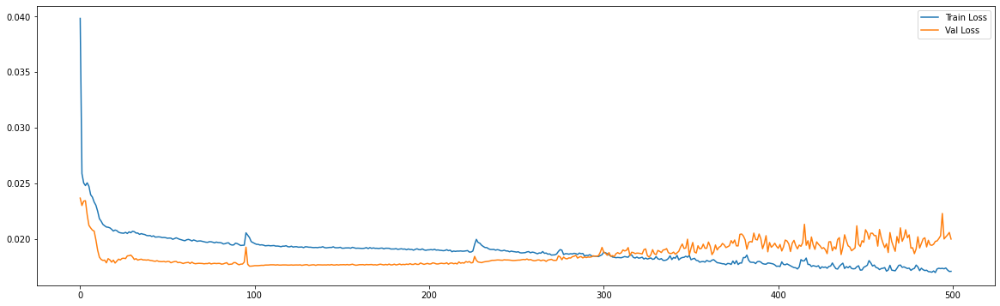

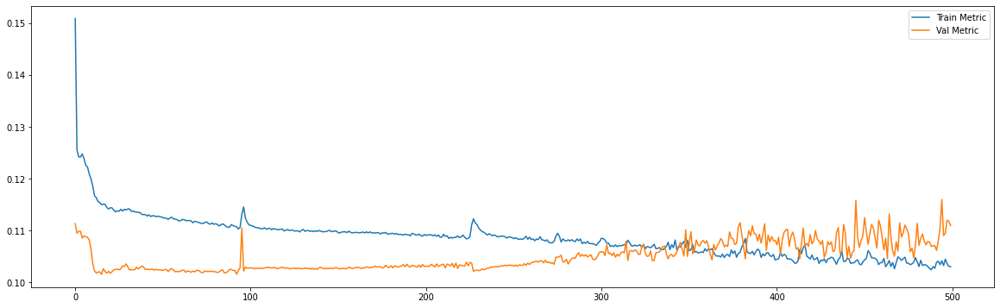

============================model:41===========================
36/36 [==============================] - 1s 15ms/step - loss: 0.0155 - mae: 0.0988
loss and metric train data [0.015525652095675468, 0.09882231801748276]
6/6 [==============================] - 0s 14ms/step - loss: 0.0220 - mae: 0.1181
loss and metric val data [0.02200848050415516, 0.11806035041809082]
6/6 [==============================] - 0s 13ms/step - loss: 0.0218 - mae: 0.1157
loss and metric test data [0.021808290854096413, 0.11569802463054657]


'neurons': 50, 'dropout': 0.4, 'time_steps': 100, 'batch_size':32, 'hidden_layers':2




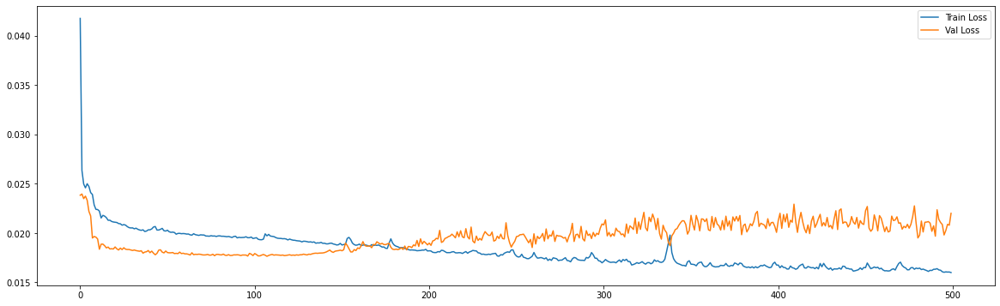

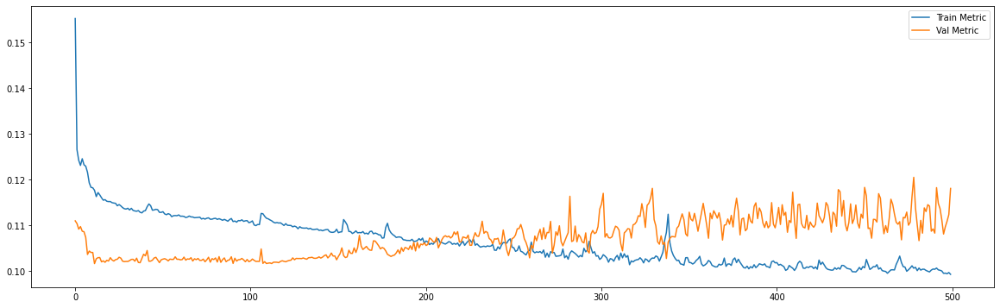

============================model:42===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0183 - mae: 0.1060
loss and metric train data [0.018253998830914497, 0.10604682564735413]
6/6 [==============================] - 0s 7ms/step - loss: 0.0187 - mae: 0.1051
loss and metric val data [0.018680894747376442, 0.10512369126081467]
6/6 [==============================] - 0s 7ms/step - loss: 0.0200 - mae: 0.1111
loss and metric test data [0.01999031752347946, 0.11114352941513062]


'neurons': 50, 'dropout': 0.4, 'time_steps': 100, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




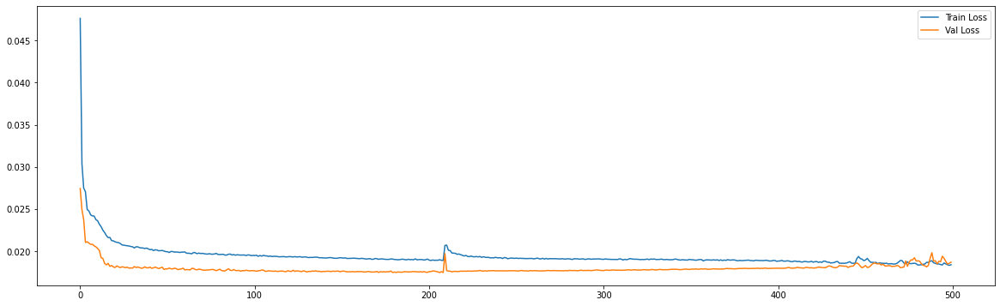

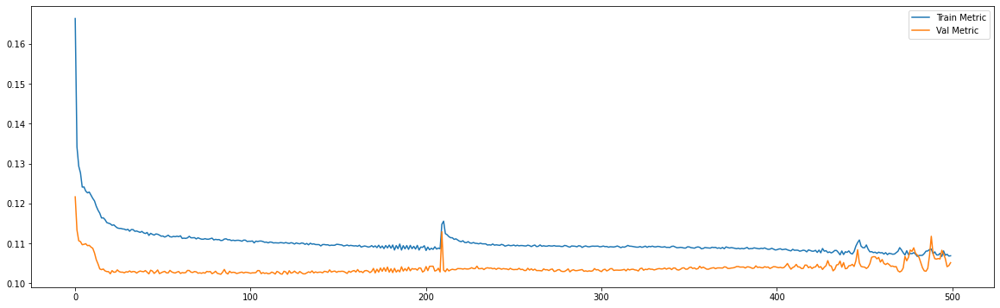

============================model:43===========================
36/36 [==============================] - 1s 16ms/step - loss: 0.0173 - mae: 0.1050
loss and metric train data [0.017346112057566643, 0.10502506792545319]
6/6 [==============================] - 0s 14ms/step - loss: 0.0193 - mae: 0.1117
loss and metric val data [0.019333522766828537, 0.11173447966575623]
6/6 [==============================] - 0s 14ms/step - loss: 0.0211 - mae: 0.1148
loss and metric test data [0.02106836624443531, 0.1147516593337059]


'neurons': 50, 'dropout': 0.4, 'time_steps': 100, 'batch_size':60, 'hidden_layers':2




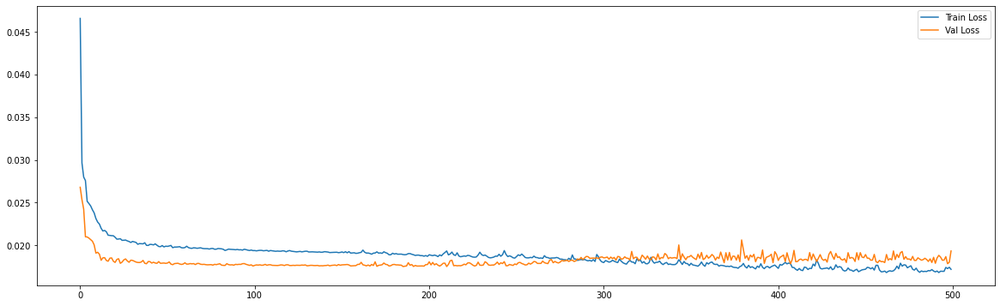

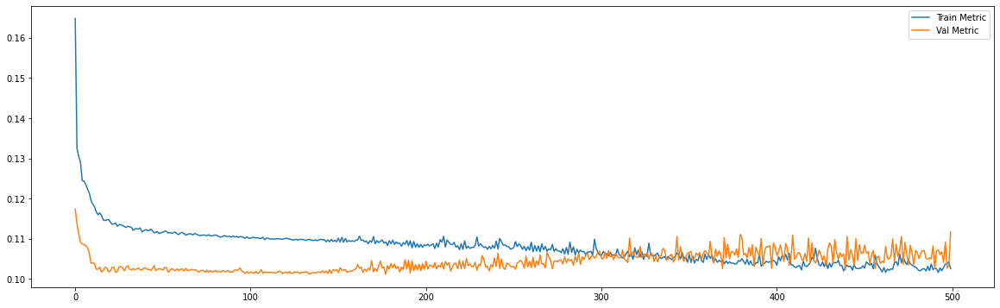

============================model:44===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0179 - mae: 0.1046
loss and metric train data [0.017863275483250618, 0.10462062805891037]
6/6 [==============================] - 0s 7ms/step - loss: 0.0187 - mae: 0.1049
loss and metric val data [0.018699217587709427, 0.104878269135952]
6/6 [==============================] - 0s 7ms/step - loss: 0.0201 - mae: 0.1109
loss and metric test data [0.020120345056056976, 0.11090648919343948]


'neurons': 50, 'dropout': 0.4, 'time_steps': 100, 'batch_size':84, 'learning_rate':0.001, 'hidden_layers':1




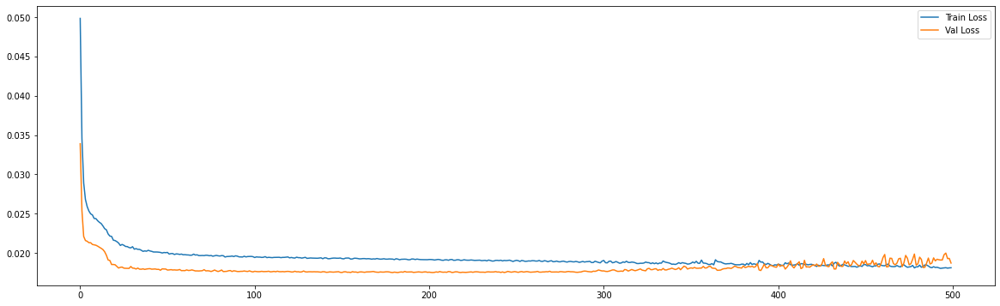

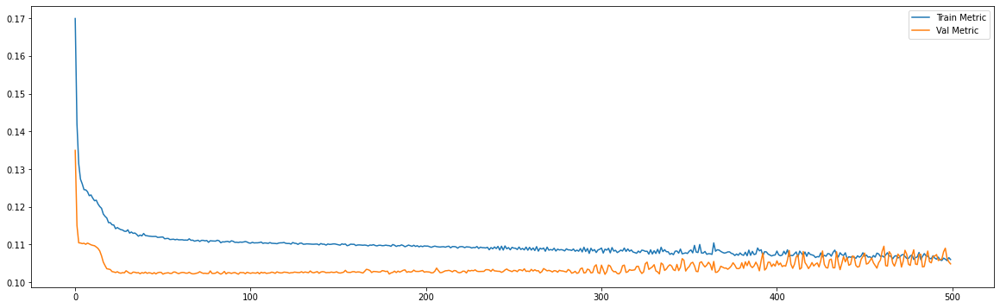

============================model:45===========================
36/36 [==============================] - 1s 16ms/step - loss: 0.0173 - mae: 0.1033
loss and metric train data [0.017312750220298767, 0.10329198092222214]
6/6 [==============================] - 0s 13ms/step - loss: 0.0193 - mae: 0.1062
loss and metric val data [0.019299887120723724, 0.10622704774141312]
6/6 [==============================] - 0s 13ms/step - loss: 0.0208 - mae: 0.1154
loss and metric test data [0.020842749625444412, 0.11542834341526031]


'neurons': 50, 'dropout': 0.4, 'time_steps': 100, 'batch_size':84, 'hidden_layers':2




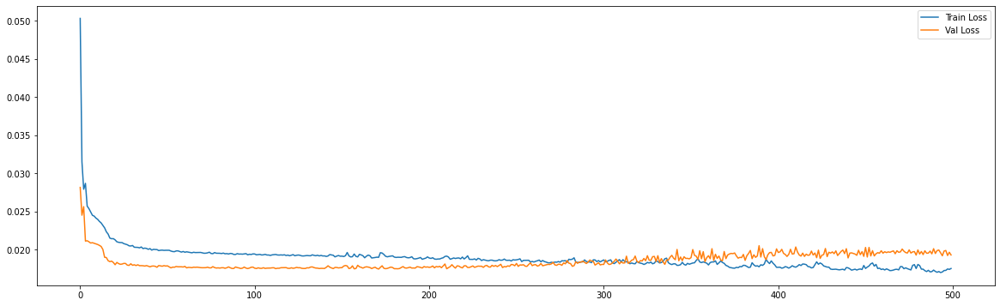

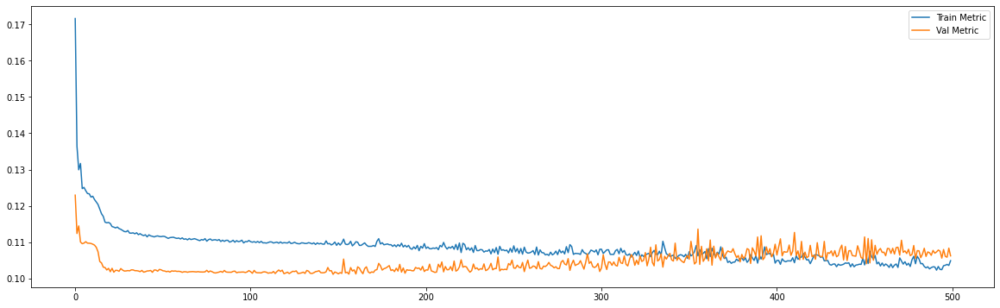

============================model:46===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0178 - mae: 0.1050
loss and metric train data [0.01776638813316822, 0.10504491627216339]
6/6 [==============================] - 0s 7ms/step - loss: 0.0192 - mae: 0.1065
loss and metric val data [0.01921699568629265, 0.10647343099117279]
6/6 [==============================] - 0s 7ms/step - loss: 0.0201 - mae: 0.1109
loss and metric test data [0.020086338743567467, 0.11086052656173706]


'neurons': 50, 'dropout': 0.4, 'time_steps': 100, 'batch_size':100, 'learning_rate':0.001, 'hidden_layers':1




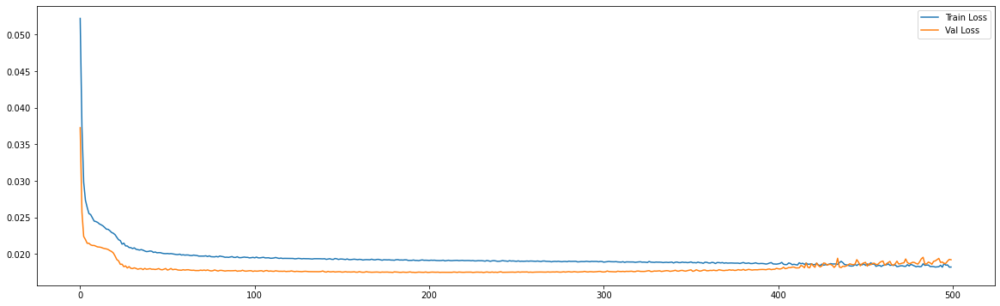

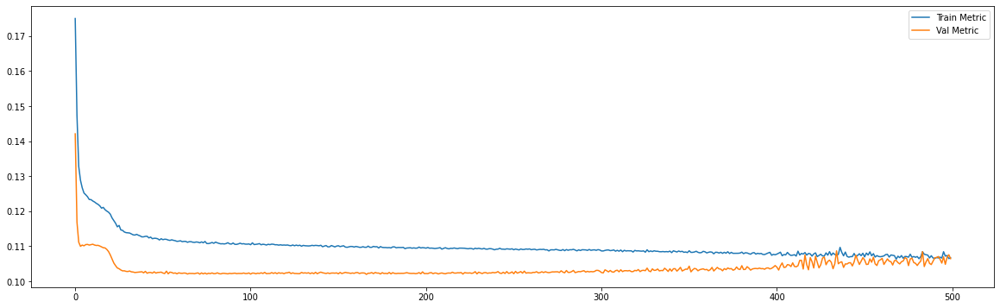

============================model:47===========================
36/36 [==============================] - 1s 15ms/step - loss: 0.0183 - mae: 0.1063
loss and metric train data [0.018301403149962425, 0.10631660372018814]
6/6 [==============================] - 0s 13ms/step - loss: 0.0185 - mae: 0.1037
loss and metric val data [0.018511664122343063, 0.1037042960524559]
6/6 [==============================] - 0s 13ms/step - loss: 0.0197 - mae: 0.1100
loss and metric test data [0.01967669278383255, 0.10995811969041824]


'neurons': 50, 'dropout': 0.4, 'time_steps': 100, 'batch_size':100, 'hidden_layers':2




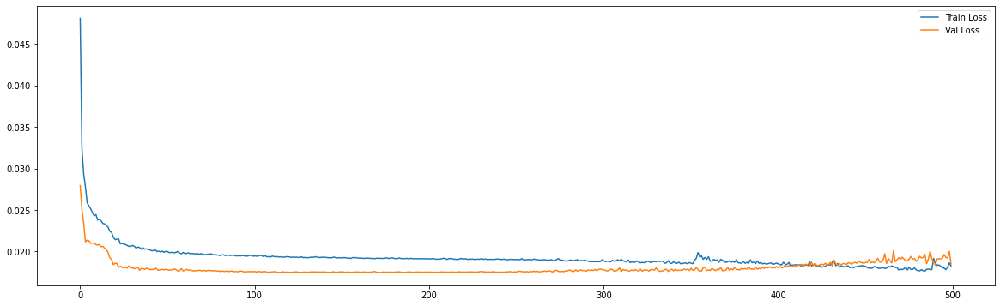

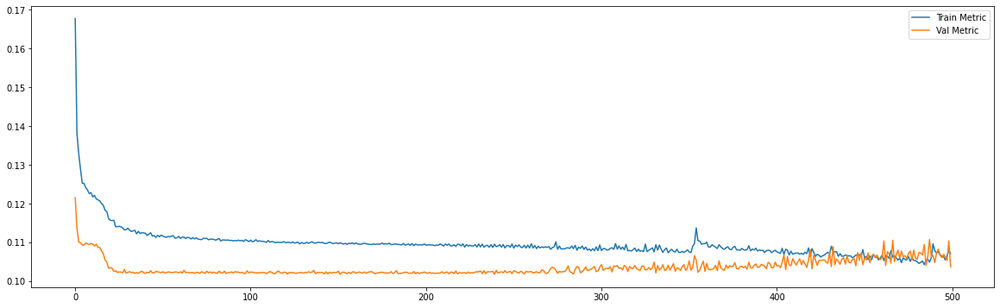

============================model:48===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0150 - mae: 0.0961
loss and metric train data [0.01502505037933588, 0.09610388427972794]
8/8 [==============================] - 0s 5ms/step - loss: 0.0213 - mae: 0.1152
loss and metric val data [0.02129538543522358, 0.11519359797239304]
8/8 [==============================] - 0s 5ms/step - loss: 0.0223 - mae: 0.1192
loss and metric test data [0.022254323586821556, 0.11917159706354141]


'neurons': 70, 'dropout': 0.2, 'time_steps': 60, 'batch_size':32, 'learning_rate':0.001, 'hidden_layers':1




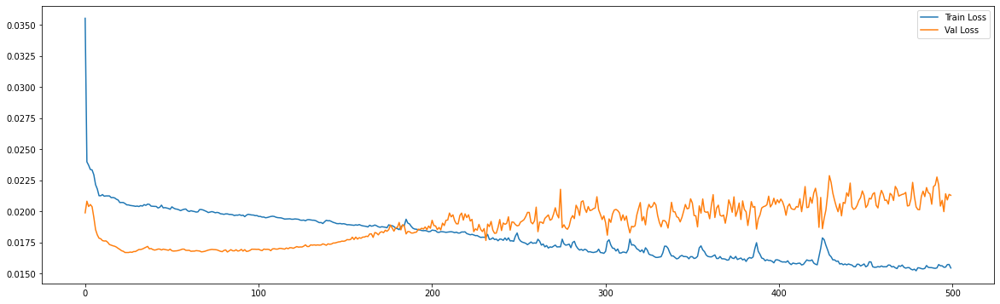

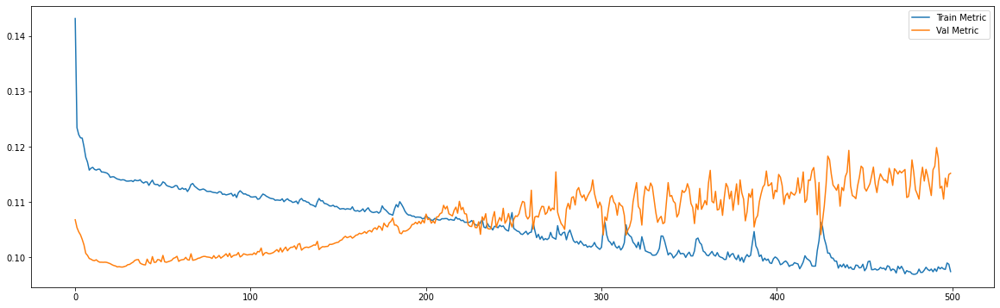

============================model:49===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0123 - mae: 0.0861
loss and metric train data [0.012320025824010372, 0.08607926964759827]
8/8 [==============================] - 0s 9ms/step - loss: 0.0217 - mae: 0.1143
loss and metric val data [0.021694643422961235, 0.11428352445363998]
8/8 [==============================] - 0s 9ms/step - loss: 0.0234 - mae: 0.1221
loss and metric test data [0.02343704365193844, 0.1221170648932457]


'neurons': 70, 'dropout': 0.2, 'time_steps': 60, 'batch_size':32, 'hidden_layers':2




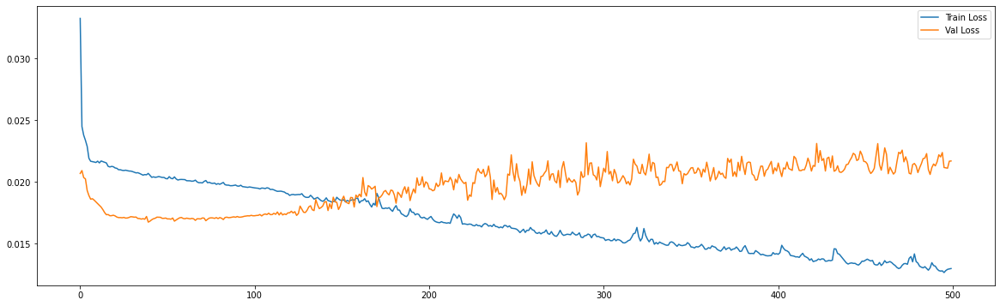

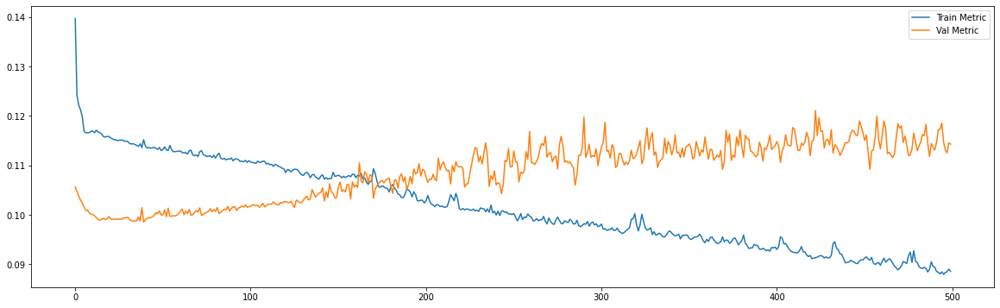

============================model:50===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0174 - mae: 0.1038
loss and metric train data [0.017371980473399162, 0.10382460057735443]
8/8 [==============================] - 0s 5ms/step - loss: 0.0180 - mae: 0.1055
loss and metric val data [0.017987623810768127, 0.10553418099880219]
8/8 [==============================] - 0s 5ms/step - loss: 0.0210 - mae: 0.1147
loss and metric test data [0.02101300098001957, 0.11473018676042557]


'neurons': 70, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




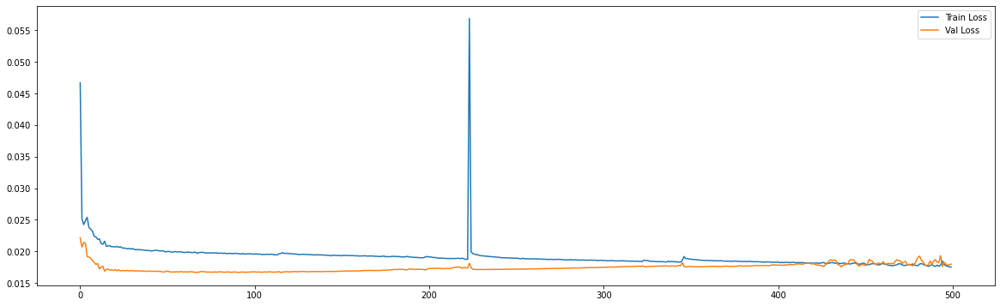

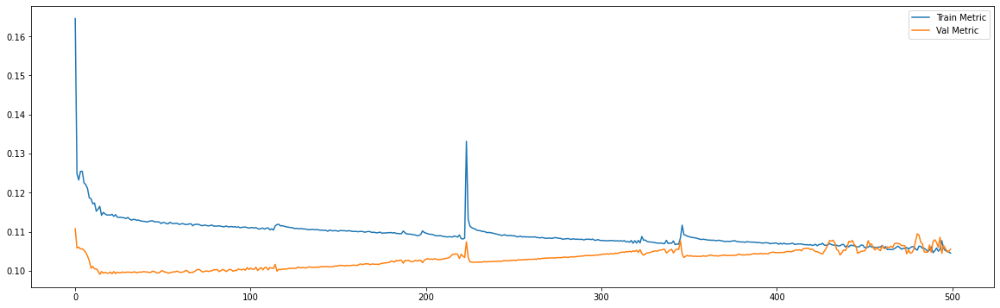

============================model:51===========================
39/39 [==============================] - 0s 11ms/step - loss: 0.0147 - mae: 0.0943
loss and metric train data [0.01468298863619566, 0.09432419389486313]
8/8 [==============================] - 0s 10ms/step - loss: 0.0203 - mae: 0.1118
loss and metric val data [0.020281244069337845, 0.1117996945977211]
8/8 [==============================] - 0s 9ms/step - loss: 0.0229 - mae: 0.1219
loss and metric test data [0.022921273484826088, 0.12188107520341873]


'neurons': 70, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




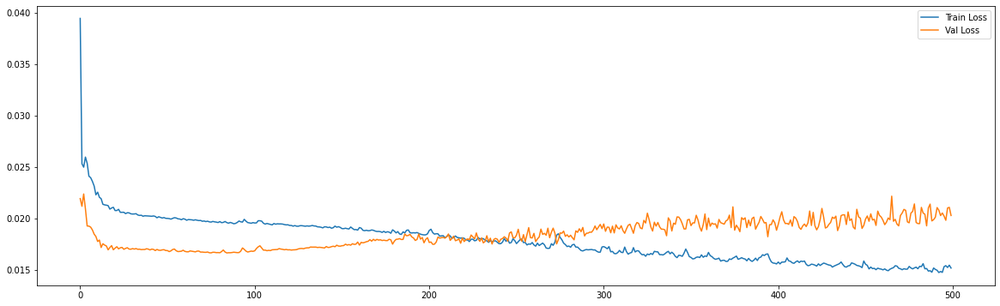

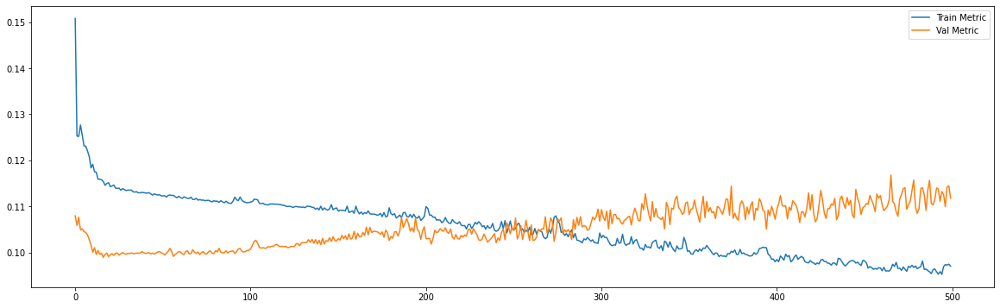

============================model:52===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0166 - mae: 0.1009
loss and metric train data [0.01663558930158615, 0.10090965032577515]
8/8 [==============================] - 0s 5ms/step - loss: 0.0179 - mae: 0.1048
loss and metric val data [0.01793595589697361, 0.10476502031087875]
8/8 [==============================] - 0s 5ms/step - loss: 0.0220 - mae: 0.1178
loss and metric test data [0.022010523825883865, 0.11781460046768188]


'neurons': 70, 'dropout': 0.2, 'time_steps': 60, 'batch_size':84, 'learning_rate':0.001, 'hidden_layers':1




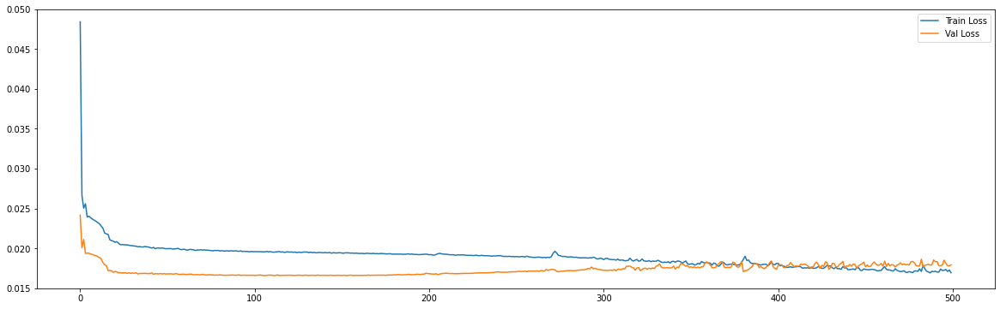

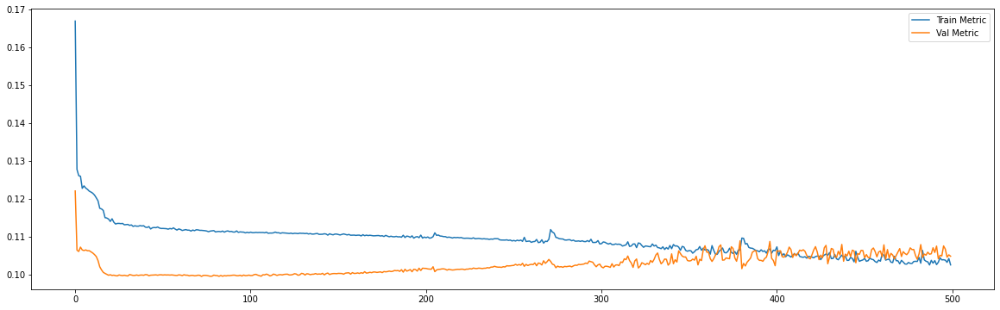

============================model:53===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0151 - mae: 0.0964
loss and metric train data [0.015051390044391155, 0.09637556225061417]
8/8 [==============================] - 0s 10ms/step - loss: 0.0193 - mae: 0.1086
loss and metric val data [0.019314449280500412, 0.10863780230283737]
8/8 [==============================] - 0s 9ms/step - loss: 0.0224 - mae: 0.1197
loss and metric test data [0.0223624836653471, 0.11970020830631256]


'neurons': 70, 'dropout': 0.2, 'time_steps': 60, 'batch_size':84, 'hidden_layers':2




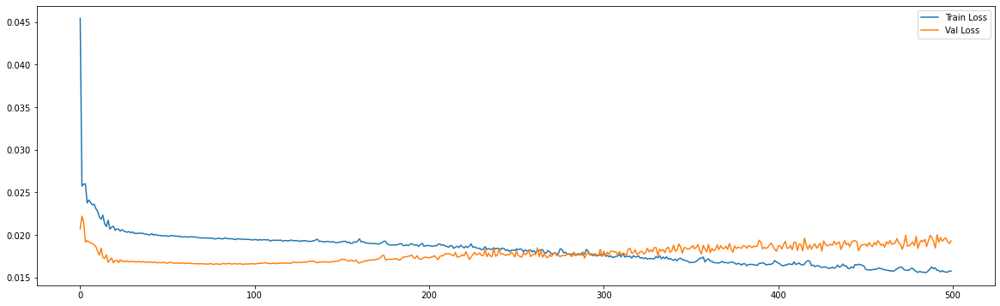

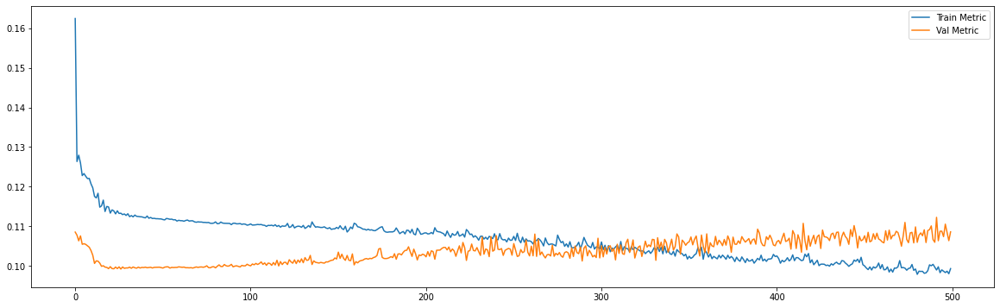

============================model:54===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0175 - mae: 0.1041
loss and metric train data [0.01749054528772831, 0.10409559309482574]
8/8 [==============================] - 0s 5ms/step - loss: 0.0189 - mae: 0.1066
loss and metric val data [0.018931720405817032, 0.1066301241517067]
8/8 [==============================] - 0s 5ms/step - loss: 0.0199 - mae: 0.1123
loss and metric test data [0.01986825466156006, 0.11226612329483032]


'neurons': 70, 'dropout': 0.2, 'time_steps': 60, 'batch_size':100, 'learning_rate':0.001, 'hidden_layers':1




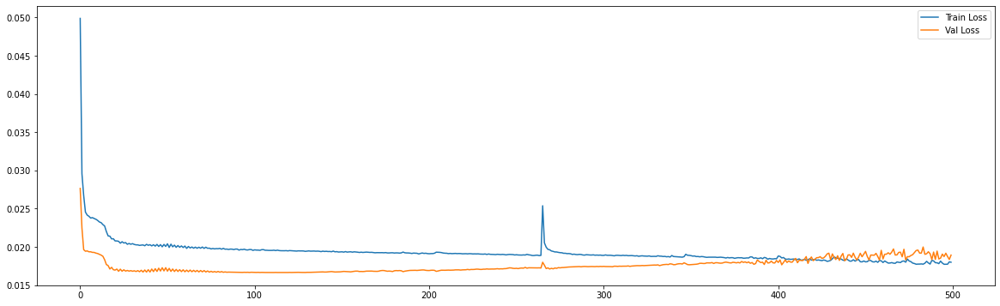

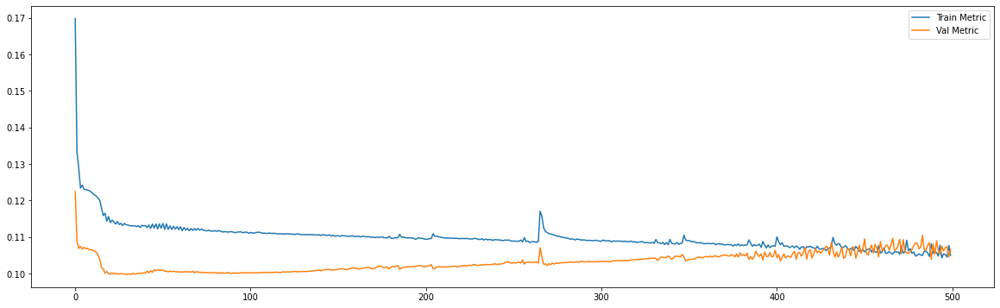

============================model:55===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0158 - mae: 0.0983
loss and metric train data [0.015771077945828438, 0.09831357002258301]
8/8 [==============================] - 0s 10ms/step - loss: 0.0195 - mae: 0.1072
loss and metric val data [0.01947295106947422, 0.10724399238824844]
8/8 [==============================] - 0s 9ms/step - loss: 0.0222 - mae: 0.1187
loss and metric test data [0.022219905629754066, 0.11865846812725067]


'neurons': 70, 'dropout': 0.2, 'time_steps': 60, 'batch_size':100, 'hidden_layers':2




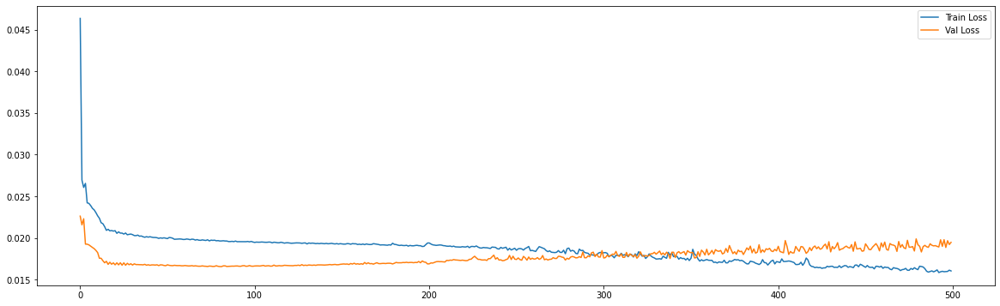

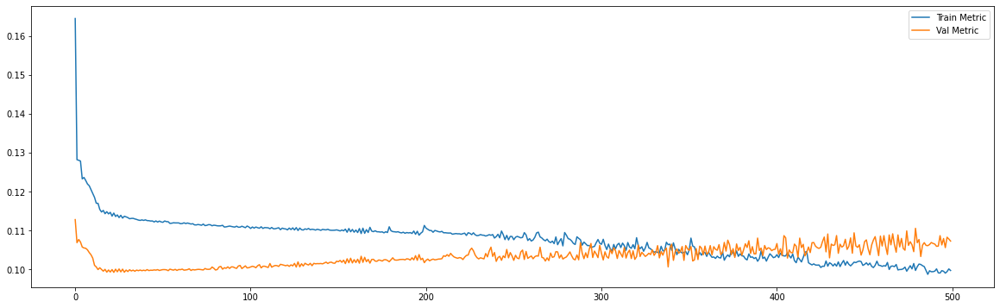

============================model:56===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0168 - mae: 0.1019
loss and metric train data [0.01676303893327713, 0.10193014144897461]
7/7 [==============================] - 0s 6ms/step - loss: 0.0201 - mae: 0.1098
loss and metric val data [0.020063193514943123, 0.10983309894800186]
7/7 [==============================] - 0s 6ms/step - loss: 0.0216 - mae: 0.1173
loss and metric test data [0.021568460389971733, 0.11734714359045029]


'neurons': 70, 'dropout': 0.2, 'time_steps': 84, 'batch_size':32, 'learning_rate':0.001, 'hidden_layers':1




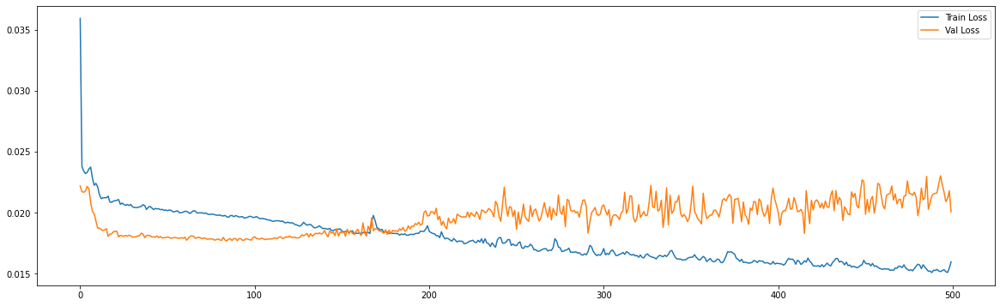

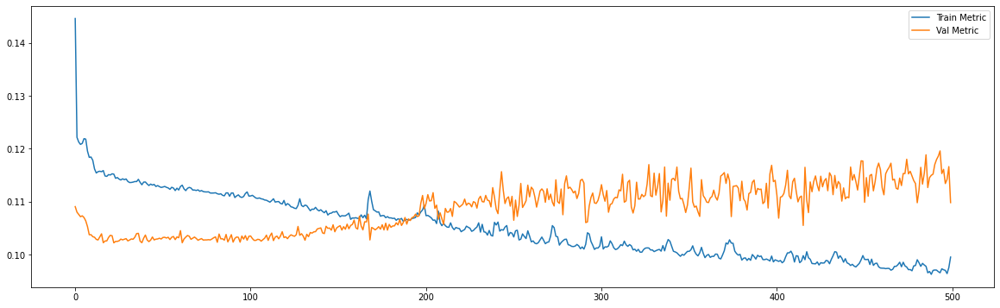

============================model:57===========================
37/37 [==============================] - 1s 14ms/step - loss: 0.0139 - mae: 0.0925
loss and metric train data [0.01391238160431385, 0.09248907119035721]
7/7 [==============================] - 0s 13ms/step - loss: 0.0215 - mae: 0.1166
loss and metric val data [0.021494103595614433, 0.11662309616804123]
7/7 [==============================] - 0s 12ms/step - loss: 0.0244 - mae: 0.1238
loss and metric test data [0.024382561445236206, 0.12381520867347717]


'neurons': 70, 'dropout': 0.2, 'time_steps': 84, 'batch_size':32, 'hidden_layers':2




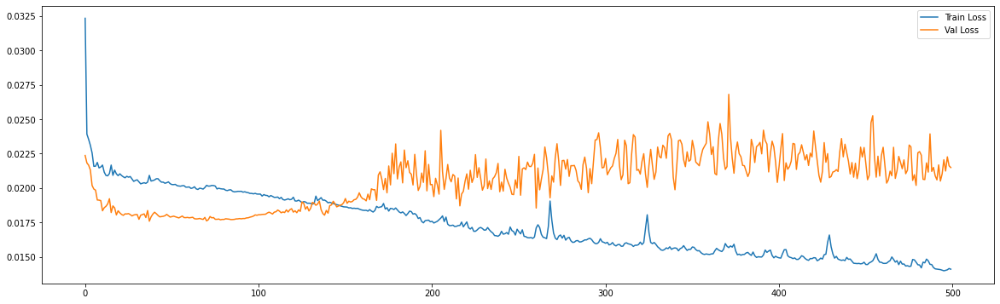

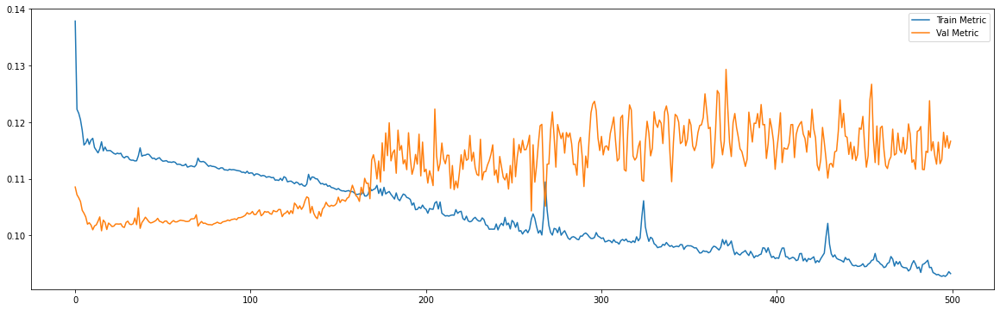

============================model:58===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0162 - mae: 0.0995
loss and metric train data [0.016205506399273872, 0.09949062764644623]
7/7 [==============================] - 0s 6ms/step - loss: 0.0219 - mae: 0.1160
loss and metric val data [0.02191130630671978, 0.11603492498397827]
7/7 [==============================] - 0s 6ms/step - loss: 0.0233 - mae: 0.1206
loss and metric test data [0.02334710583090782, 0.12063943594694138]


'neurons': 70, 'dropout': 0.2, 'time_steps': 84, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




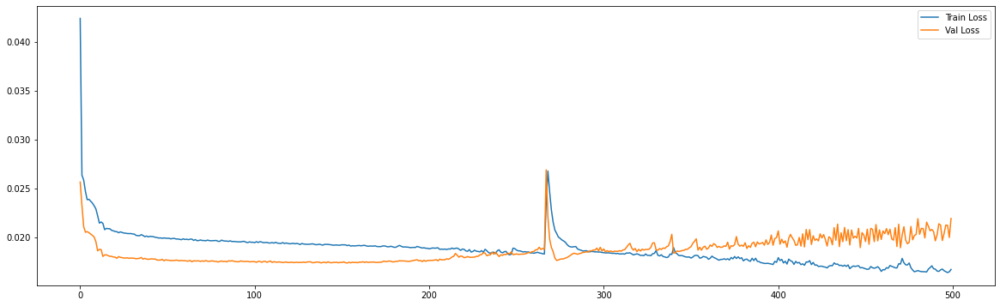

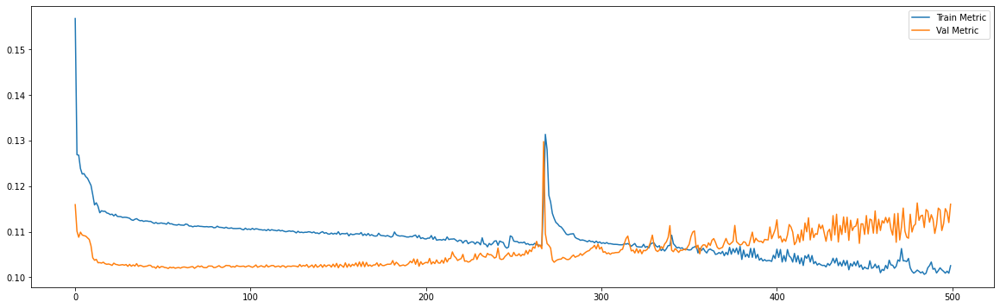

============================model:59===========================
37/37 [==============================] - 1s 14ms/step - loss: 0.0149 - mae: 0.0951
loss and metric train data [0.014883826486766338, 0.09512200951576233]
7/7 [==============================] - 0s 12ms/step - loss: 0.0227 - mae: 0.1183
loss and metric val data [0.022682877257466316, 0.11829015612602234]
7/7 [==============================] - 0s 12ms/step - loss: 0.0247 - mae: 0.1240
loss and metric test data [0.02471218630671501, 0.12399140745401382]


'neurons': 70, 'dropout': 0.2, 'time_steps': 84, 'batch_size':60, 'hidden_layers':2




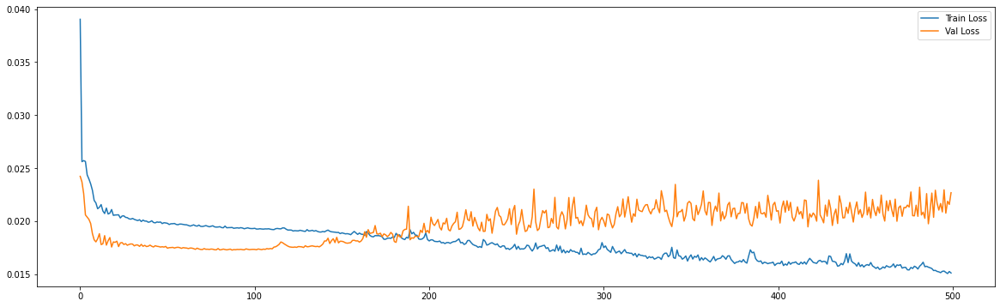

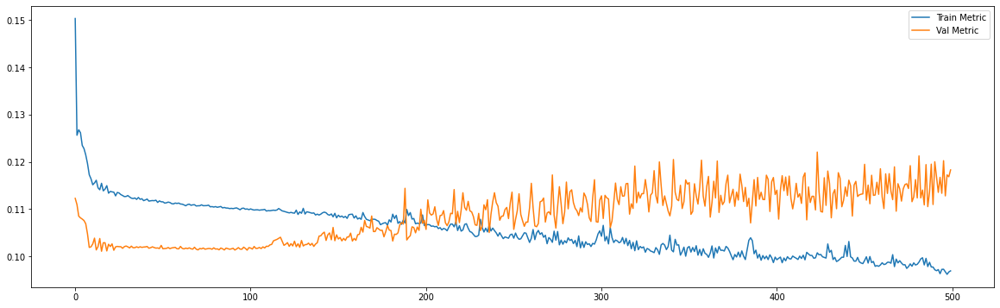

============================model:60===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0164 - mae: 0.1006
loss and metric train data [0.016352836042642593, 0.10063450038433075]
7/7 [==============================] - 0s 6ms/step - loss: 0.0197 - mae: 0.1103
loss and metric val data [0.019675979390740395, 0.11033526808023453]
7/7 [==============================] - 0s 6ms/step - loss: 0.0218 - mae: 0.1163
loss and metric test data [0.021750781685113907, 0.11625765264034271]


'neurons': 70, 'dropout': 0.2, 'time_steps': 84, 'batch_size':84, 'learning_rate':0.001, 'hidden_layers':1




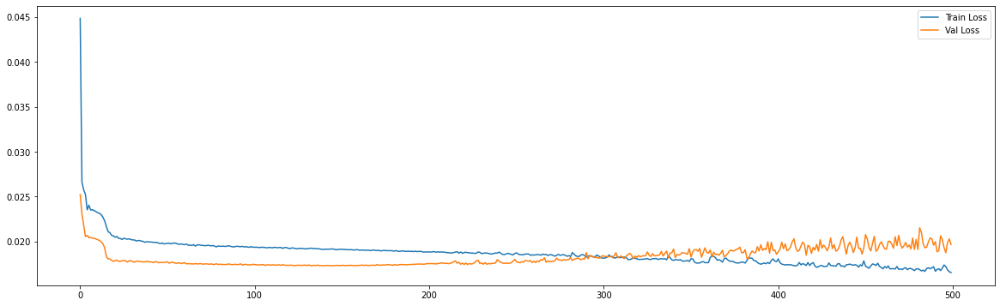

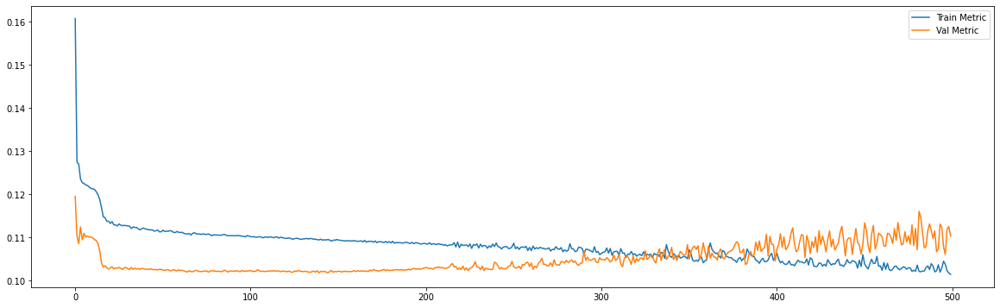

============================model:61===========================
37/37 [==============================] - 0s 14ms/step - loss: 0.0157 - mae: 0.0981
loss and metric train data [0.015690583735704422, 0.09806349128484726]
7/7 [==============================] - 0s 12ms/step - loss: 0.0197 - mae: 0.1090
loss and metric val data [0.019735941663384438, 0.1089753583073616]
7/7 [==============================] - 0s 13ms/step - loss: 0.0225 - mae: 0.1186
loss and metric test data [0.022549914196133614, 0.1185709536075592]


'neurons': 70, 'dropout': 0.2, 'time_steps': 84, 'batch_size':84, 'hidden_layers':2




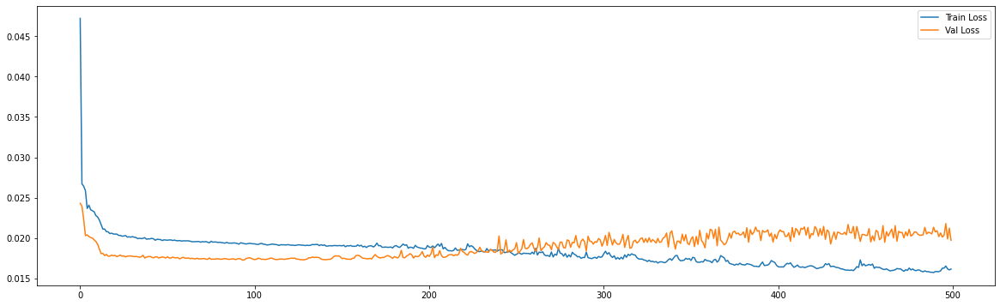

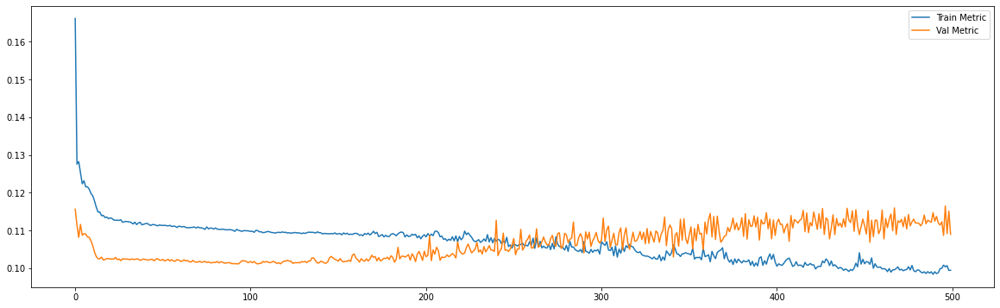

============================model:62===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0166 - mae: 0.1013
loss and metric train data [0.016643326729536057, 0.10129284858703613]
7/7 [==============================] - 0s 6ms/step - loss: 0.0205 - mae: 0.1102
loss and metric val data [0.020497051998972893, 0.11022023856639862]
7/7 [==============================] - 0s 6ms/step - loss: 0.0246 - mae: 0.1230
loss and metric test data [0.024554237723350525, 0.12298064678907394]


'neurons': 70, 'dropout': 0.2, 'time_steps': 84, 'batch_size':100, 'learning_rate':0.001, 'hidden_layers':1




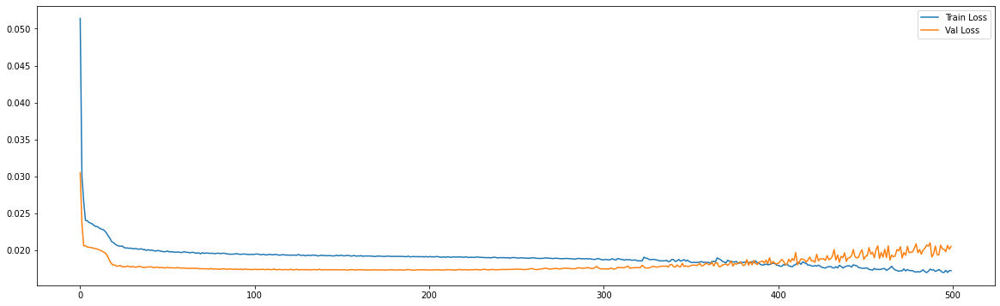

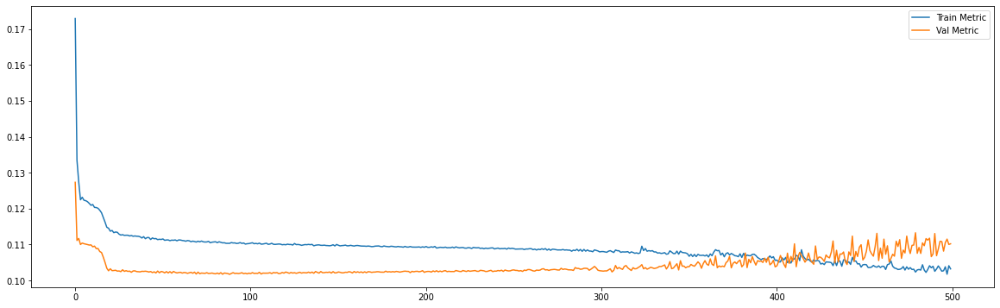

============================model:63===========================
37/37 [==============================] - 0s 13ms/step - loss: 0.0159 - mae: 0.0990
loss and metric train data [0.0158695038408041, 0.09897997975349426]
7/7 [==============================] - 0s 11ms/step - loss: 0.0195 - mae: 0.1092
loss and metric val data [0.019480256363749504, 0.10919557511806488]
7/7 [==============================] - 0s 11ms/step - loss: 0.0242 - mae: 0.1217
loss and metric test data [0.024203354492783546, 0.12167732417583466]


'neurons': 70, 'dropout': 0.2, 'time_steps': 84, 'batch_size':100, 'hidden_layers':2




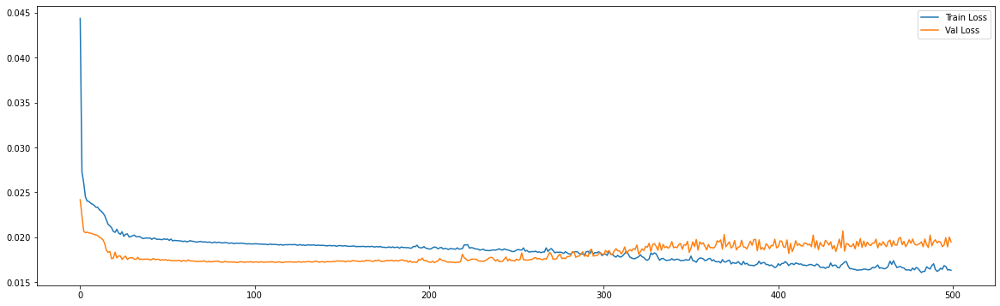

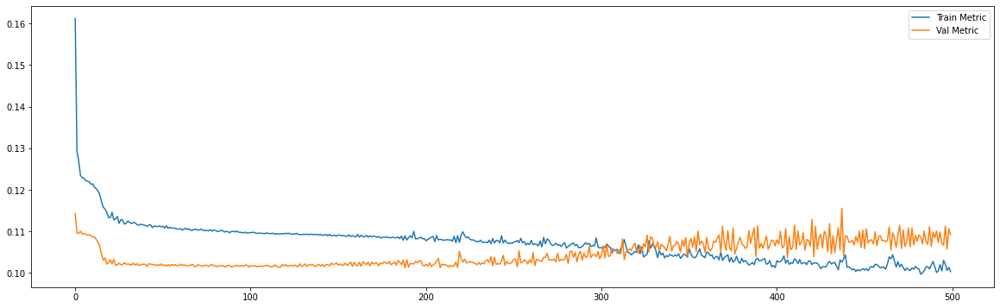

============================model:64===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0154 - mae: 0.0964
loss and metric train data [0.015400981530547142, 0.09641655534505844]
6/6 [==============================] - 0s 7ms/step - loss: 0.0241 - mae: 0.1221
loss and metric val data [0.024098947644233704, 0.12205556035041809]
6/6 [==============================] - 0s 7ms/step - loss: 0.0215 - mae: 0.1158
loss and metric test data [0.02151668816804886, 0.11576873809099197]


'neurons': 70, 'dropout': 0.2, 'time_steps': 100, 'batch_size':32, 'learning_rate':0.001, 'hidden_layers':1




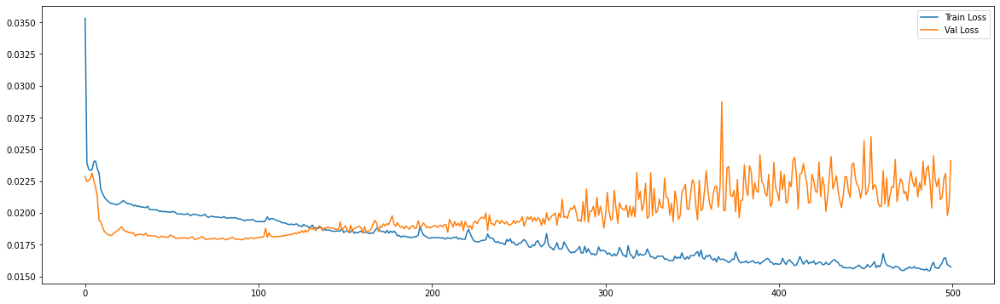

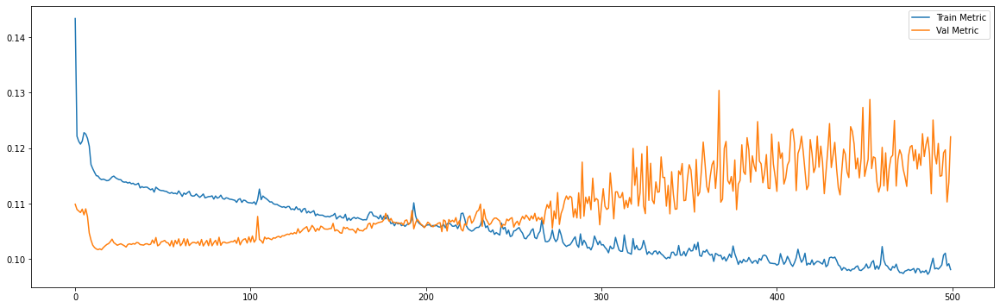

============================model:65===========================
36/36 [==============================] - 1s 16ms/step - loss: 0.0130 - mae: 0.0880
loss and metric train data [0.012971232645213604, 0.08799600601196289]
6/6 [==============================] - 0s 13ms/step - loss: 0.0216 - mae: 0.1145
loss and metric val data [0.02163463644683361, 0.11452341079711914]
6/6 [==============================] - 0s 13ms/step - loss: 0.0238 - mae: 0.1215
loss and metric test data [0.02377244085073471, 0.12149655073881149]


'neurons': 70, 'dropout': 0.2, 'time_steps': 100, 'batch_size':32, 'hidden_layers':2




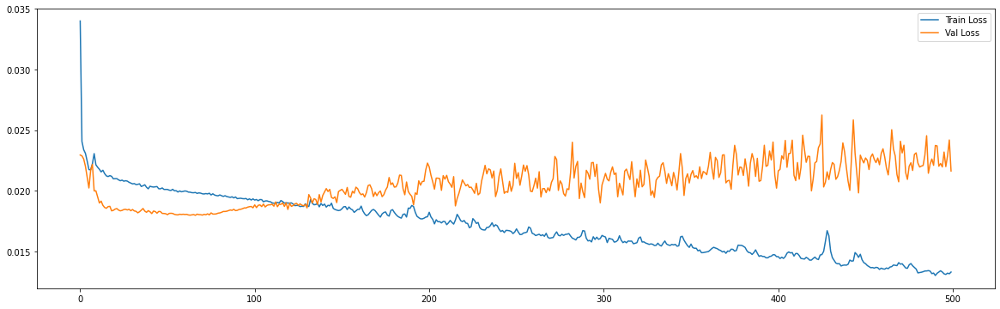

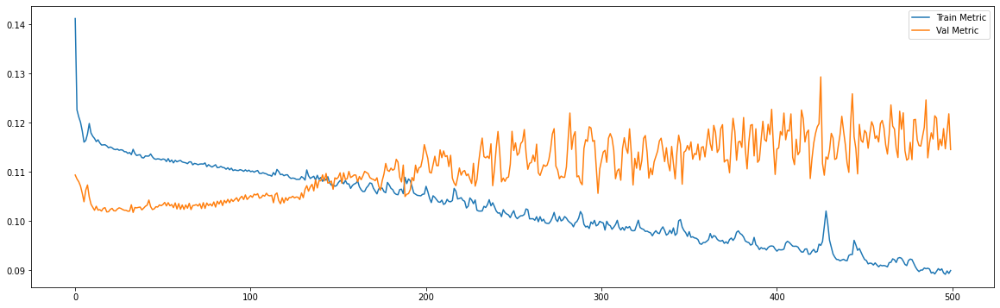

============================model:66===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0165 - mae: 0.1009
loss and metric train data [0.016525615006685257, 0.10087209939956665]
6/6 [==============================] - 0s 7ms/step - loss: 0.0194 - mae: 0.1089
loss and metric val data [0.019394930452108383, 0.10893169045448303]
6/6 [==============================] - 0s 7ms/step - loss: 0.0212 - mae: 0.1135
loss and metric test data [0.021168900653719902, 0.11345794796943665]


'neurons': 70, 'dropout': 0.2, 'time_steps': 100, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




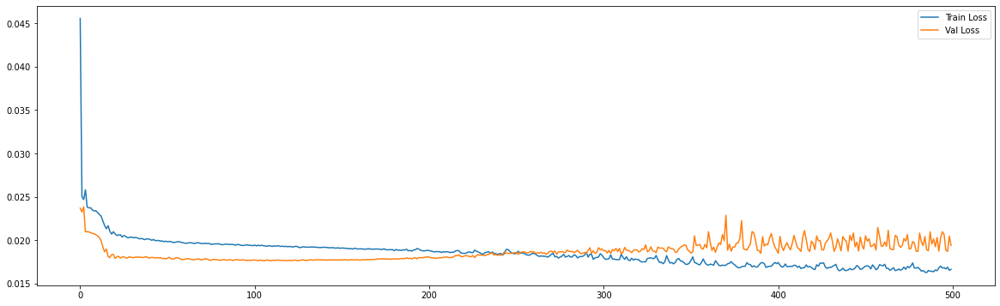

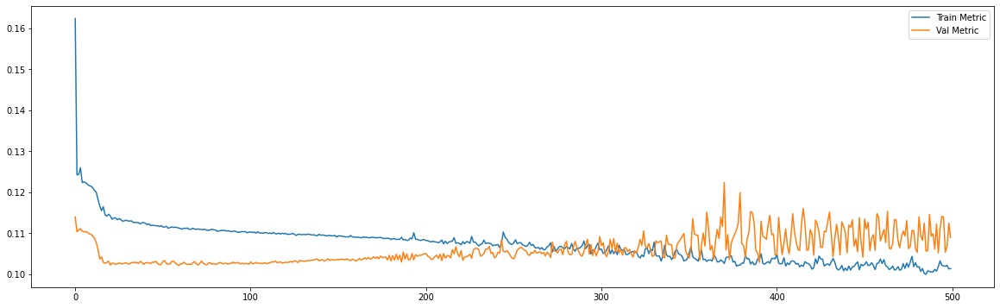

============================model:67===========================
36/36 [==============================] - 1s 16ms/step - loss: 0.0152 - mae: 0.0970
loss and metric train data [0.015173044987022877, 0.09695116430521011]
6/6 [==============================] - 0s 14ms/step - loss: 0.0185 - mae: 0.1075
loss and metric val data [0.018465982750058174, 0.10747292637825012]
6/6 [==============================] - 0s 14ms/step - loss: 0.0239 - mae: 0.1234
loss and metric test data [0.023866714909672737, 0.12344689667224884]


'neurons': 70, 'dropout': 0.2, 'time_steps': 100, 'batch_size':60, 'hidden_layers':2




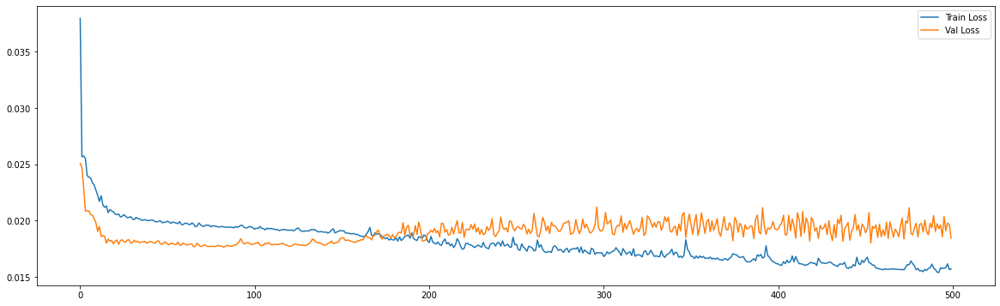

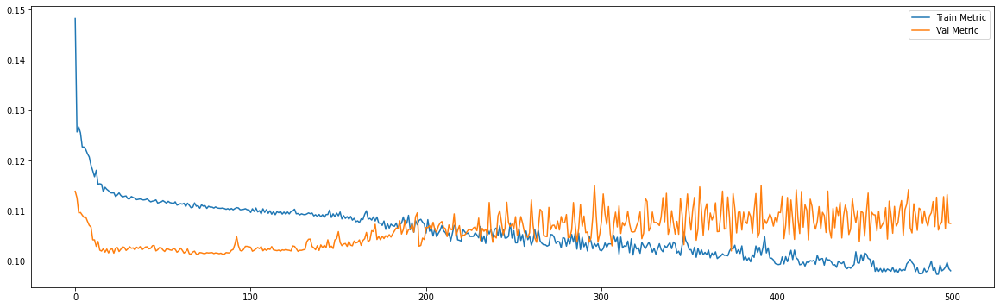

============================model:68===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0176 - mae: 0.1037
loss and metric train data [0.017578808590769768, 0.10374712198972702]
6/6 [==============================] - 0s 7ms/step - loss: 0.0193 - mae: 0.1051
loss and metric val data [0.019312437623739243, 0.1050637811422348]
6/6 [==============================] - 0s 7ms/step - loss: 0.0204 - mae: 0.1113
loss and metric test data [0.020431973040103912, 0.11134879291057587]


'neurons': 70, 'dropout': 0.2, 'time_steps': 100, 'batch_size':84, 'learning_rate':0.001, 'hidden_layers':1




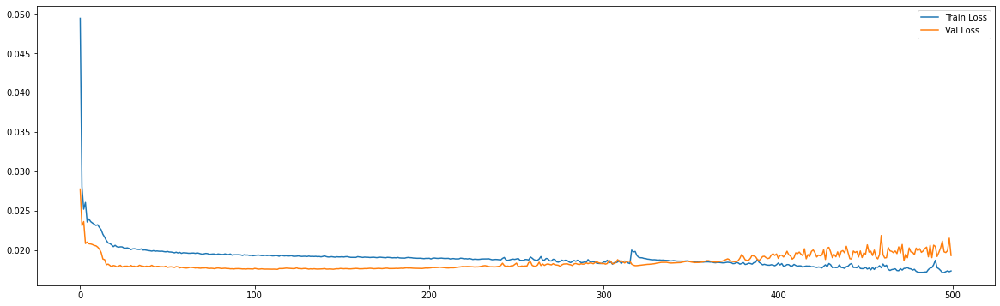

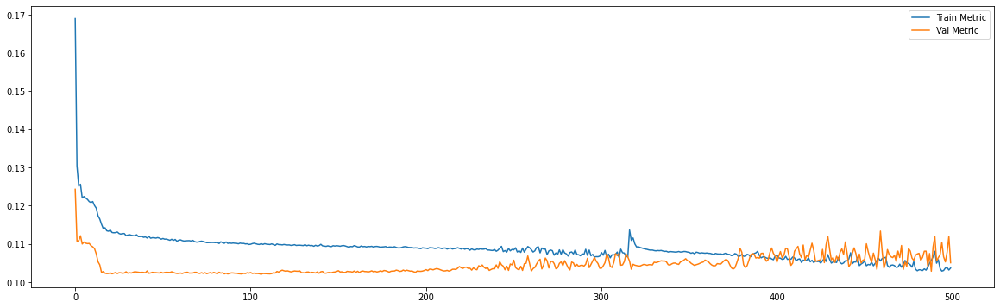

============================model:69===========================
36/36 [==============================] - 1s 16ms/step - loss: 0.0157 - mae: 0.0991
loss and metric train data [0.01567259058356285, 0.09910201281309128]
6/6 [==============================] - 0s 14ms/step - loss: 0.0199 - mae: 0.1106
loss and metric val data [0.0198675449937582, 0.11062370985746384]
6/6 [==============================] - 0s 13ms/step - loss: 0.0226 - mae: 0.1197
loss and metric test data [0.022583410143852234, 0.11971911042928696]


'neurons': 70, 'dropout': 0.2, 'time_steps': 100, 'batch_size':84, 'hidden_layers':2




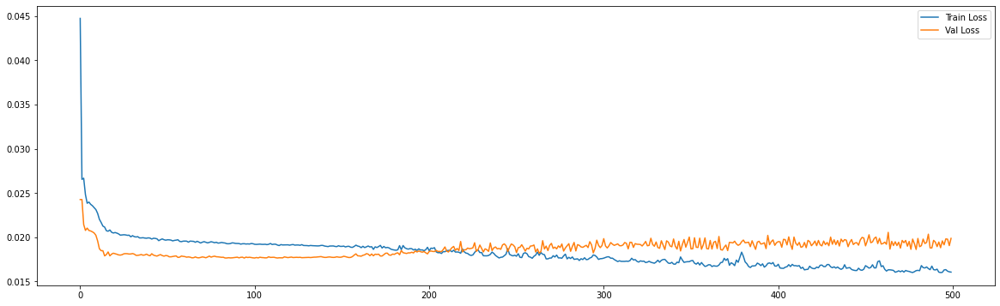

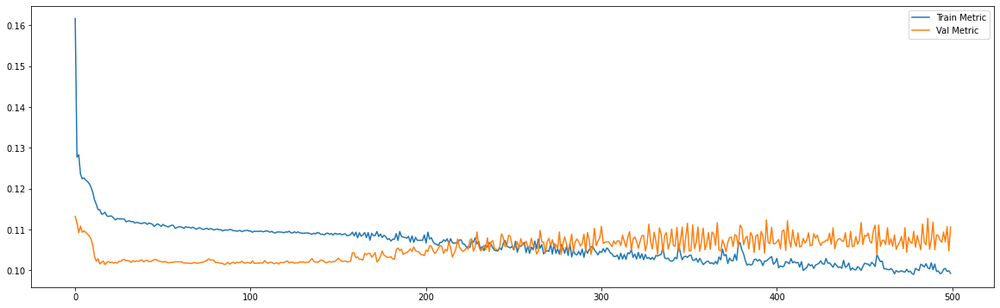

============================model:70===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0182 - mae: 0.1055
loss and metric train data [0.01816963590681553, 0.10549523681402206]
6/6 [==============================] - 0s 7ms/step - loss: 0.0214 - mae: 0.1147
loss and metric val data [0.021355167031288147, 0.11470286548137665]
6/6 [==============================] - 0s 7ms/step - loss: 0.0229 - mae: 0.1183
loss and metric test data [0.022881057113409042, 0.11825335025787354]


'neurons': 70, 'dropout': 0.2, 'time_steps': 100, 'batch_size':100, 'learning_rate':0.001, 'hidden_layers':1




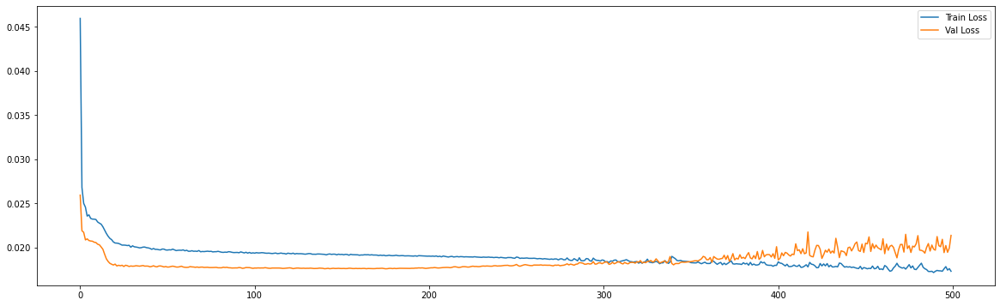

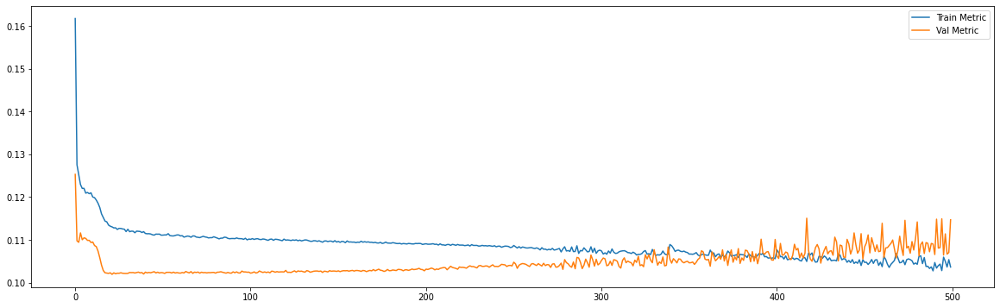

============================model:71===========================
36/36 [==============================] - 1s 15ms/step - loss: 0.0162 - mae: 0.0999
loss and metric train data [0.016151420772075653, 0.09989789128303528]
6/6 [==============================] - 0s 13ms/step - loss: 0.0204 - mae: 0.1129
loss and metric val data [0.020405124872922897, 0.11288207024335861]
6/6 [==============================] - 0s 13ms/step - loss: 0.0239 - mae: 0.1214
loss and metric test data [0.02387445606291294, 0.12136083841323853]


'neurons': 70, 'dropout': 0.2, 'time_steps': 100, 'batch_size':100, 'hidden_layers':2




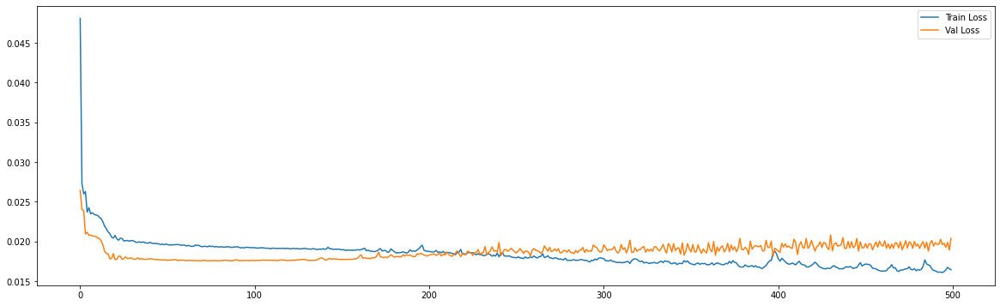

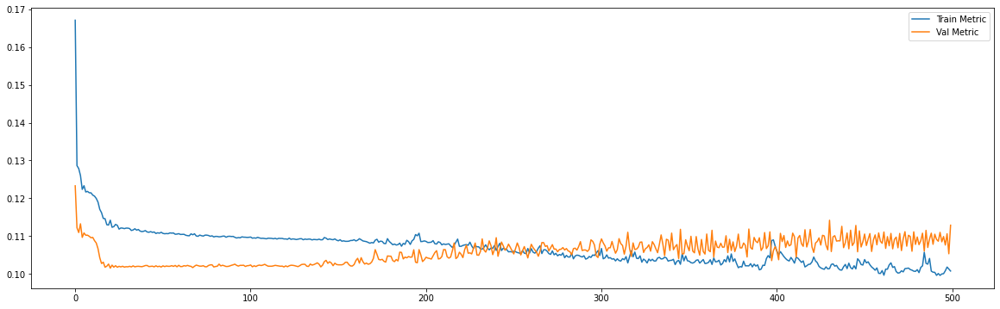

============================model:72===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0153 - mae: 0.0973
loss and metric train data [0.015276427380740643, 0.09726376831531525]
8/8 [==============================] - 0s 5ms/step - loss: 0.0199 - mae: 0.1116
loss and metric val data [0.019911492243409157, 0.11158378422260284]
8/8 [==============================] - 0s 5ms/step - loss: 0.0209 - mae: 0.1151
loss and metric test data [0.02092679962515831, 0.11509294807910919]


'neurons': 70, 'dropout': 0.4, 'time_steps': 60, 'batch_size':32, 'learning_rate':0.001, 'hidden_layers':1




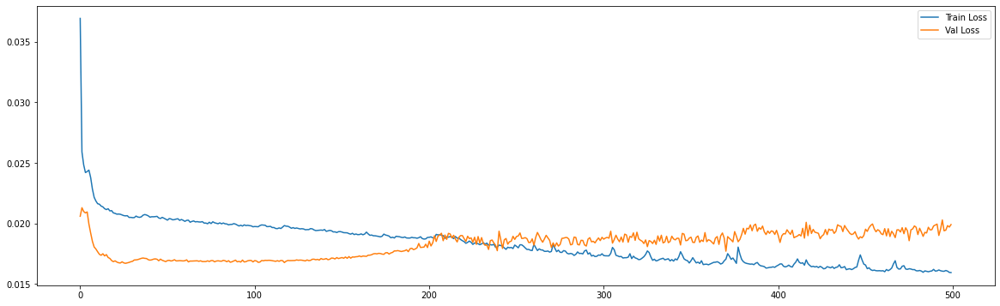

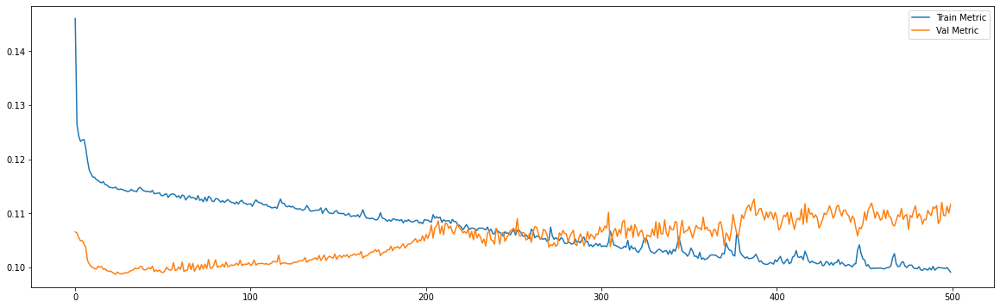

============================model:73===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0145 - mae: 0.0937
loss and metric train data [0.014496242627501488, 0.09374509751796722]
8/8 [==============================] - 0s 9ms/step - loss: 0.0206 - mae: 0.1114
loss and metric val data [0.02058093249797821, 0.11137736588716507]
8/8 [==============================] - 0s 9ms/step - loss: 0.0216 - mae: 0.1169
loss and metric test data [0.02158115804195404, 0.11693678796291351]


'neurons': 70, 'dropout': 0.4, 'time_steps': 60, 'batch_size':32, 'hidden_layers':2




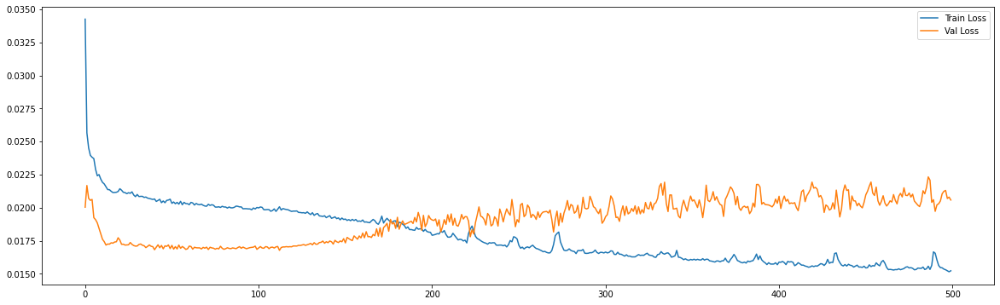

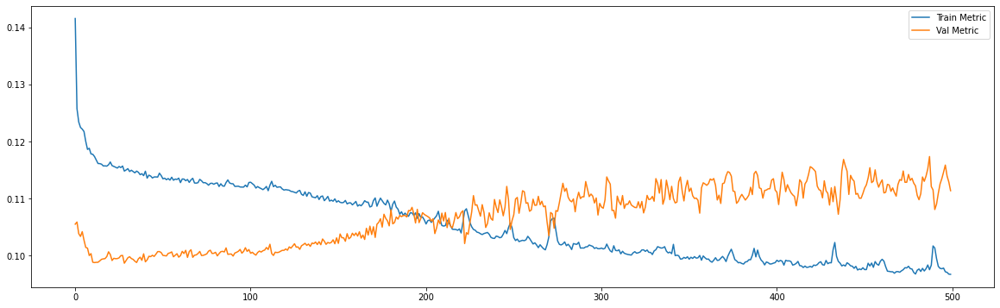

============================model:74===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0172 - mae: 0.1035
loss and metric train data [0.0172242633998394, 0.1035396158695221]
8/8 [==============================] - 0s 5ms/step - loss: 0.0182 - mae: 0.1051
loss and metric val data [0.018228741362690926, 0.10509113222360611]
8/8 [==============================] - 0s 5ms/step - loss: 0.0201 - mae: 0.1124
loss and metric test data [0.020067550241947174, 0.11239522695541382]


'neurons': 70, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




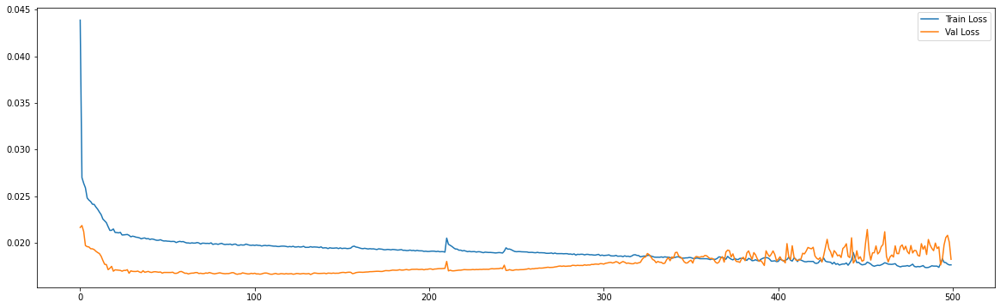

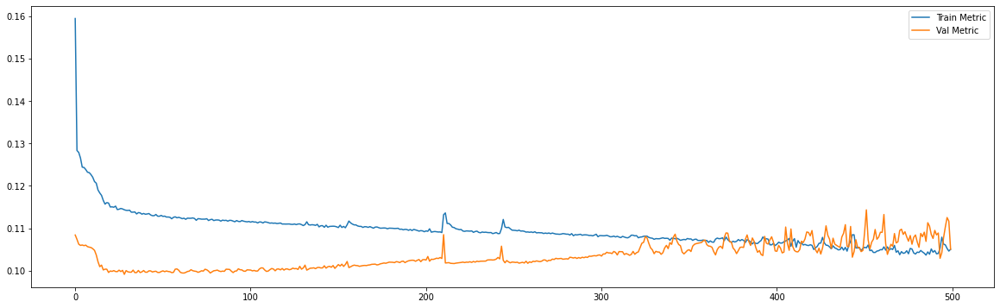

============================model:75===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0154 - mae: 0.0976
loss and metric train data [0.015366606414318085, 0.09756287187337875]
8/8 [==============================] - 0s 10ms/step - loss: 0.0201 - mae: 0.1104
loss and metric val data [0.020121106877923012, 0.11044140160083771]
8/8 [==============================] - 0s 9ms/step - loss: 0.0193 - mae: 0.1100
loss and metric test data [0.01931321620941162, 0.10996654629707336]


'neurons': 70, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




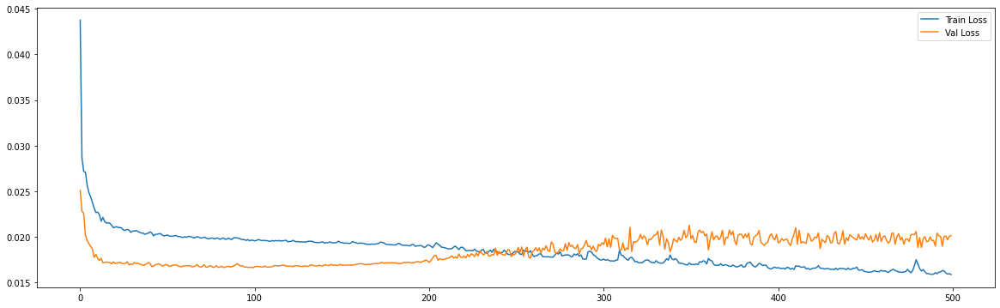

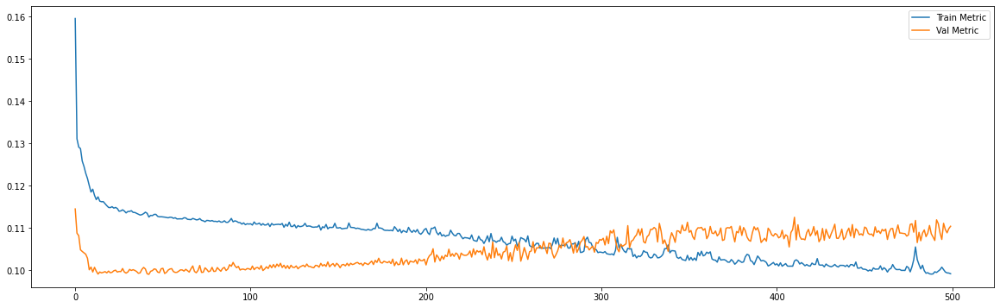

============================model:76===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0176 - mae: 0.1043
loss and metric train data [0.01759621687233448, 0.10432827472686768]
8/8 [==============================] - 0s 6ms/step - loss: 0.0176 - mae: 0.1040
loss and metric val data [0.017604226246476173, 0.10401764512062073]
8/8 [==============================] - 0s 5ms/step - loss: 0.0204 - mae: 0.1130
loss and metric test data [0.0204468946903944, 0.11304357647895813]


'neurons': 70, 'dropout': 0.4, 'time_steps': 60, 'batch_size':84, 'learning_rate':0.001, 'hidden_layers':1




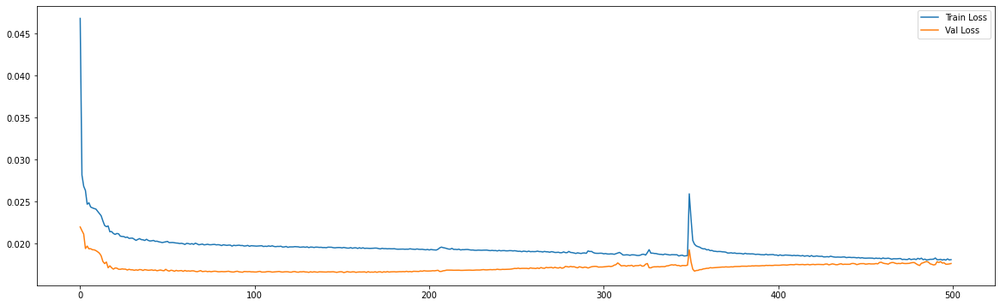

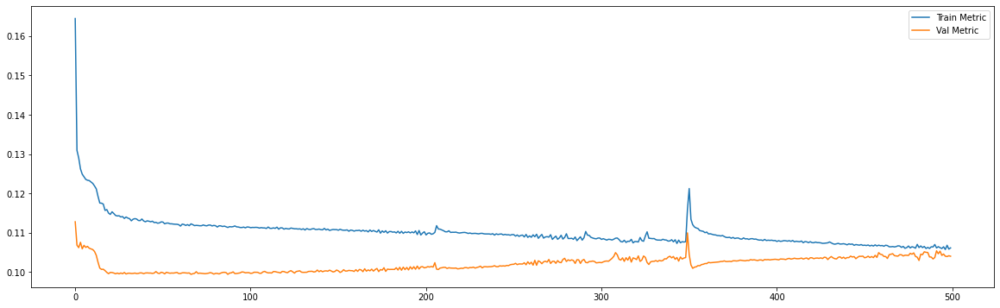

============================model:77===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0158 - mae: 0.0989
loss and metric train data [0.01583026349544525, 0.09885647892951965]
8/8 [==============================] - 0s 9ms/step - loss: 0.0190 - mae: 0.1076
loss and metric val data [0.019000280648469925, 0.10759066045284271]
8/8 [==============================] - 0s 10ms/step - loss: 0.0209 - mae: 0.1158
loss and metric test data [0.0209079347550869, 0.11576352268457413]


'neurons': 70, 'dropout': 0.4, 'time_steps': 60, 'batch_size':84, 'hidden_layers':2




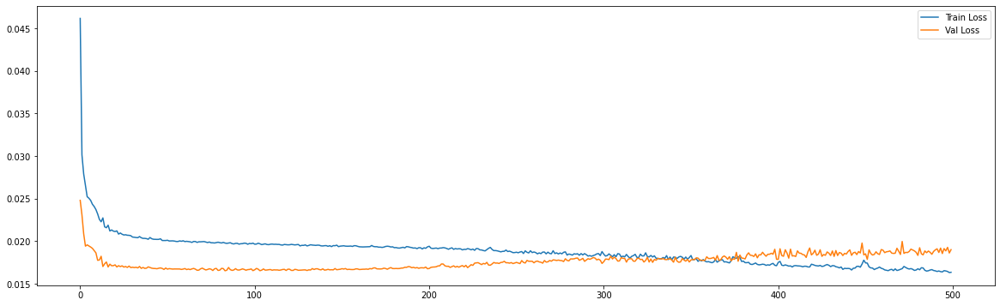

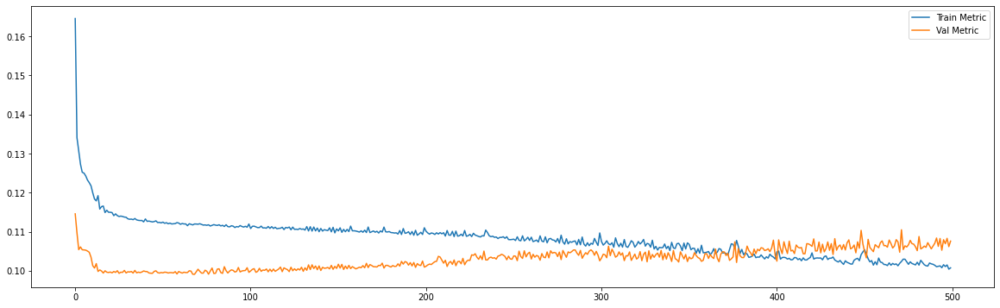

============================model:78===========================
39/39 [==============================] - 0s 6ms/step - loss: 0.0175 - mae: 0.1047
loss and metric train data [0.01746503636240959, 0.10474979877471924]
8/8 [==============================] - 0s 5ms/step - loss: 0.0187 - mae: 0.1078
loss and metric val data [0.01867912895977497, 0.10777726024389267]
8/8 [==============================] - 0s 5ms/step - loss: 0.0207 - mae: 0.1160
loss and metric test data [0.020745204761624336, 0.11595955491065979]


'neurons': 70, 'dropout': 0.4, 'time_steps': 60, 'batch_size':100, 'learning_rate':0.001, 'hidden_layers':1




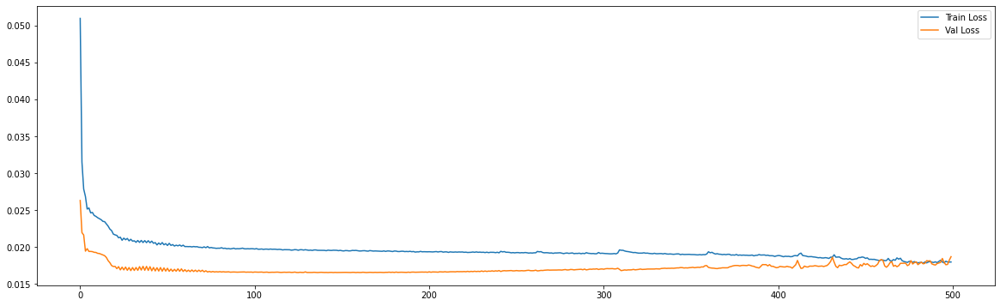

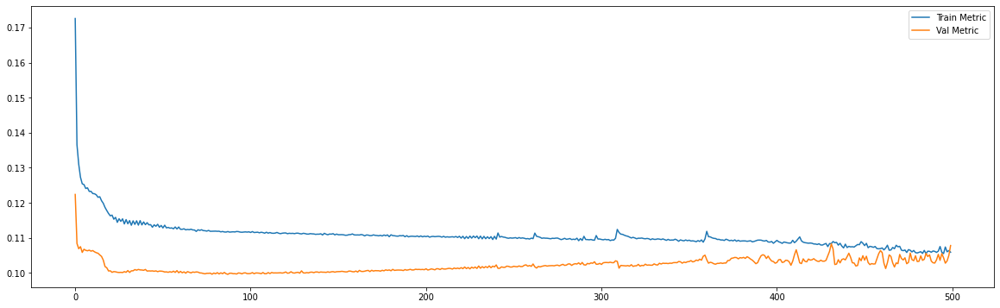

============================model:79===========================
39/39 [==============================] - 0s 10ms/step - loss: 0.0161 - mae: 0.0998
loss and metric train data [0.01614299602806568, 0.0998447835445404]
8/8 [==============================] - 0s 9ms/step - loss: 0.0192 - mae: 0.1076
loss and metric val data [0.01916361227631569, 0.10759592056274414]
8/8 [==============================] - 0s 10ms/step - loss: 0.0214 - mae: 0.1166
loss and metric test data [0.021428639069199562, 0.11660854518413544]


'neurons': 70, 'dropout': 0.4, 'time_steps': 60, 'batch_size':100, 'hidden_layers':2




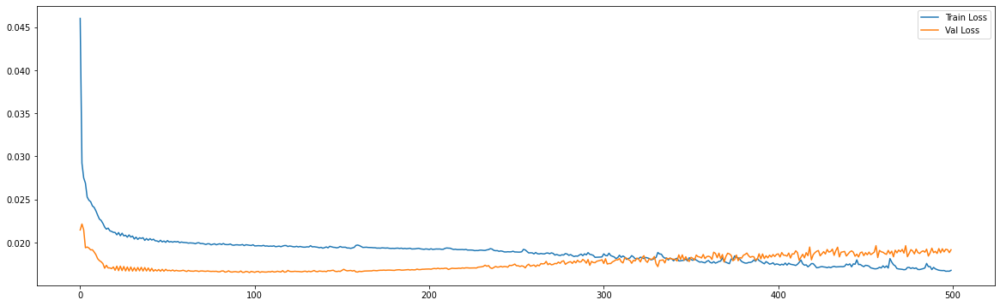

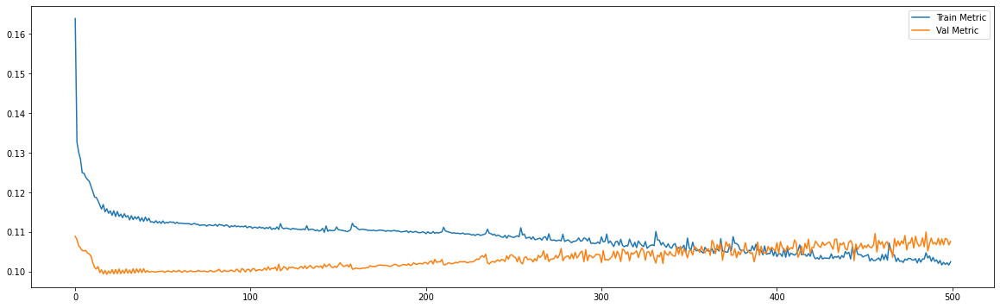

============================model:80===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0159 - mae: 0.0984
loss and metric train data [0.01586885191500187, 0.09836196899414062]
7/7 [==============================] - 0s 7ms/step - loss: 0.0219 - mae: 0.1161
loss and metric val data [0.021892746910452843, 0.11610027402639389]
7/7 [==============================] - 0s 7ms/step - loss: 0.0221 - mae: 0.1189
loss and metric test data [0.02213614620268345, 0.11891356855630875]


'neurons': 70, 'dropout': 0.4, 'time_steps': 84, 'batch_size':32, 'learning_rate':0.001, 'hidden_layers':1




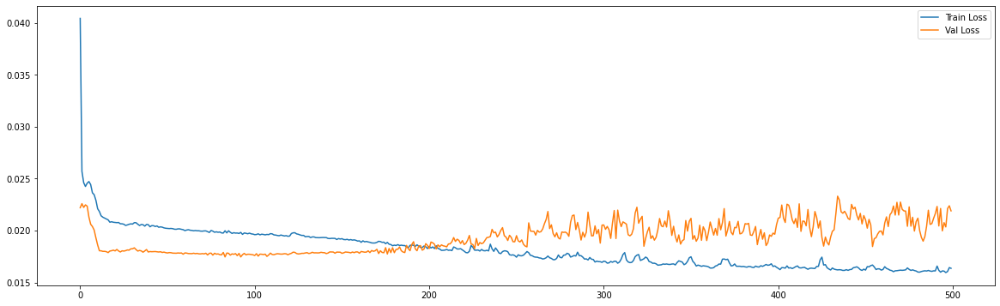

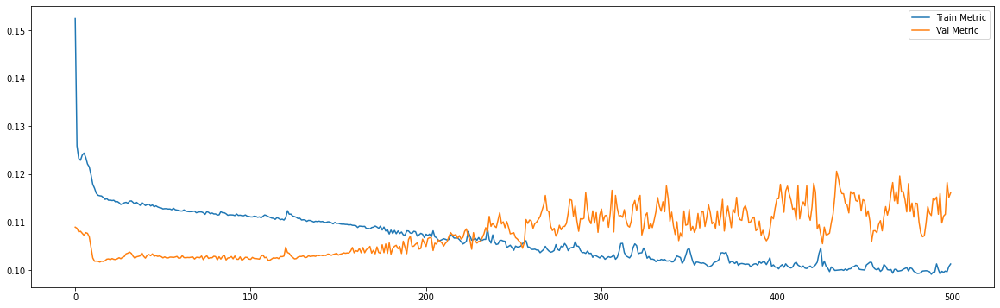

============================model:81===========================
37/37 [==============================] - 0s 13ms/step - loss: 0.0155 - mae: 0.0962
loss and metric train data [0.01553422212600708, 0.09618013352155685]
7/7 [==============================] - 0s 12ms/step - loss: 0.0226 - mae: 0.1160
loss and metric val data [0.022567415609955788, 0.11603935807943344]
7/7 [==============================] - 0s 12ms/step - loss: 0.0238 - mae: 0.1237
loss and metric test data [0.023751050233840942, 0.12366475909948349]


'neurons': 70, 'dropout': 0.4, 'time_steps': 84, 'batch_size':32, 'hidden_layers':2




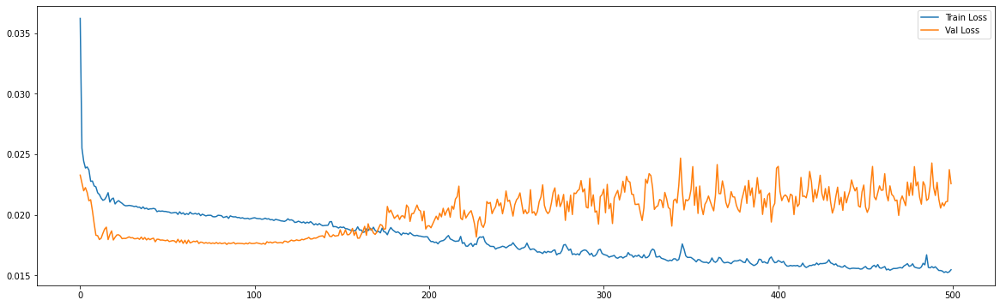

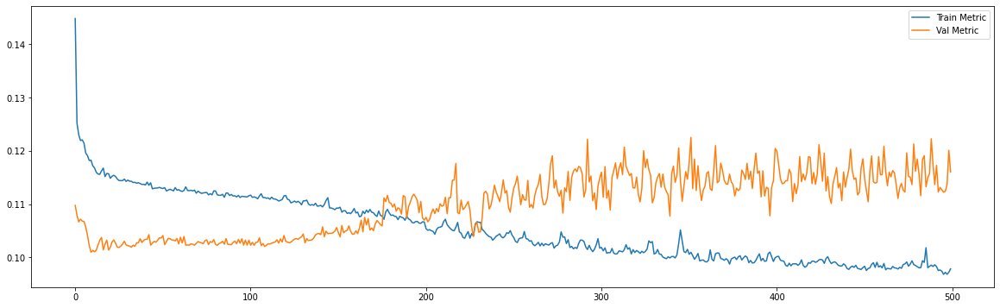

============================model:82===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0164 - mae: 0.1015
loss and metric train data [0.016369154676795006, 0.10154477506875992]
7/7 [==============================] - 0s 6ms/step - loss: 0.0200 - mae: 0.1123
loss and metric val data [0.020007681101560593, 0.11226511001586914]
7/7 [==============================] - 0s 6ms/step - loss: 0.0234 - mae: 0.1207
loss and metric test data [0.023352570831775665, 0.12072262167930603]


'neurons': 70, 'dropout': 0.4, 'time_steps': 84, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




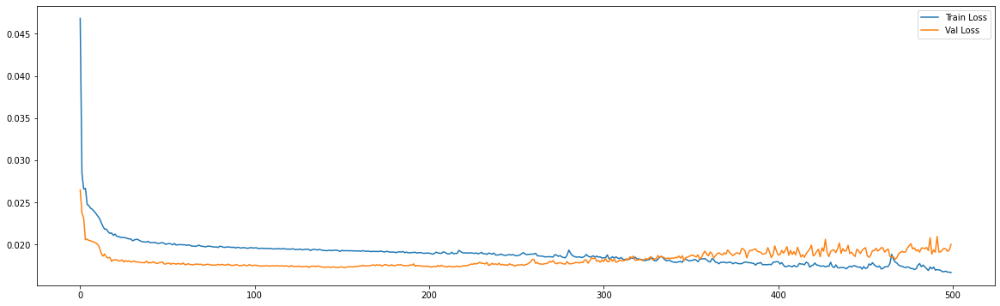

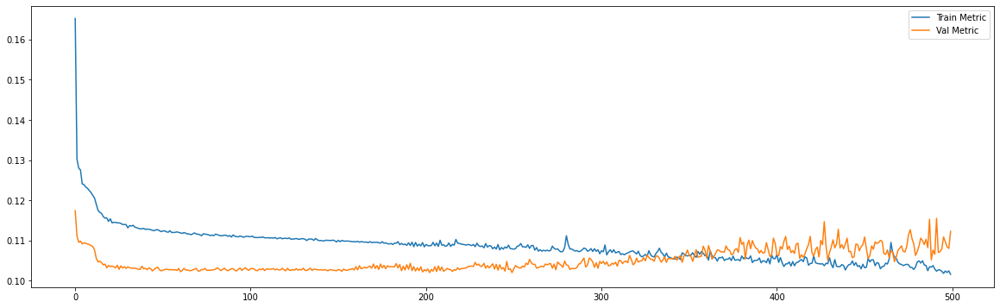

============================model:83===========================
37/37 [==============================] - 1s 14ms/step - loss: 0.0172 - mae: 0.1035
loss and metric train data [0.017201820388436317, 0.10348775237798691]
7/7 [==============================] - 0s 12ms/step - loss: 0.0213 - mae: 0.1133
loss and metric val data [0.02130362018942833, 0.1132652759552002]
7/7 [==============================] - 0s 12ms/step - loss: 0.0216 - mae: 0.1159
loss and metric test data [0.021601909771561623, 0.11590828746557236]


'neurons': 70, 'dropout': 0.4, 'time_steps': 84, 'batch_size':60, 'hidden_layers':2




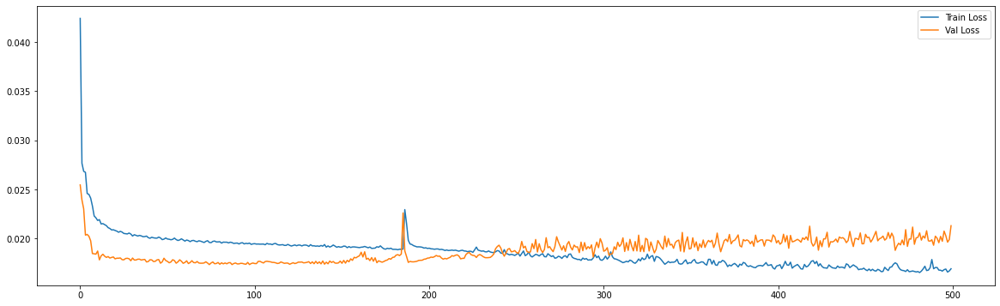

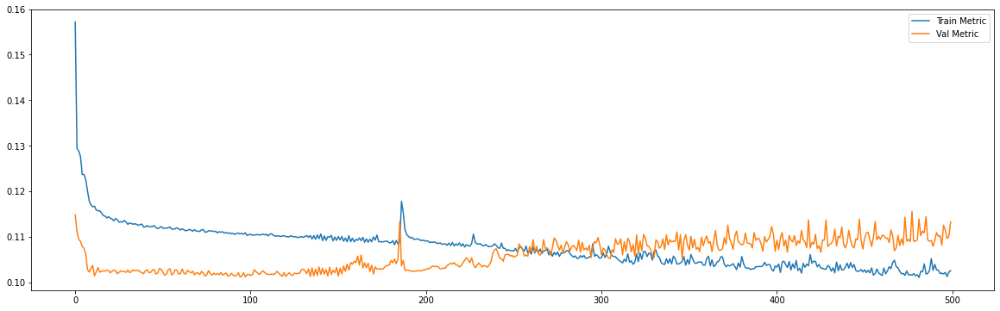

============================model:84===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0172 - mae: 0.1036
loss and metric train data [0.01715998351573944, 0.10359667986631393]
7/7 [==============================] - 0s 6ms/step - loss: 0.0205 - mae: 0.1119
loss and metric val data [0.02048140950500965, 0.11186365783214569]
7/7 [==============================] - 0s 6ms/step - loss: 0.0222 - mae: 0.1186
loss and metric test data [0.022216709330677986, 0.11856871843338013]


'neurons': 70, 'dropout': 0.4, 'time_steps': 84, 'batch_size':84, 'learning_rate':0.001, 'hidden_layers':1




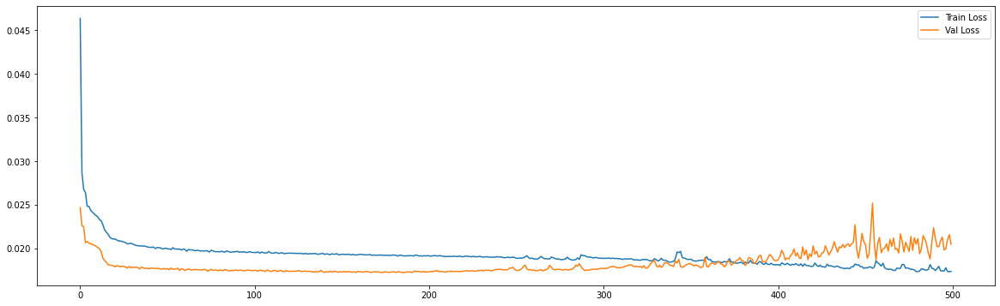

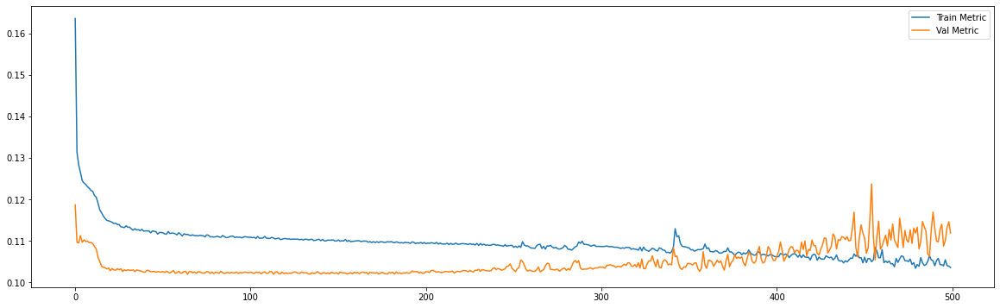

============================model:85===========================
37/37 [==============================] - 0s 13ms/step - loss: 0.0163 - mae: 0.1009
loss and metric train data [0.016321292147040367, 0.10093005001544952]
7/7 [==============================] - 0s 11ms/step - loss: 0.0201 - mae: 0.1109
loss and metric val data [0.02012007310986519, 0.11090318858623505]
7/7 [==============================] - 0s 11ms/step - loss: 0.0235 - mae: 0.1214
loss and metric test data [0.023475898429751396, 0.12142479419708252]


'neurons': 70, 'dropout': 0.4, 'time_steps': 84, 'batch_size':84, 'hidden_layers':2




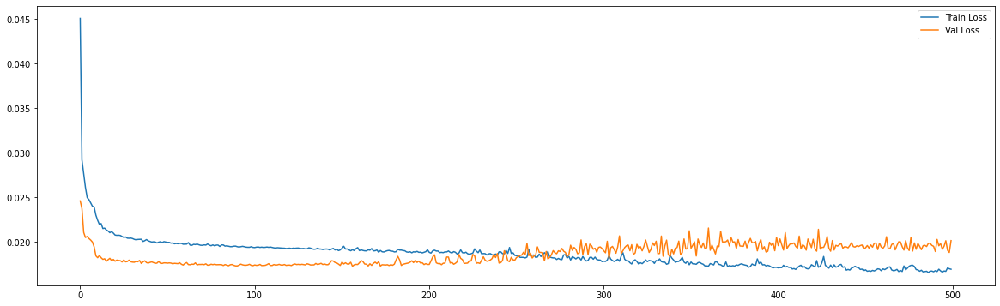

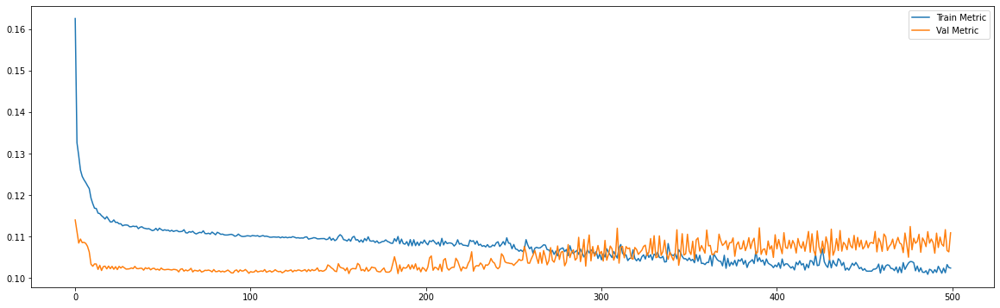

============================model:86===========================
37/37 [==============================] - 0s 7ms/step - loss: 0.0177 - mae: 0.1054
loss and metric train data [0.017666514962911606, 0.1053924486041069]
7/7 [==============================] - 0s 6ms/step - loss: 0.0183 - mae: 0.1046
loss and metric val data [0.01831042394042015, 0.10459769517183304]
7/7 [==============================] - 0s 6ms/step - loss: 0.0205 - mae: 0.1138
loss and metric test data [0.020502084866166115, 0.11383964866399765]


'neurons': 70, 'dropout': 0.4, 'time_steps': 84, 'batch_size':100, 'learning_rate':0.001, 'hidden_layers':1




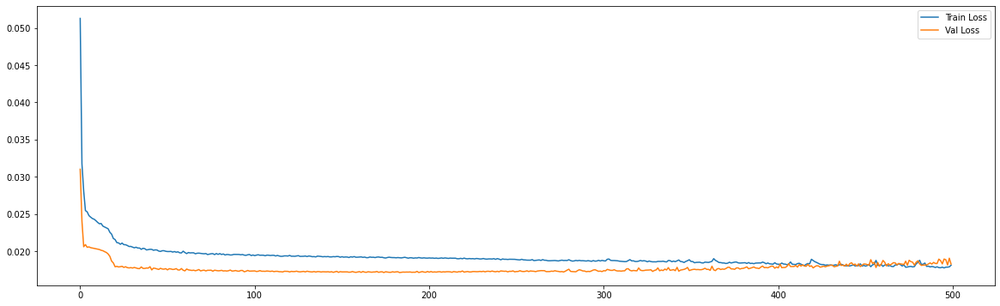

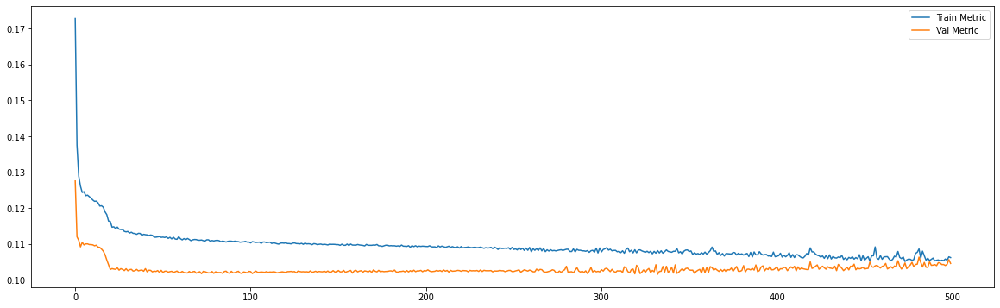

============================model:87===========================
37/37 [==============================] - 0s 13ms/step - loss: 0.0170 - mae: 0.1028
loss and metric train data [0.017007481306791306, 0.1027902141213417]
7/7 [==============================] - 0s 12ms/step - loss: 0.0195 - mae: 0.1094
loss and metric val data [0.019547155126929283, 0.10935159772634506]
7/7 [==============================] - 0s 11ms/step - loss: 0.0228 - mae: 0.1209
loss and metric test data [0.022779472172260284, 0.12089717388153076]


'neurons': 70, 'dropout': 0.4, 'time_steps': 84, 'batch_size':100, 'hidden_layers':2




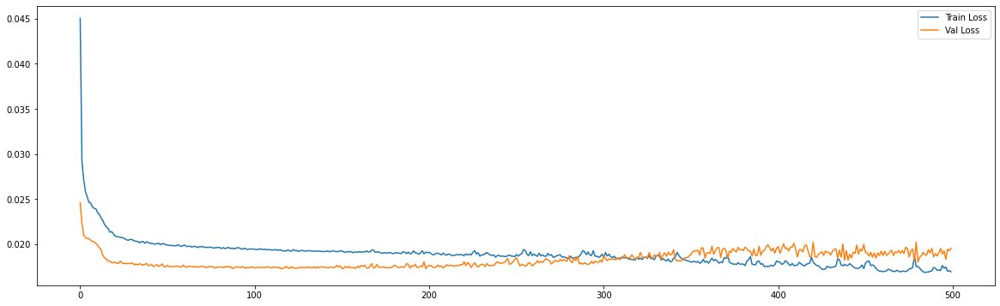

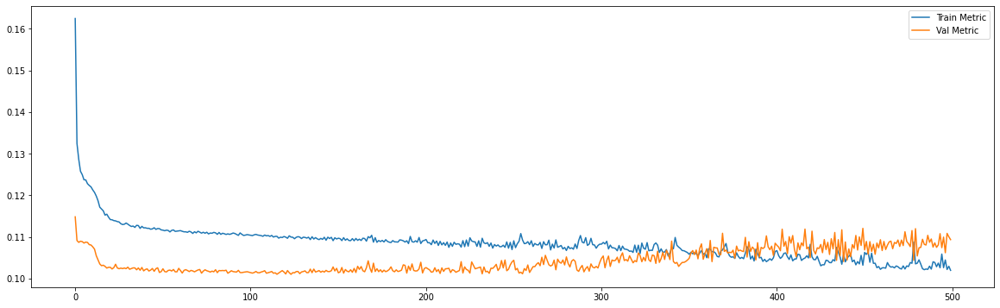

============================model:88===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0158 - mae: 0.0977
loss and metric train data [0.015819428488612175, 0.09772830456495285]
6/6 [==============================] - 0s 7ms/step - loss: 0.0210 - mae: 0.1130
loss and metric val data [0.021004436537623405, 0.11302203685045242]
6/6 [==============================] - 0s 8ms/step - loss: 0.0230 - mae: 0.1206
loss and metric test data [0.02298208698630333, 0.1205696240067482]


'neurons': 70, 'dropout': 0.4, 'time_steps': 100, 'batch_size':32, 'learning_rate':0.001, 'hidden_layers':1




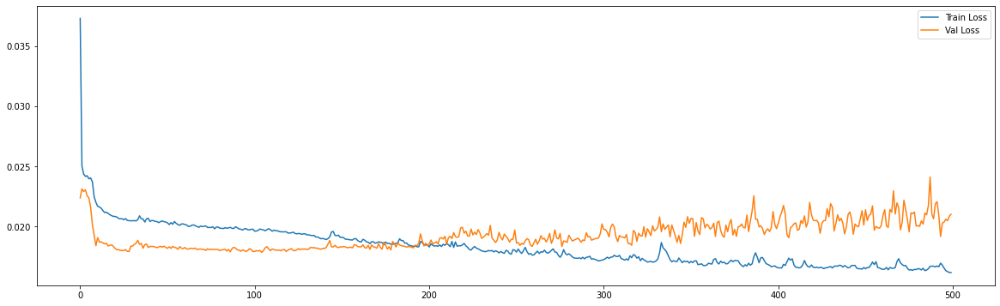

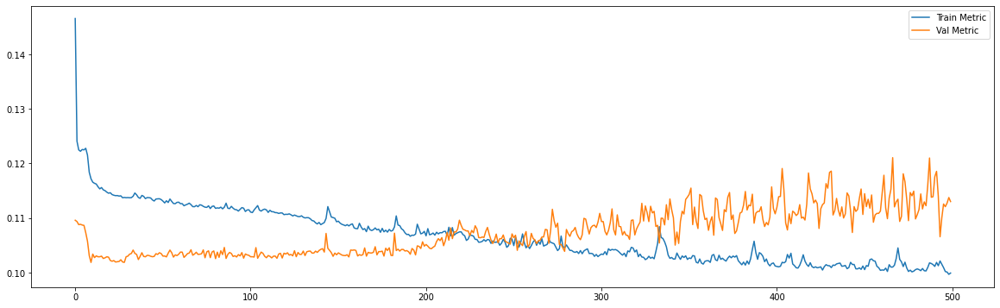

============================model:89===========================
36/36 [==============================] - 1s 16ms/step - loss: 0.0151 - mae: 0.0958
loss and metric train data [0.015079121105372906, 0.09575968235731125]
6/6 [==============================] - 0s 13ms/step - loss: 0.0214 - mae: 0.1124
loss and metric val data [0.021383611485362053, 0.11240129917860031]
6/6 [==============================] - 0s 13ms/step - loss: 0.0237 - mae: 0.1222
loss and metric test data [0.023719457909464836, 0.12221299856901169]


'neurons': 70, 'dropout': 0.4, 'time_steps': 100, 'batch_size':32, 'hidden_layers':2




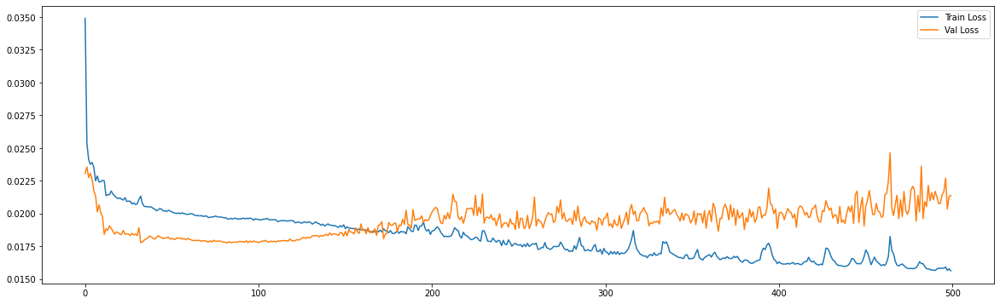

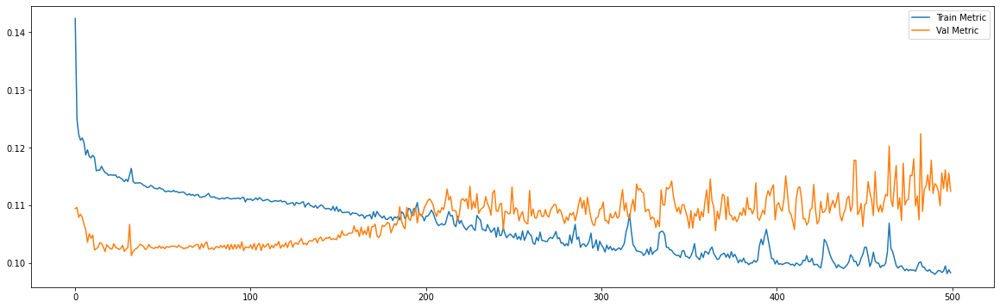

============================model:90===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0165 - mae: 0.1017
loss and metric train data [0.016474805772304535, 0.10170179605484009]
6/6 [==============================] - 0s 6ms/step - loss: 0.0210 - mae: 0.1147
loss and metric val data [0.020954428240656853, 0.11468403786420822]
6/6 [==============================] - 0s 6ms/step - loss: 0.0224 - mae: 0.1171
loss and metric test data [0.02242206037044525, 0.11711728572845459]


'neurons': 70, 'dropout': 0.4, 'time_steps': 100, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




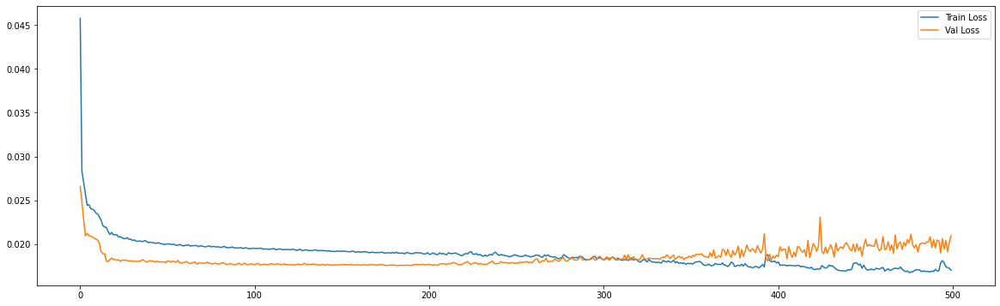

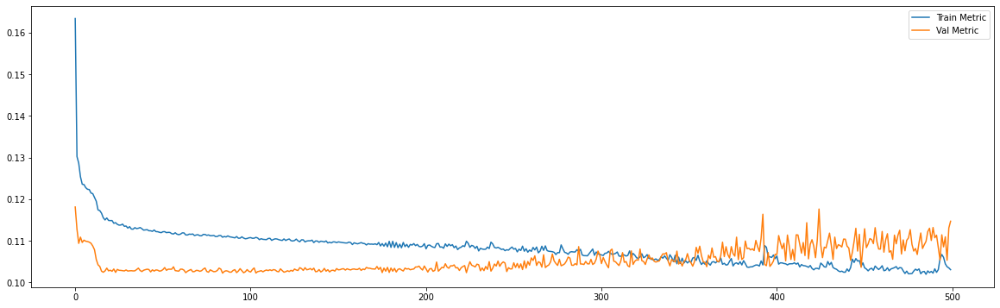

============================model:91===========================
36/36 [==============================] - 1s 16ms/step - loss: 0.0159 - mae: 0.1001
loss and metric train data [0.015927093103528023, 0.10013402253389359]
6/6 [==============================] - 0s 14ms/step - loss: 0.0205 - mae: 0.1138
loss and metric val data [0.02047748677432537, 0.11375968903303146]
6/6 [==============================] - 0s 13ms/step - loss: 0.0238 - mae: 0.1226
loss and metric test data [0.023846322670578957, 0.12255469709634781]


'neurons': 70, 'dropout': 0.4, 'time_steps': 100, 'batch_size':60, 'hidden_layers':2




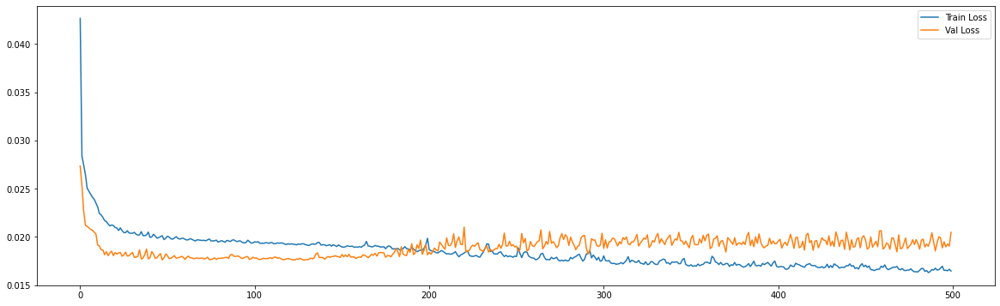

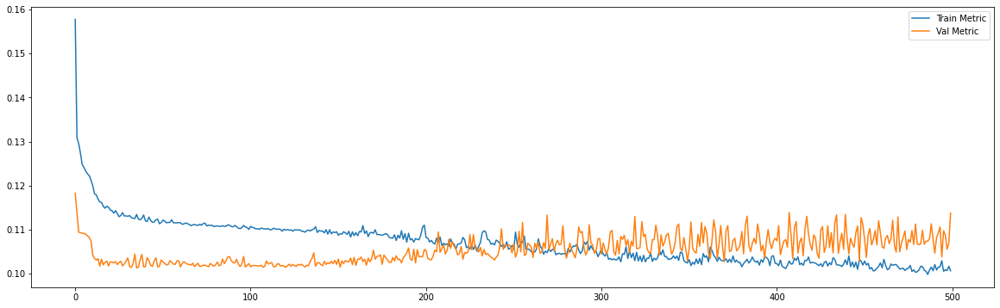

============================model:92===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0167 - mae: 0.1010
loss and metric train data [0.016658024862408638, 0.10103091597557068]
6/6 [==============================] - 0s 7ms/step - loss: 0.0194 - mae: 0.1056
loss and metric val data [0.01936020888388157, 0.10556038469076157]
6/6 [==============================] - 0s 7ms/step - loss: 0.0209 - mae: 0.1119
loss and metric test data [0.02094941772520542, 0.11185084283351898]


'neurons': 70, 'dropout': 0.4, 'time_steps': 100, 'batch_size':84, 'learning_rate':0.001, 'hidden_layers':1




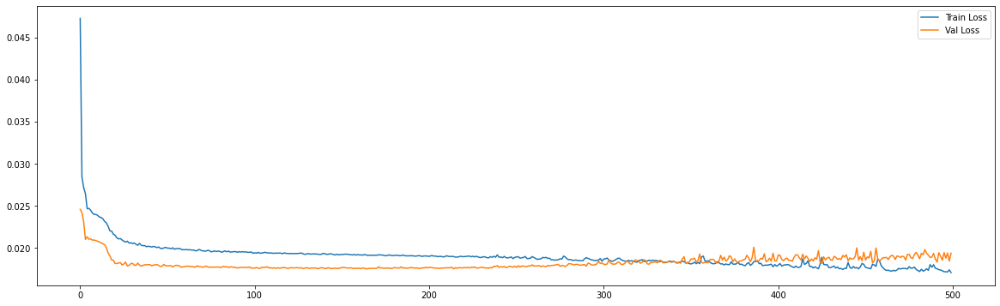

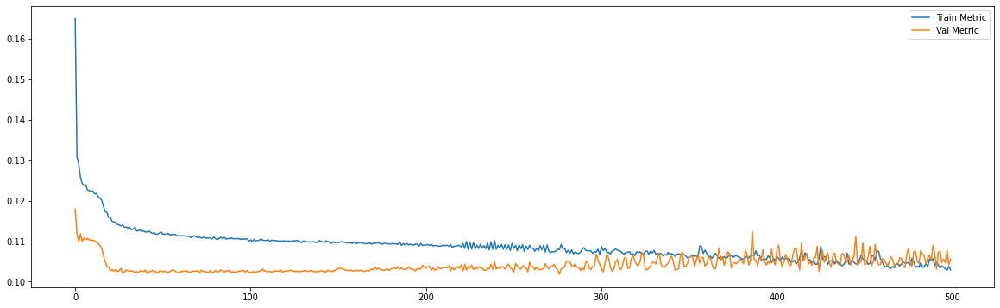

============================model:93===========================
36/36 [==============================] - 1s 16ms/step - loss: 0.0168 - mae: 0.1022
loss and metric train data [0.0168497022241354, 0.1022292897105217]
6/6 [==============================] - 0s 13ms/step - loss: 0.0188 - mae: 0.1081
loss and metric val data [0.018798207864165306, 0.10807587951421738]
6/6 [==============================] - 0s 14ms/step - loss: 0.0212 - mae: 0.1144
loss and metric test data [0.021226033568382263, 0.11439337581396103]


'neurons': 70, 'dropout': 0.4, 'time_steps': 100, 'batch_size':84, 'hidden_layers':2




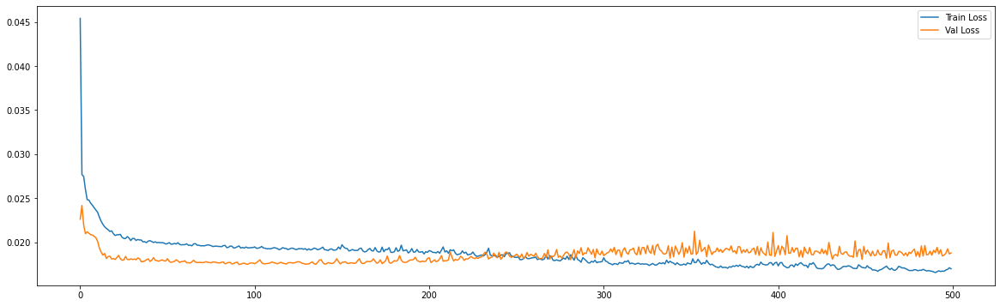

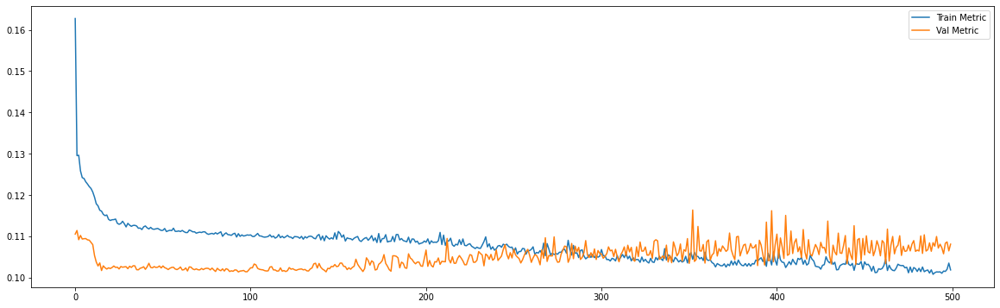

============================model:94===========================
36/36 [==============================] - 0s 8ms/step - loss: 0.0175 - mae: 0.1025
loss and metric train data [0.017467396333813667, 0.10252568125724792]
6/6 [==============================] - 0s 7ms/step - loss: 0.0189 - mae: 0.1056
loss and metric val data [0.01893663965165615, 0.10558819025754929]
6/6 [==============================] - 0s 8ms/step - loss: 0.0225 - mae: 0.1179
loss and metric test data [0.02247949130833149, 0.11793816089630127]


'neurons': 70, 'dropout': 0.4, 'time_steps': 100, 'batch_size':100, 'learning_rate':0.001, 'hidden_layers':1




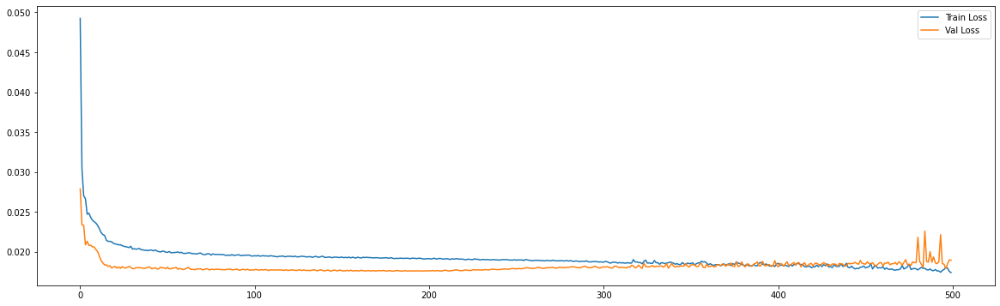

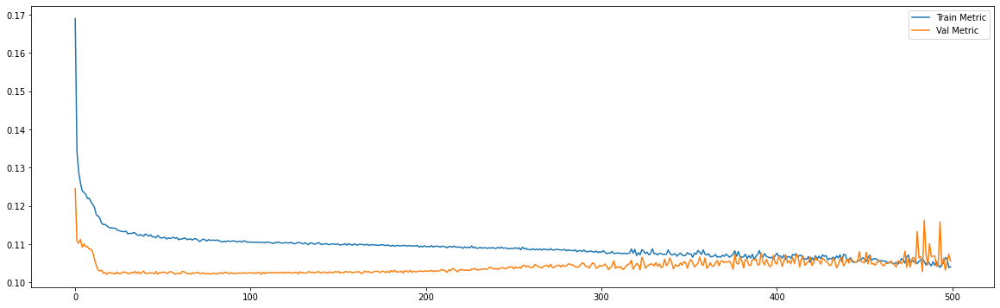

============================model:95===========================
36/36 [==============================] - 1s 16ms/step - loss: 0.0170 - mae: 0.1015
loss and metric train data [0.017006980255246162, 0.10154714435338974]
6/6 [==============================] - 0s 14ms/step - loss: 0.0184 - mae: 0.1033
loss and metric val data [0.018425509333610535, 0.1032627522945404]
6/6 [==============================] - 0s 14ms/step - loss: 0.0214 - mae: 0.1164
loss and metric test data [0.021417437121272087, 0.11635414510965347]


'neurons': 70, 'dropout': 0.4, 'time_steps': 100, 'batch_size':100, 'hidden_layers':2




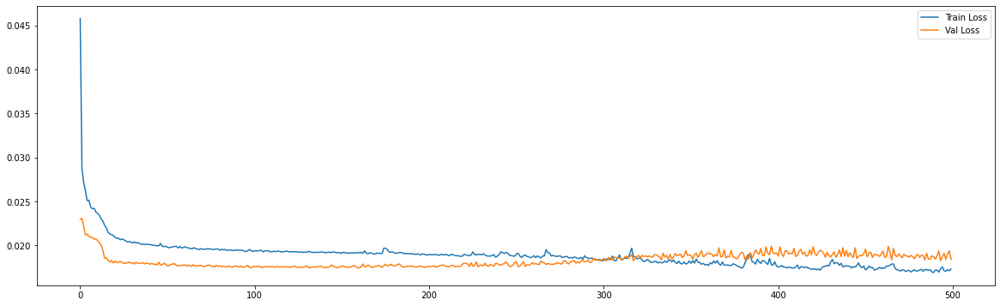

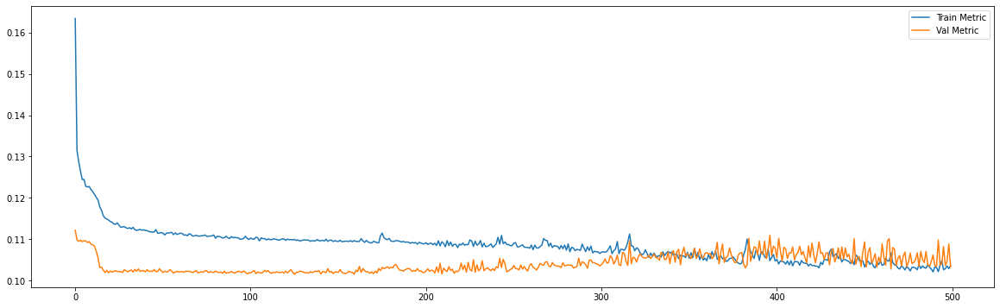

In [0]:
future_steps = 28
n_features = 1

neurons_list = [50,70]
dropout_list = [0.2,0.4]
time_steps_list = [60,84,100]
bach_list = [32,60,84,100]
lr_list = [0.001]
models = {}
i=0
for neurons in neurons_list:
  for dropout in dropout_list:
    for time_steps in time_steps_list:
      for batch in bach_list:
        for lr in lr_list:
          x_train,x_test,x_val,y_train,y_val,y_test = Regressor(future_steps = future_steps,time_steps = time_steps,n_features = n_features,df_train = df_train_norm,df_val = df_val_norm,df_test = df_test_norm)

          models[i] = {'neurons':neurons,'dropout':dropout,'time_steps': time_steps, 'batch_size':batch, 'learning_rate':lr}
          models[i]['resumo'] = "'neurons': {}, 'dropout': {}, 'time_steps': {}, 'batch_size':{}, 'learning_rate':{}, 'hidden_layers':{}".format(neurons,dropout,time_steps,batch,lr,1)

          # The LSTM architecture
          models[i]['model'] = Sequential()
          models[i]['model'].add(LSTM(units=neurons, return_sequences=False,input_shape=(time_steps, n_features))) # return_sequences=True next layer is LSTM
          models[i]['model'].add(Dropout(dropout))
          models[i]['model'].add(Dense(units=28))

          #Compiling the LSTM
          adam = optimizers.Adam(lr = lr, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
          models[i]['model'].compile(optimizer = adam, loss = 'mse', metrics=['mae'])

          #Fitting to traning set
          history = models[i]['model'].fit(x_train, y_train, validation_data=(x_val,y_val), epochs = 500, batch_size=batch, verbose = 0, shuffle= False)

          print('============================model:{}==========================='.format(i))

          
          print('loss and metric train data',models[i]['model'].evaluate(x_train,y_train))
          print('loss and metric val data',models[i]['model'].evaluate(x_val,y_val))
          print('loss and metric test data',models[i]['model'].evaluate(x_test,y_test))
          print('\n')

          print(models[i]['resumo'])
          print('\n')

          plt.figure(figsize=(20,6))
          plt.plot(history.history['loss'])
          plt.plot(history.history['val_loss'])
          plt.legend(['Train Loss', 'Val Loss'])

          plt.figure(figsize=(20,6))
          plt.plot(history.history['mae'])
          plt.plot(history.history['val_mae'])
          plt.legend(['Train Metric', 'Val Metric'])
          plt.show()

          # y_val_pred = models[i]['model'].predict(x_val)
          # plt.figure(figsize=(50,20))
          # plt.plot(y_val[:,0],marker='o')
          # plt.plot(y_val_pred[:,0],marker='o')
          # plt.show()
          i+=1


          models[i] = {'neurons':neurons,'dropout':dropout,'time_steps': time_steps, 'batch_size':batch}
          models[i]['resumo'] = "'neurons': {}, 'dropout': {}, 'time_steps': {}, 'batch_size':{}, 'hidden_layers':{}".format(neurons,dropout,time_steps,batch,2)

          # The LSTM architecture
          models[i]['model'] = Sequential()
          models[i]['model'].add(LSTM(units=neurons, return_sequences=True,input_shape=(time_steps, n_features))) # return_sequences=True next layer is LSTM
          models[i]['model'].add(Dropout(dropout))
          models[i]['model'].add(LSTM(units=neurons, return_sequences=False))
          models[i]['model'].add(Dropout(dropout))
          models[i]['model'].add(Dense(units=28))

          #Compiling the LSTM
          adam = optimizers.Adam(lr = lr, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
          models[i]['model'].compile(optimizer = adam, loss = 'mse', metrics=['mae'])

          #Fitting to traning set
          history = models[i]['model'].fit(x_train, y_train, validation_data=(x_val,y_val), epochs = 500, batch_size=batch, verbose = 0, shuffle= False)

          print('============================model:{}==========================='.format(i))

          
          print('loss and metric train data',models[i]['model'].evaluate(x_train,y_train))
          print('loss and metric val data',models[i]['model'].evaluate(x_val,y_val))
          print('loss and metric test data',models[i]['model'].evaluate(x_test,y_test))
          print('\n')

          print(models[i]['resumo'])
          print('\n')

          plt.figure(figsize=(20,6))
          plt.plot(history.history['loss'])
          plt.plot(history.history['val_loss'])
          plt.legend(['Train Loss', 'Val Loss'])

          plt.figure(figsize=(20,6))
          plt.plot(history.history['mae'])
          plt.plot(history.history['val_mae'])
          plt.legend(['Train Metric', 'Val Metric'])
          plt.show()

          # y_val_pred = models[i]['model'].predict(x_val)
          # plt.figure(figsize=(50,20))
          # plt.plot(y_val[:,0],marker='o')
          # plt.plot(y_val_pred[:,0],marker='o')
          # plt.show()

          i+=1

# Conclusion:

## The best model until now (model 14):

- 'neurons': 50, 'dropout': 0.2, 'time_steps': 84, 'batch_size':100, 'learning_rate':0.001, 'hidden_layers':1

- results: Train (loss: 0.0183 - mae: 0.1065), Validation (loss: 0.0176 - mae: 0.1023) and Test ( loss: 0.0204 - mae: 0.1128)


## I run again the network above to show the predictions, it's evident that the result is not good. In the others notebook there are differents approachs to improve the results.

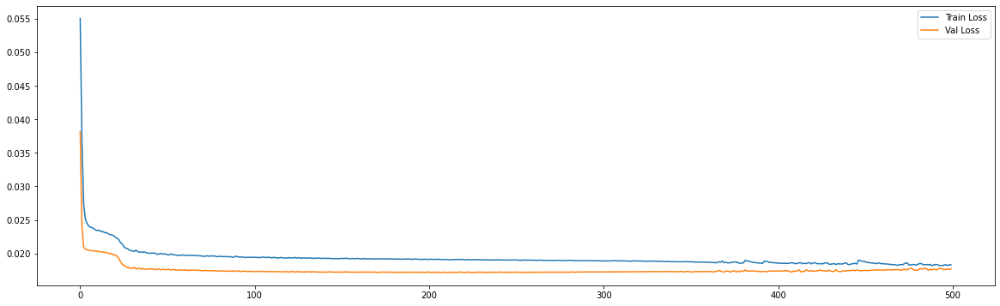

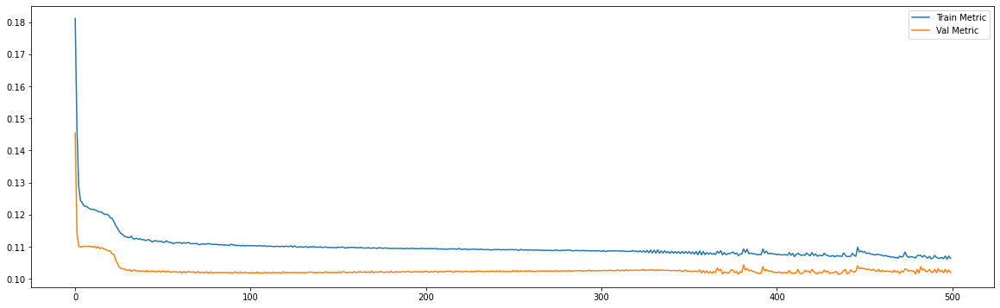



37/37 [==============================] - 0s 7ms/step - loss: 0.0181 - mae: 0.1052
loss and metric train data [0.018070127815008163, 0.10523022711277008]
7/7 [==============================] - 0s 6ms/step - loss: 0.0177 - mae: 0.1020
loss and metric val data [0.017743661999702454, 0.10201635211706161]
7/7 [==============================] - 0s 6ms/step - loss: 0.0211 - mae: 0.1146
loss and metric test data [0.021145623177289963, 0.11455166339874268]


In [9]:
time_steps = 84
future_steps = 28
n_features = df_train_norm.shape[1]
x_train,x_test,x_val,y_train,y_val,y_test = Regressor(future_steps = future_steps,time_steps = time_steps,n_features = n_features,df_train = df_train_norm,df_val = df_val_norm,df_test = df_test_norm)


regressor = Sequential()
regressor.add(LSTM(units=50, return_sequences=False, input_shape=(time_steps, n_features))) 
regressor.add(Dropout(0.2))
regressor.add(Dense(units=future_steps))

#Compiling the LSTM
adam = optimizers.Adam(lr = 0.001, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
regressor.compile(optimizer = adam, loss = 'mse', metrics=['mae'])

#Fitting to traning set
history = regressor.fit(x_train, y_train, validation_data=(x_val,y_val), 
                        epochs = 500, batch_size=100, verbose = 0, shuffle= False)

plt.figure(figsize=(20,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Val Loss'])

plt.figure(figsize=(20,6))
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.legend(['Train Metric', 'Val Metric'])
plt.show()

print('\n')
print('loss and metric train data',regressor.evaluate(x_train,y_train))
print('loss and metric val data',regressor.evaluate(x_val,y_val))
print('loss and metric test data',regressor.evaluate(x_test,y_test))

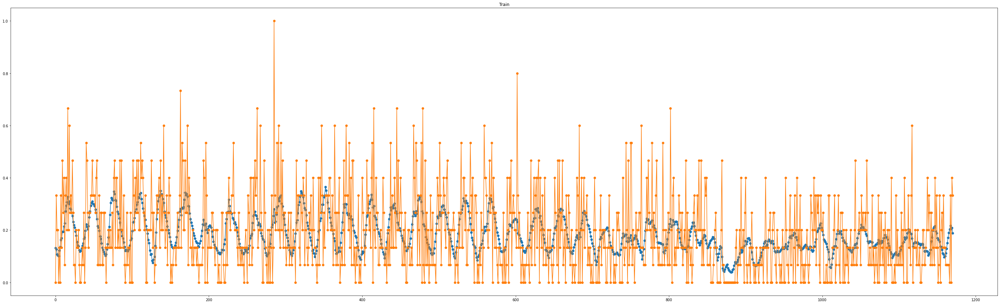

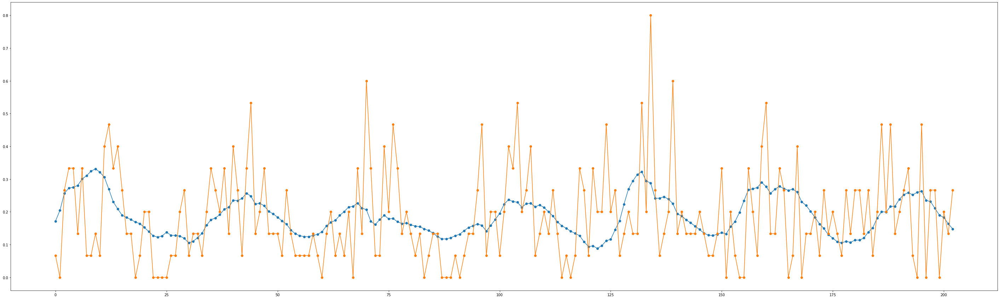

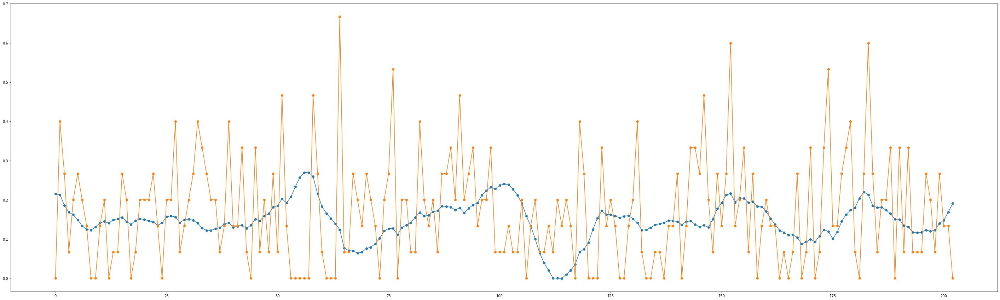

In [10]:
y_train_predict = regressor.predict(x_train)
y_val_predict = regressor.predict(x_val)
y_test_predict = regressor.predict(x_test)

plt.figure(figsize=(50,15))
plt.plot(y_train_predict[:,0],marker='o')
plt.plot(y_train[:,0],marker='o')
plt.title('Train')
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_val_predict[:,0],marker='o')
plt.plot(y_val[:,0],marker='o')

plt.figure(figsize=(50,15))
plt.plot(y_test_predict[:,0],marker='o')
plt.plot(y_test[:,0],marker='o')